In [1]:
import numpy as np
import matplotlib.pyplot as plt
from numpy.fft import rfft, irfft
from matplotlib.animation import FuncAnimation, PillowWriter
import fhd
import importlib
import time
import pandas as pd

importlib.reload(fhd)

<module 'fhd' from '/home/wout/Work/DIEP/fluctuating_hydro-main/fhd/__init__.py'>

# Schelling + Voter sweeps

We have ran simulations for fixed $D^a$ and a sweep over $D_v$ in four regimes:

- segregating $\kappa = \begin{pmatrix}0.6 & -0.4 \\ -0.4 & 0.6 \end{pmatrix}$
- integrating $\kappa = \begin{pmatrix}0.6 & 1 \\ 1 & 0.6 \end{pmatrix}$
- migrating $\kappa = \begin{pmatrix} 1 & 1 \\ -1 & 1 \end{pmatrix}$ 
- homogeneous mixing $\kappa = \begin{pmatrix}0 & 0 \\ 0 & 0 \end{pmatrix}$

Here we analyse the resulting runs can create figures for the paper manuscript

The runs were first performed without noise (deterministic Schelling + Voter currents) and then with noise (stochastic conservative Schelling noise + demographic Voter noise)



In [18]:
#Set parameters

D = 0.1*np.ones(2) # Schelling diffusion coefficient
Gamma = np.eye(2) # Utility nabla^3 term coefficient
beta = 10
Dv_space = np.linspace(0.01,0.2,20)
dt =1e-3
frames = 800
nsteps = 4_000_000
nsteps_wm = 2_000_000


regimes = ["segregating", "integrating", "migrating", "well-mixed"]
kappas = [np.array([[0.6, -0.4],[-0.4, 0.6]]), np.array([[0.6, 1], [1, 0.6]]),
np.array([[1, 1], [-1, 1]]), np.array([[0.6, 0.4], [0.6, 0.4]])]

param = {"D": D, "beta": beta, "h" : 0.01, "Gamma": Gamma}

# Cluster run analysis (deterministic)

In [20]:
# Load datasets new datasets:
df = pd.read_csv("processed_det_run2/masses_per_run.csv")
df_mpp = pd.read_csv("processed_det_run2/masses_by_parameter.csv")
df_obs = pd.read_csv("processed_det_run2/observables_spectra_per_run.csv")
df_obs_bp = pd.read_csv("processed_det_run2/observables_spectra_by_parameter.csv")

In [21]:
# Load previous datasets:
df_wm = pd.read_csv("processed_deterministic/masses_per_run.csv")
df_mpp_wm = pd.read_csv("processed_deterministic/masses_by_parameter.csv")
df_obs_wm = pd.read_csv("processed_deterministic/observables_spectra_per_run.csv")
df_obs_bp_wm = pd.read_csv("processed_deterministic/observables_spectra_by_parameter.csv")

In [22]:
df = pd.concat([df,df_wm[df_wm['regime'] == 'well-mixed']])
df_mpp = pd.concat([df_mpp,df_mpp_wm[df_mpp_wm['regime'] == 'well-mixed']])
df_obs = pd.concat([df_obs,df_obs_wm[df_obs_wm['regime'] == 'well-mixed']])
df_obs_bp = pd.concat([df_obs_bp,df_obs_bp_wm[df_obs_bp_wm['regime'] == 'well-mixed']])

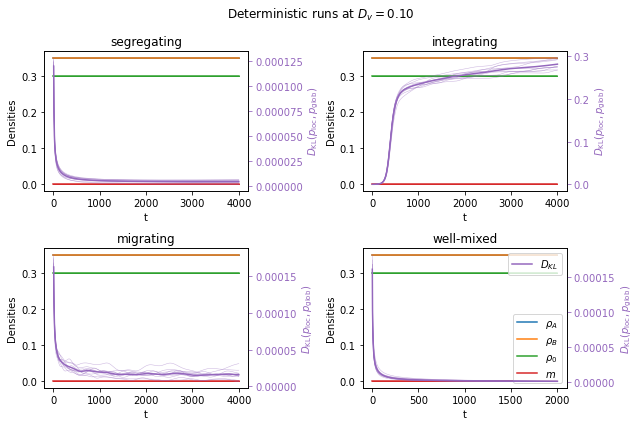

In [30]:
# Plot all runs dissimilarity and mass loss/difference in one plot:
D_v = 0.1


fig, axs = plt.subplots(2,2, figsize = (9,6))

for i_r, reg in enumerate(regimes):
    ax1 = axs.flatten()[i_r]
    ax2 = ax1.twinx()   
    phi_runs = []
    # Rel_ents = []

    for run in range(10):
        data = df[(df["regime"] == reg) & (df["D_v"] == D_v) & (df["n_run"] == run)]
        if reg == 'well-mixed':
            t = dt*nsteps_wm*data["snapshot"]/frames
        else:
            t = dt*nsteps*data["snapshot"]/frames   
        ax1.plot(t,data["rhoA"], color= 'C0', alpha = 0.5, lw=0.5)
        ax1.plot(t,data["rhoB"], color = 'C1', alpha = 0.5, lw=0.5)
        ax1.plot(t,data["rho0"], color = 'C2', alpha = 0.5, lw=0.5)
        ax1.plot(t,data["rhoA"]-data["rhoB"], color = 'C3', alpha = 0.5, lw=0.5)

        Rel_ent = data["DKL"]
        ax2.plot(t[1:], Rel_ent[1:], color = 'C4', alpha = 0.5, lw=0.5)
        
    data_pp = df_mpp[(df_mpp["regime"]== reg) & (df_mpp["D_v"] == D_v)]
    rhoA_mean = data_pp["rhoA_mean"]
    rhoB_mean = data_pp["rhoB_mean"]
    DKL_mean = data_pp['DKL_mean']

    ax1.plot(t,rhoA_mean, color= 'C0', label = r"$\rho_A$")
    ax1.plot(t,rhoB_mean, color = 'C1', label = r"$\rho_B$")
    ax1.plot(t,1-rhoA_mean-rhoB_mean, color = 'C2', label = r"$\rho_0$")
    ax1.plot(t,rhoA_mean-rhoB_mean, color = 'C3', label = r"$m$")

    # Ds = np.array([Rel_ent[:ep] for Rel_ent in Rel_ents]).mean(axis=0)
    ax2.plot(t[1:],DKL_mean[1:], color= 'C4', label = r"$D_{KL}$")

    ax1.set_title(f"{reg}")
    ax1.set_xlabel("t")
    ax1.set_ylabel("Densities")
    ax2.set_ylabel(r"$D_{\rm KL}(p_{\rm loc}, p_{\rm glob})$", color= 'C4')
    ax2.tick_params(axis='y', colors='C4')
    # labels = [r"$\rho_A$", r"$\rho_B$", r"$\rho_0$", r"$|m|$"]
ax1.legend(loc='lower right')
ax2.legend()
plt.suptitle(rf"Deterministic runs at $D_v = {D_v:.2f}$")
plt.tight_layout()
plt.show()

In [24]:
df.head()

,regime,D_v,n_run,snapshot,rhoA,rhoB,rho0,rho_occ,DKL
0,segregating,0.01,0,0,0.349856,0.350061,0.300083,0.699917,0.014320
1,segregating,0.01,0,1,0.349856,0.350061,0.300083,0.699917,0.000138
2,segregating,0.01,0,2,0.349856,0.350061,0.300083,0.699917,0.000099
3,segregating,0.01,0,3,0.349856,0.350061,0.300083,0.699917,0.000084
4,segregating,0.01,0,4,0.349856,0.350061,0.300083,0.699917,0.000077


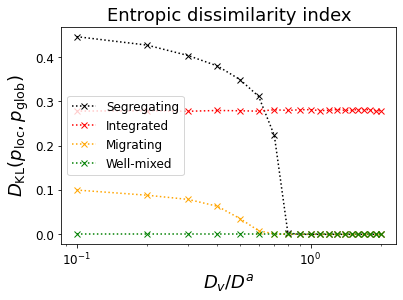

In [33]:
Dkl_indices = []
for reg in regimes:
    data = df[(df["regime"]==reg) & (df['snapshot']>=790)]
    group_mean = data.groupby(['D_v']).mean()
    group_std = data.groupby(['D_v']).std()
    Dkl_indices.append(group_mean["DKL"])

Dkl_indices = np.array(Dkl_indices).transpose()


plt.semilogx(Dv_space/D[0], Dkl_indices[:,0], "x:k", label = "Segregating")
plt.semilogx(Dv_space/D[0], Dkl_indices[:,1], "x:r", label = "Integrated")
plt.semilogx(Dv_space/D[0], Dkl_indices[:,2], "x:", color= 'orange', label = "Migrating")
plt.semilogx(Dv_space/D[0], Dkl_indices[:,3], "x:g", label = "Well-mixed")
# plt.semilogx(D[0]/Dv_space, Dkl_indices_mig[:], "x:", color='orange', label = "Migrating regime")
plt.xlabel(r"$D_v/D^a$", size=18)
plt.ylabel(r"$D_{\rm KL}(p_{\rm loc}, p_{\rm glob})$", size=18)
plt.title(r"Entropic dissimilarity index", size=18)
plt.xticks(size=12)
plt.yticks(size=12)
plt.legend(fontsize=12)
plt.show()

In [34]:
D_v = 0.01
k_bins = df_obs_bp[(df_obs_bp['regime']=='segregating') & (df_obs_bp['D_v'] == D_v)]['k'].values
num_bins = len(k_bins)+1

PS_matrix = np.zeros((len(Dv_space), len(regimes), 3, num_bins-1))
GAB_matrix = np.zeros((len(Dv_space), len(regimes), num_bins-1))

for i, dv in enumerate(Dv_space):
    for r, reg in enumerate(regimes):
        data = df_obs_bp[(df_obs_bp['regime']==reg) & (dv - 1e-10 < df_obs_bp['D_v']) & (df_obs_bp['D_v'] < dv + 1e-10)]
        GAB_matrix[i, r] = data['G_AB_mean']
        PS_matrix[i,r,0] = data["PS_A_mean"]
        PS_matrix[i,r,1] = data["PS_B_mean"]
        PS_matrix[i,r,2] = data["PS_0_mean"]

# df_masses = pd.read_csv("processed_FV_old/masses_by_parameter.csv")

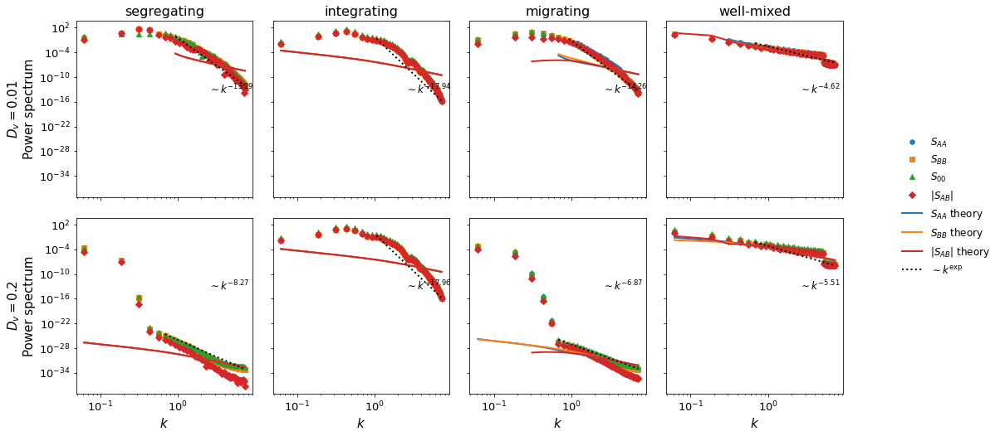

In [36]:
from fhd.structure_factor import *

regimes = ["segregating", "integrating", "migrating", "well-mixed"]

kappas = [
    np.array([[0.6, -0.4], [-0.4, 0.6]]),
    np.array([[0.6,  1.0], [ 1.0, 0.6]]),
    np.array([[1.0,  1.0], [-1.0, 1.0]]),
    np.array([[0.6,  0.4], [ 0.6, 0.4]])
]

Dv_indices = [0, 19]
dx = 50/128

# Large-k cutoff
k_max_cutoff = None

# Number of theory points to omit from display
theory_skip = 0
averaging_bp = -200

# ---------- styling for paper ----------
title_fs  = 16
label_fs  = 15
tick_fs   = 13
legend_fs = 12
text_fs   = 12

lw_th     = 2.0
lw_ref    = 2.0
ms        = 5.5

plt.rcParams.update({
    "font.size": tick_fs,
    "axes.labelsize": label_fs,
    "axes.titlesize": title_fs,
    "xtick.labelsize": tick_fs,
    "ytick.labelsize": tick_fs,
    "legend.fontsize": legend_fs,
})

# ---------- helper functions ----------
def fit_amplitude_logspace(theory, data):
    """
    Fit a multiplicative amplitude amp in log-space:
        log(data) ~ log(amp) + log(theory)
    """
    valid = (
        np.isfinite(theory) & np.isfinite(data) &
        (theory > 0) & (data > 0)
    )

    if not np.any(valid):
        return 1.0

    log_amp = np.mean(np.log(data[valid]) - np.log(theory[valid]))
    return np.exp(log_amp)


def get_k_mask(k_bins, k_max_cutoff=None):
    mask = (k_bins > 0)
    if k_max_cutoff is not None:
        mask &= (k_bins <= k_max_cutoff)
    return mask


def get_dynamic_fit_mask(k_bins, k_mask, power_spectra, G_AB, n_after_peak=2):
    """
    Start the fit 2 points after the maximum of the data envelope
    from S_AA, S_BB, and |S_AB|.
    """
    envelope = np.nanmax(
        np.vstack([
            np.where(k_mask, power_spectra[0], np.nan),
            np.where(k_mask, power_spectra[1], np.nan),
            np.where(k_mask, np.abs(G_AB), np.nan)
        ]),
        axis=0
    )

    if np.all(np.isnan(envelope)):
        idx_start = 1
    else:
        idx_start = np.nanargmax(envelope) + n_after_peak

    idx = np.arange(len(k_bins))
    fit_mask = k_mask & (idx >= idx_start)

    if np.sum(fit_mask) < 3:
        fit_mask = k_mask & (idx >= max(1, idx_start - n_after_peak))

    return fit_mask


def fit_power_law_tail(k, y, n_after_peak=2, min_points=4):
    """
    Fit a power law y ~ A * k^exp to the high-k tail of y.

    The fit starts 2 points after the maximum of y and uses the rest
    of the available k-range. The fit is done in log-log space:
        log(y) = log(A) + exp * log(k)

    Returns
    -------
    exp_fit : float
        Fitted exponent.
    A_fit : float
        Fitted prefactor.
    tail_mask : boolean array
        Mask of the points used in the fit, in the coordinates of k and y.
    """
    valid = np.isfinite(k) & np.isfinite(y) & (k > 0) & (y > 0)

    k_valid = k[valid]
    y_valid = y[valid]

    if len(k_valid) < min_points:
        return np.nan, np.nan, np.zeros_like(k, dtype=bool)

    peak_idx = np.argmax(y_valid)
    start_idx = peak_idx + n_after_peak

    if start_idx >= len(k_valid) - min_points:
        start_idx = max(0, len(k_valid) - min_points)

    k_tail = k_valid[start_idx:]
    y_tail = y_valid[start_idx:]

    if len(k_tail) < 2:
        return np.nan, np.nan, np.zeros_like(k, dtype=bool)

    coeffs = np.polyfit(np.log(k_tail), np.log(y_tail), 1)
    exp_fit = coeffs[0]
    logA_fit = coeffs[1]
    A_fit = np.exp(logA_fit)

    tail_mask = np.zeros_like(k, dtype=bool)
    valid_indices = np.where(valid)[0]
    tail_indices = valid_indices[start_idx:]
    tail_mask[tail_indices] = True

    return exp_fit, A_fit, tail_mask


def add_fitted_powerlaw_reference(ax, k, y, exp_fit, tail_mask, 
                                  vertical_shift=2.5, label=None):
    """
    Add a reference line y_ref ~ k^exp_fit over the tail region.
    The line is shifted upward by 'vertical_shift' to avoid overlap.
    """
    if np.isnan(exp_fit):
        return

    if np.sum(tail_mask) < 2:
        return

    k_tail = k[tail_mask]
    y_tail = y[tail_mask]

    valid = np.isfinite(k_tail) & np.isfinite(y_tail) & (k_tail > 0) & (y_tail > 0)
    k_tail = k_tail[valid]
    y_tail = y_tail[valid]

    if len(k_tail) < 2:
        return

    # Anchor the guide line near the first point of the fitted tail,
    # but place it somewhat above the data/theory.
    k0 = k_tail[0]
    y0 = vertical_shift * y_tail[0]

    y_ref = y0 * (k_tail / k0) ** exp_fit

    ax.plot(k_tail, y_ref, "k:", lw=lw_ref, label=label)


# ---------- figure ----------
fig, axes = plt.subplots(
    nrows=2,
    ncols=4,
    figsize=(16, 8),
    sharex=True,
    sharey=True
)

for row_idx, Dv_idx in enumerate(Dv_indices):

    Dv = Dv_space[Dv_idx]

    for regime_idx, regime in enumerate(regimes):

        ax = axes[row_idx, regime_idx]

        param_panel = {'h': 0.01, 'D': 0.1*np.ones(2), 'Gamma': np.eye(2), 'beta': 10}
        param_panel["kappa"] = kappas[regime_idx]
        param_panel["D_v"] = Dv

        power_spectra = PS_matrix[Dv_idx, regime_idx]
        G_AB = GAB_matrix[Dv_idx, regime_idx]

        # compute theory
        S_AA_theory = np.zeros(len(k_bins), dtype=complex)
        S_AB_theory = np.zeros(len(k_bins), dtype=complex)
        S_BB_theory = np.zeros(len(k_bins), dtype=complex)

        data_pp = df_mpp[(df_mpp["regime"]== regime) & (df_mpp["D_v"] == Dv)]
        rhoA_mean = data_pp["rhoA_mean"]
        rhoB_mean = data_pp["rhoB_mean"]

        phi_A_mean = rhoA_mean[averaging_bp:].mean()
        phi_B_mean = rhoB_mean[averaging_bp:].mean()

        for i, k in enumerate(k_bins):
            structure_factors = structure_factor(
                k,
                phi_A_mean,
                phi_B_mean,
                param_panel
            )
            S_AA_theory[i] = structure_factors[0, 0]
            S_AB_theory[i] = structure_factors[0, 1]
            S_BB_theory[i] = structure_factors[1, 1]

        # masks
        k_mask = get_k_mask(k_bins, k_max_cutoff=k_max_cutoff)
        fit_mask = get_dynamic_fit_mask(
            k_bins, k_mask, power_spectra, G_AB, n_after_peak=2
        )

        # optionally also remove the first displayed theory points from the fit
        theory_indices_all = np.where(k_mask)[0]
        if len(theory_indices_all) > theory_skip:
            fit_mask[theory_indices_all[:theory_skip]] = False

        # log-space amplitude fit
        theory_fit = np.vstack([
            S_AA_theory[fit_mask].real,
            S_BB_theory[fit_mask].real,
            np.abs(S_AB_theory[fit_mask])
        ])

        data_fit = np.vstack([
            power_spectra[0, fit_mask],
            power_spectra[1, fit_mask],
            np.abs(G_AB[fit_mask])
        ])

        amp = fhd.fit_amplitude_logspace(theory_fit, data_fit)

        # plotting mask
        plot_mask = k_mask
        k_plot = k_bins[plot_mask]

        # theory display mask: skip first few displayed theory points
        theory_indices = np.where(plot_mask)[0]
        theory_plot_indices = theory_indices[theory_skip:]

        # ---------- DATA: markers only ----------
        ax.plot(
            k_plot, power_spectra[0, plot_mask],
            linestyle="None", marker="o", color="tab:blue",
            ms=ms, label=r"$S_{AA}$"
        )
        ax.plot(
            k_plot, power_spectra[1, plot_mask],
            linestyle="None", marker="s", color="tab:orange",
            ms=ms, label=r"$S_{BB}$"
        )
        ax.plot(
            k_plot, power_spectra[2, plot_mask],
            linestyle="None", marker="^", color="tab:green",
            ms=ms, label=r"$S_{00}$"
        )
        ax.plot(
            k_plot, np.abs(G_AB[plot_mask]),
            linestyle="None", marker="D", color="tab:red",
            ms=ms, label=r"$|S_{AB}|$"
        )

        # ---------- THEORY ----------
        k_AA = k_bins[theory_plot_indices]
        S_AA_plot = S_AA_theory[theory_plot_indices].real
        ax.plot(
            k_AA[S_AA_plot>0],
            amp * S_AA_plot[S_AA_plot>0],
            "-", color="tab:blue", lw=lw_th, label=r"$S_{AA}$ theory"
        )

        k_BB = k_bins[theory_plot_indices]
        S_BB_plot = S_BB_theory[theory_plot_indices].real
        ax.plot(
            k_BB[S_BB_plot>0],
            amp * S_BB_plot[S_BB_plot>0],
            "-", color="tab:orange", lw=lw_th, label=r"$S_{BB}$ theory"
        )
        k_AB = k_bins[theory_plot_indices]
        S_AB_plot = S_AB_theory[theory_plot_indices].real        
        ax.plot(
            k_AB[S_AB_plot<0],
            - amp * S_AB_plot[S_AB_plot<0],
            "-", color="tab:red", lw=lw_th, label=r"$|S_{AB}|$ theory"
        )

        # ---------- fit S_AA tail exponent and add reference ----------
        SAA_plot = power_spectra[0, plot_mask]

        exp_fit, A_fit, tail_mask_local = fit_power_law_tail(
            k_plot, SAA_plot, n_after_peak=5, min_points=4
        )

        add_fitted_powerlaw_reference(
            ax,
            k_plot,
            SAA_plot,
            exp_fit,
            tail_mask_local,
            vertical_shift=2.5,
            label=r"$\sim k^{\mathrm{exp}}$" if (row_idx == 0 and regime_idx == 0) else None
        )

        # add text with fitted exponent
        if np.isfinite(exp_fit):
            exp_text = fr"$\sim k^{{{exp_fit:.2f}}}$"
        else:
            exp_text = r"$\sim k^{\mathrm{nan}}$"

        ax.text(
            0.75, 0.65,
            exp_text,
            transform=ax.transAxes,
            fontsize=text_fs,
            va="top",
            ha="left"
        )

        # axes formatting
        ax.set_xscale("log")
        ax.set_yscale("log")
        ax.set_box_aspect(1)

        if row_idx == 0:
            ax.set_title(regime)

        if regime_idx == 0:
            ax.set_ylabel(fr"$D_v = {param_panel['D_v']}$" + "\nPower spectrum")

        if row_idx == 1:
            ax.set_xlabel(r"$k$")

        ax.tick_params(axis='both', which='both', labelsize=tick_fs)

# global legend
handles, labels = axes[0, 0].get_legend_handles_labels()
fig.legend(
    handles, labels,
    loc="center right",
    bbox_to_anchor=(1.05, 0.5),
    frameon=False,
    fontsize=legend_fs
)

# fig.suptitle("Power spectra across regimes and $D_v$", fontsize=title_fs + 2) 

plt.tight_layout(rect=[0, 0, 0.9, 0.95])
# plt.savefig("images/Schelling_Voter_PS_FV.pdf")
plt.show()

In [37]:
df_obs.head()

,regime,D_v,n_run,n_steady_snapshots,H_mean,H_std_time,D_mean,D_std_time,DKL_mean,DKL_std_time,kmean_AB,kpeak_A,k_bin,k,PS_A,PS_B,PS_0,G_AB
0,segregating,0.01,0,200,0.81857,0.011398,1.203554,0.012799,0.448068,0.007496,0.35157,0.309186,0,0.061837,0.592787,0.038635,0.448758,-0.091332
1,segregating,0.01,0,200,0.81857,0.011398,1.203554,0.012799,0.448068,0.007496,0.35157,0.309186,1,0.185512,4.935223,4.863443,5.593206,-2.102730
2,segregating,0.01,0,200,0.81857,0.011398,1.203554,0.012799,0.448068,0.007496,0.35157,0.309186,2,0.309186,69.597965,72.414193,3.604609,-69.203774
3,segregating,0.01,0,200,0.81857,0.011398,1.203554,0.012799,0.448068,0.007496,0.35157,0.309186,3,0.432861,27.643489,22.048994,3.246891,-23.222796
4,segregating,0.01,0,200,0.81857,0.011398,1.203554,0.012799,0.448068,0.007496,0.35157,0.309186,4,0.556536,4.069702,3.221933,5.090121,-1.100757


In [ ]:
me

In [45]:
mean_k

n_run  n_steady_snapshots        H_mean    H_std_time  \
regime      D_v                                                           
integrating 0.01    4.5               200.0  3.124576e-07  2.846730e-08   
            0.02    4.5               200.0  2.562064e-07  2.753128e-08   
            0.03    4.5               200.0  2.102813e-07  2.620677e-08   
            0.04    4.5               200.0  1.600897e-07  2.163710e-08   
            0.05    4.5               200.0  1.170502e-07  1.649963e-08   
...                 ...                 ...           ...           ...   
well-mixed  0.16    4.5               200.0  1.321898e-07  2.285550e-08   
            0.17    4.5               200.0  1.045621e-07  1.842536e-08   
            0.18    4.5               200.0  8.689883e-08  1.598479e-08   
            0.19    4.5               200.0  6.455089e-08  1.250985e-08   
            0.20    4.5               200.0  6.513780e-08  1.300879e-08   

                    D_mean  D_std_time      DKL_mean  DKL_std_time  kmean_AB  \
regime      D_v                                                                
integrating 0.01  0.910984    0.005184  2.736215e-01  2.845559e-03  0.433548   
            0.02  0.911561    0.005597  2.740178e-01  3.037859e-03  0.431993   
            0.03  0.908615    0.005754  2.724071e-01  3.089072e-03  0.433478   
            0.04  0.910826    0.006760  2.735857e-01  3.608559e-03  0.432255   
            0.05  0.909482    0.006642  2.728865e-01  3.514719e-03  0.433376   
...                    ...         ...           ...           ...       ...   
well-mixed  0.16  0.001136    0.000077  4.482486e-07  6.126527e-08  0.132319   
            0.17  0.001239    0.000081  5.177516e-07  6.833663e-08  0.131655   
            0.18  0.001168    0.000077  4.822113e-07  6.418237e-08  0.132581   
            0.19  0.001148    0.000075  4.647927e-07  6.022826e-08  0.132064   
            0.20  0.001200    0.000077  4.986584e-07  6.471020e-08  0.132189   

                   kpeak_A  k_bin         k      PS_A      PS_B      PS_0  \
regime      D_v                                                             
integrating 0.01  0.432861    0.0  0.061837  0.013055  0.012557  0.050496   
            0.02  0.432861    0.0  0.061837  0.013315  0.012364  0.050755   
            0.03  0.432861    0.0  0.061837  0.009815  0.009037  0.037206   
            0.04  0.420494    0.0  0.061837  0.010107  0.009190  0.038223   
            0.05  0.420494    0.0  0.061837  0.009542  0.008963  0.036753   
...                    ...    ...       ...       ...       ...       ...   
well-mixed  0.16  0.097894    0.0  0.097894  1.165221  1.855983  4.018620   
            0.17  0.097894    0.0  0.097894  1.278551  1.970668  4.885611   
            0.18  0.097894    0.0  0.097894  1.204410  1.754686  4.577348   
            0.19  0.097894    0.0  0.097894  1.186707  1.579440  4.538660   
            0.20  0.097894    0.0  0.097894  1.257706  1.685922  4.882182   

                      G_AB  
regime      D_v             
integrating 0.01  0.012442  
            0.02  0.012538  
            0.03  0.009177  
            0.04  0.009463  
            0.05  0.009124  
...                    ...  
well-mixed  0.16  0.498708  
            0.17  0.818196  
            0.18  0.809126  
            0.19  0.886256  
            0.20  0.969277  

[80 rows x 16 columns]

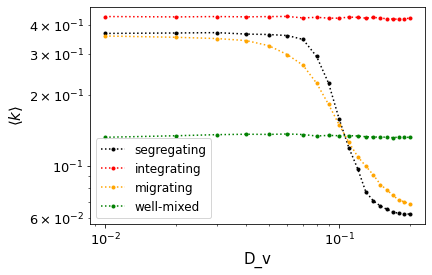

In [ ]:
from scipy.stats import linregress
# D_v = 0.01
data = df_obs[(df_obs['k_bin']==0)]
mean_k = data.groupby(['regime', "D_v"]).mean()
# t = np.arange(1,frames+1,1)*dt

# x = np.log(t)
# y = np.log(mean_k)

# res_early = linregress(x[1:20],y[1:20])

# res = linregress(x[50:],y[50:])

# slope = res.slope
# a = np.exp(res.intercept)

# slope_early = res_early.slope
# a_early = np.exp(res_early.intercept)

# kappa = kappas[reg_idx]
# inv_kmean = 1/np.array(mean_k)
plt.loglog(Dv_space,mean_k.loc['segregating']['kmean_AB'], '.:k', label = "segregating")
plt.loglog(Dv_space,mean_k.loc['integrating']['kmean_AB'], '.:r', label = "integrating")
plt.loglog(Dv_space,mean_k.loc['migrating']['kmean_AB'], '.:', color= 'orange', label = "migrating")
plt.loglog(Dv_space,mean_k.loc['well-mixed']['kmean_AB'], '.:g', label = "well-mixed")
plt.xlabel("$D_v$")
# plt.title(fr"$D^a = {param['D'][0]},  \kappa = [[{kappa[0,0]:.1f},{kappa[0,1]:.1f}],[{kappa[1,0]:.1f},{kappa[1,1]:.1f}]], D_v = {param['D_v']}, h = {param['h']}$")
plt.ylabel(r"$\langle k \rangle$")
# plt.loglog(t, t**(-1/3) , label = r"$\sim t^{-1/3}$")
# plt.loglog(t, t**(-1/4) , label = r"$\sim t^{-1/4}$")
# plt.loglog(t, a*t**slope, ":k", label = rf"Fit with slope {slope:.2f}")
# plt.loglog(t, a_early*t**slope_early, ":r", label = rf"Fit with slope {slope_early:.2f}")
plt.legend()
plt.show()

# Cluster run stochastic (redistribute method)

In [29]:
# Load datasets:
df = pd.read_csv("processed_stochastic/masses_per_run.csv")
df_mpp = pd.read_csv("processed_stochastic/masses_by_parameter.csv")
df_obs = pd.read_csv("processed_stochastic/observables_spectra_per_run.csv")
df_obs_bp = pd.read_csv("processed_stochastic/observables_spectra_by_parameter.csv")

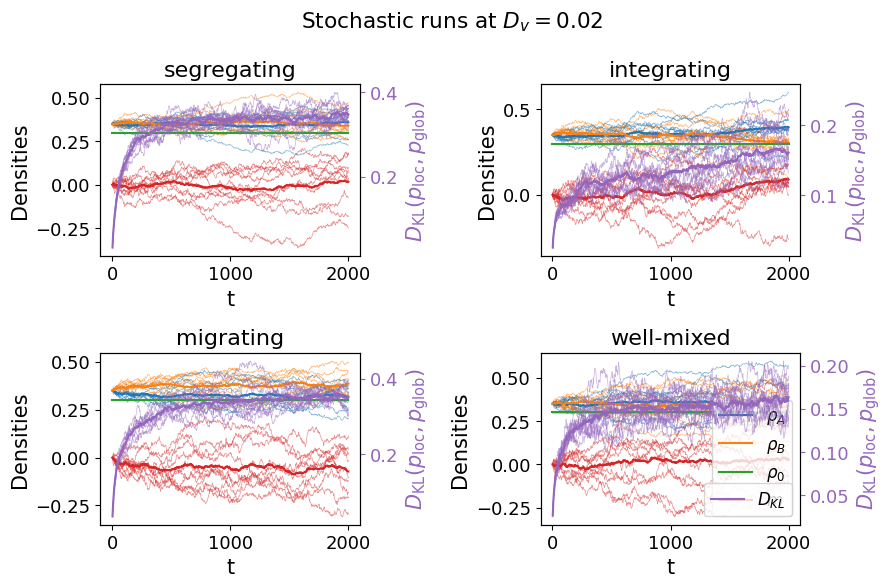

In [49]:
# Plot all runs dissimilarity and mass loss/difference in one plot:
D_v = 0.02


fig, axs = plt.subplots(2,2, figsize = (9,6))

for i_r, reg in enumerate(regimes):
    ax1 = axs.flatten()[i_r]
    ax2 = ax1.twinx()   
    phi_runs = []
    # Rel_ents = []

    for run in range(10):
        data = df[(df["regime"] == reg) & (df["D_v"] == D_v) & (df["n_run"] == run)]
        t = dt*nsteps*data["snapshot"]/frames
        ax1.plot(t,data["rhoA"], color= 'C0', alpha = 0.5, lw=0.5)
        ax1.plot(t,data["rhoB"], color = 'C1', alpha = 0.5, lw=0.5)
        ax1.plot(t,data["rho0"], color = 'C2', alpha = 0.5, lw=0.5)
        ax1.plot(t,data["rhoA"]-data["rhoB"], color = 'C3', alpha = 0.5, lw=0.5)

        Rel_ent = data["DKL"]
        ax2.plot(t[1:], Rel_ent[1:], color = 'C4', alpha = 0.5, lw=0.5)
        
    data_pp = df_mpp[(df_mpp["regime"]== reg) & (df_mpp["D_v"] == D_v)]
    rhoA_mean = data_pp["rhoA_mean"]
    rhoB_mean = data_pp["rhoB_mean"]
    DKL_mean = data_pp['DKL_mean']

    ax1.plot(t,rhoA_mean, color= 'C0', label = r"$\rho_A$")
    ax1.plot(t,rhoB_mean, color = 'C1', label = r"$\rho_B$")
    ax1.plot(t,1-rhoA_mean-rhoB_mean, color = 'C2', label = r"$\rho_0$")
    ax1.plot(t,rhoA_mean-rhoB_mean, color = 'C3', label = r"$m$")

    # Ds = np.array([Rel_ent[:ep] for Rel_ent in Rel_ents]).mean(axis=0)
    ax2.plot(t[1:],DKL_mean[1:], color= 'C4', label = r"$D_{KL}$")

    ax1.set_title(f"{reg}")
    ax1.set_xlabel("t")
    ax1.set_ylabel("Densities")
    ax2.set_ylabel(r"$D_{\rm KL}(p_{\rm loc}, p_{\rm glob})$", color= 'C4')
    ax2.tick_params(axis='y', colors='C4')
    # labels = [r"$\rho_A$", r"$\rho_B$", r"$\rho_0$", r"$|m|$"]

ax1.legend(loc='lower right')
ax2.legend()
plt.suptitle(rf"Stochastic runs at $D_v = {D_v:.2f}$")
plt.tight_layout()
plt.show()

In [42]:
df.head()

,regime,D_v,n_run,snapshot,rhoA,rhoB,rho0,rho_occ,DKL
0,segregating,0.01,0,0,0.349856,0.350061,0.300083,0.699917,0.014320
1,segregating,0.01,0,1,0.350312,0.349605,0.300083,0.699917,0.015639
2,segregating,0.01,0,2,0.348664,0.351253,0.300083,0.699917,0.023464
3,segregating,0.01,0,3,0.347683,0.352234,0.300083,0.699917,0.029547
4,segregating,0.01,0,4,0.347493,0.352424,0.300083,0.699917,0.034827


In [52]:
Dkl_runs = np.zeros((len(Dv_space),4))
for i, reg in enumerate(regimes):
    data = df[(df["regime"] == reg) & (df['rhoA']>0) & (df['rhoB']>0) & (df["snapshot"]>200) &(df['snapshot']<601)]
    for j, dv in enumerate(Dv_space):
        Dk_v = data[ (dv - 1e-10 < data['D_v']) & (data['D_v'] < dv + 1e-10)]
        Dkl_runs[j,i] = np.mean(Dk_v["DKL"])

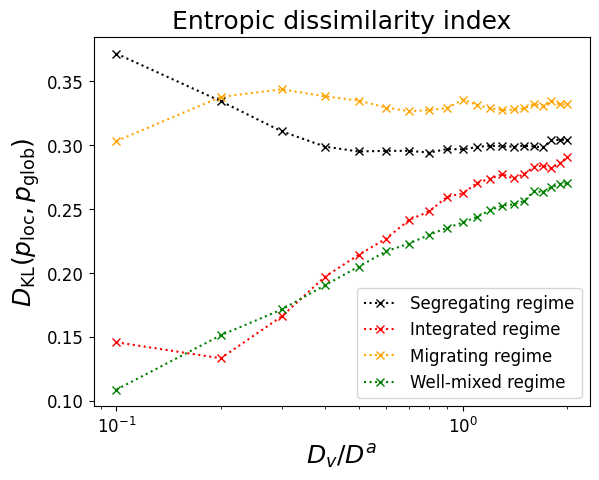

In [53]:
Dkl_indices = []
for reg in regimes:
    data = df_obs_bp[(df_obs_bp["regime"]==reg) & (df_obs_bp["k_bin"] == 0)]
    Dkl_indices.append(data["DKL_mean_runs"])

Dkl_indices = np.array(Dkl_indices).transpose()

plt.semilogx(Dv_space/D[0], Dkl_runs[:,0], "x:k", label = "Segregating regime")
plt.semilogx(Dv_space/D[0], Dkl_runs[:,1], "x:r", label = "Integrated regime")
plt.semilogx(Dv_space/D[0], Dkl_runs[:,2], "x:", color= 'orange', label = "Migrating regime")
plt.semilogx(Dv_space/D[0], Dkl_runs[:,3], "x:g", label = "Well-mixed regime")
# plt.semilogx(D[0]/Dv_space, Dkl_indices_mig[:], "x:", color='orange', label = "Migrating regime")
plt.xlabel(r"$D_v/D^a$", size=18)
plt.ylabel(r"$D_{\rm KL}(p_{\rm loc}, p_{\rm glob})$", size=18)
plt.title(r"Entropic dissimilarity index", size=18)
plt.xticks(size=12)
plt.yticks(size=12)
plt.legend(fontsize=12)
plt.show()

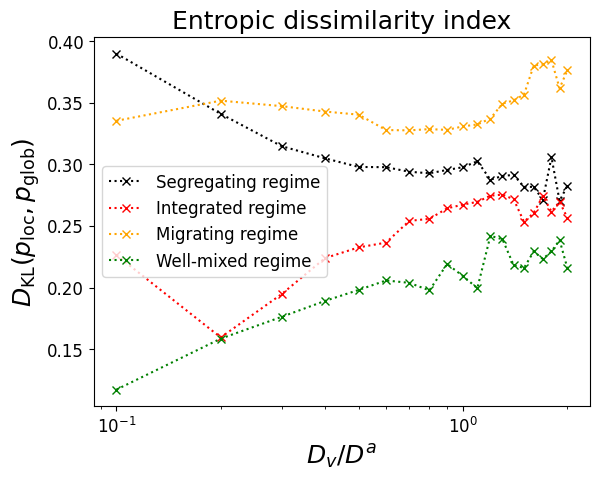

In [12]:
Dkl_indices = []
for reg in regimes:
    data = df_obs_bp[(df_obs_bp["regime"]==reg) & (df_obs_bp["k_bin"] == 0)]
    Dkl_indices.append(data["DKL_mean_runs"])

Dkl_indices = np.array(Dkl_indices).transpose()

plt.semilogx(Dv_space/D[0], Dkl_indices[:,0], "x:k", label = "Segregating regime")
plt.semilogx(Dv_space/D[0], Dkl_indices[:,1], "x:r", label = "Integrated regime")
plt.semilogx(Dv_space/D[0], Dkl_indices[:,2], "x:", color= 'orange', label = "Migrating regime")
plt.semilogx(Dv_space/D[0], Dkl_indices[:,3], "x:g", label = "Well-mixed regime")
# plt.semilogx(D[0]/Dv_space, Dkl_indices_mig[:], "x:", color='orange', label = "Migrating regime")
plt.xlabel(r"$D_v/D^a$", size=18)
plt.ylabel(r"$D_{\rm KL}(p_{\rm loc}, p_{\rm glob})$", size=18)
plt.title(r"Entropic dissimilarity index", size=18)
plt.xticks(size=12)
plt.yticks(size=12)
plt.legend(fontsize=12)
plt.show()

In [17]:
D_v = 0.01
k_bins = df_obs_bp[(df_obs_bp['regime']=='segregating') & (df_obs_bp['D_v'] == D_v)]['k'].values
num_bins = len(k_bins)+1

PS_matrix = np.zeros((len(Dv_space), len(regimes), 3, num_bins-1))
GAB_matrix = np.zeros((len(Dv_space), len(regimes), num_bins-1))

for i, dv in enumerate(Dv_space):
    for r, reg in enumerate(regimes):
        data = df_obs_bp[(df_obs_bp['regime']==reg) & (dv - 1e-10 < df_obs_bp['D_v']) & (df_obs_bp['D_v'] < dv + 1e-10)]
        GAB_matrix[i, r] = data['G_AB_mean']
        PS_matrix[i,r,0] = data["PS_A_mean"]
        PS_matrix[i,r,1] = data["PS_B_mean"]
        PS_matrix[i,r,2] = data["PS_0_mean"]

# df_masses = pd.read_csv("processed_FV_old/masses_by_parameter.csv")

/tmp/ipykernel_4091126/1671681272.py:70: RuntimeWarning: All-NaN slice encountered
  envelope = np.nanmax(


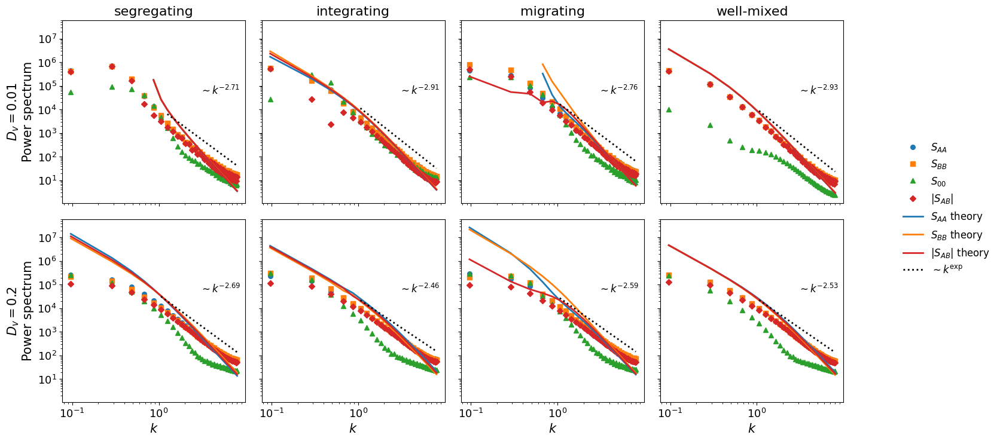

In [55]:
from structure_factor import *

regimes = ["segregating", "integrating", "migrating", "well-mixed"]
kappas = [np.array([[0.6, -0.4],[-0.4, 0.6]]), 
          np.array([[0.6, 1], [1, 0.6]]),
          np.array([[1, 1], [-1, 1]]), 
          np.array([[0., 0.], [0., 0.]])
          ]

Dv_indices = [0, 19]
dx = 50/128

# Large-k cutoff
k_max_cutoff = np.pi / dx 

# Number of theory points to omit from display
theory_skip = 0
averaging_bp = -200

# ---------- styling for paper ----------
title_fs  = 16
label_fs  = 15
tick_fs   = 13
legend_fs = 12
text_fs   = 12

lw_th     = 2.0
lw_ref    = 2.0
ms        = 5.5

plt.rcParams.update({
    "font.size": tick_fs,
    "axes.labelsize": label_fs,
    "axes.titlesize": title_fs,
    "xtick.labelsize": tick_fs,
    "ytick.labelsize": tick_fs,
    "legend.fontsize": legend_fs,
})

# ---------- helper functions ----------
def fit_amplitude_logspace(theory, data):
    """
    Fit a multiplicative amplitude amp in log-space:
        log(data) ~ log(amp) + log(theory)
    """
    valid = (
        np.isfinite(theory) & np.isfinite(data) &
        (theory > 0) & (data > 0)
    )

    if not np.any(valid):
        return 1.0

    log_amp = np.mean(np.log(data[valid]) - np.log(theory[valid]))
    return np.exp(log_amp)


def get_k_mask(k_bins, k_max_cutoff=None):
    mask = (k_bins > 0)
    if k_max_cutoff is not None:
        mask &= (k_bins <= k_max_cutoff)
    return mask


def get_dynamic_fit_mask(k_bins, k_mask, power_spectra, G_AB, n_after_peak=2):
    """
    Start the fit 2 points after the maximum of the data envelope
    from S_AA, S_BB, and |S_AB|.
    """
    envelope = np.nanmax(
        np.vstack([
            np.where(k_mask, power_spectra[0], np.nan),
            np.where(k_mask, power_spectra[1], np.nan),
            np.where(k_mask, np.abs(G_AB), np.nan)
        ]),
        axis=0
    )

    if np.all(np.isnan(envelope)):
        idx_start = 1
    else:
        idx_start = np.nanargmax(envelope) + n_after_peak

    idx = np.arange(len(k_bins))
    fit_mask = k_mask & (idx >= idx_start)

    if np.sum(fit_mask) < 3:
        fit_mask = k_mask & (idx >= max(1, idx_start - n_after_peak))

    return fit_mask


def fit_power_law_tail(k, y, n_after_peak=2, min_points=4):
    """
    Fit a power law y ~ A * k^exp to the high-k tail of y.

    The fit starts 2 points after the maximum of y and uses the rest
    of the available k-range. The fit is done in log-log space:
        log(y) = log(A) + exp * log(k)

    Returns
    -------
    exp_fit : float
        Fitted exponent.
    A_fit : float
        Fitted prefactor.
    tail_mask : boolean array
        Mask of the points used in the fit, in the coordinates of k and y.
    """
    valid = np.isfinite(k) & np.isfinite(y) & (k > 0) & (y > 0)

    k_valid = k[valid]
    y_valid = y[valid]

    if len(k_valid) < min_points:
        return np.nan, np.nan, np.zeros_like(k, dtype=bool)

    peak_idx = np.argmax(y_valid)
    start_idx = peak_idx + n_after_peak

    if start_idx >= len(k_valid) - min_points:
        start_idx = max(0, len(k_valid) - min_points)

    k_tail = k_valid[start_idx:]
    y_tail = y_valid[start_idx:]

    if len(k_tail) < 2:
        return np.nan, np.nan, np.zeros_like(k, dtype=bool)

    coeffs = np.polyfit(np.log(k_tail), np.log(y_tail), 1)
    exp_fit = coeffs[0]
    logA_fit = coeffs[1]
    A_fit = np.exp(logA_fit)

    tail_mask = np.zeros_like(k, dtype=bool)
    valid_indices = np.where(valid)[0]
    tail_indices = valid_indices[start_idx:]
    tail_mask[tail_indices] = True

    return exp_fit, A_fit, tail_mask


def add_fitted_powerlaw_reference(ax, k, y, exp_fit, tail_mask, 
                                  vertical_shift=2.5, label=None):
    """
    Add a reference line y_ref ~ k^exp_fit over the tail region.
    The line is shifted upward by 'vertical_shift' to avoid overlap.
    """
    if np.isnan(exp_fit):
        return

    if np.sum(tail_mask) < 2:
        return

    k_tail = k[tail_mask]
    y_tail = y[tail_mask]

    valid = np.isfinite(k_tail) & np.isfinite(y_tail) & (k_tail > 0) & (y_tail > 0)
    k_tail = k_tail[valid]
    y_tail = y_tail[valid]

    if len(k_tail) < 2:
        return

    # Anchor the guide line near the first point of the fitted tail,
    # but place it somewhat above the data/theory.
    k0 = k_tail[0]
    y0 = vertical_shift * y_tail[0]

    y_ref = y0 * (k_tail / k0) ** exp_fit

    ax.plot(k_tail, y_ref, "k:", lw=lw_ref, label=label)


# ---------- figure ----------
fig, axes = plt.subplots(
    nrows=2,
    ncols=4,
    figsize=(16, 8),
    sharex=True,
    sharey=True
)

for row_idx, Dv_idx in enumerate(Dv_indices):

    Dv = Dv_space[Dv_idx]

    for regime_idx, regime in enumerate(regimes):

        ax = axes[row_idx, regime_idx]

        param_panel = {'h': 0.01, 'D': 0.1*np.ones(2), 'Gamma': np.eye(2), 'beta': 10}
        param_panel["kappa"] = kappas[regime_idx]
        param_panel["D_v"] = Dv

        power_spectra = PS_matrix[Dv_idx, regime_idx]
        G_AB = GAB_matrix[Dv_idx, regime_idx]

        # compute theory
        S_AA_theory = np.zeros(len(k_bins), dtype=complex)
        S_AB_theory = np.zeros(len(k_bins), dtype=complex)
        S_BB_theory = np.zeros(len(k_bins), dtype=complex)

        data_pp = df_mpp[(df_mpp["regime"]== regime) & (df_mpp["D_v"] == Dv)]
        rhoA_mean = data_pp["rhoA_mean"]
        rhoB_mean = data_pp["rhoB_mean"]

        phi_A_mean = rhoA_mean[averaging_bp:].mean()
        phi_B_mean = rhoB_mean[averaging_bp:].mean()

        for i, k in enumerate(k_bins):
            structure_factors = structure_factor(
                k,
                phi_A_mean,
                phi_B_mean,
                param_panel
            )
            S_AA_theory[i] = structure_factors[0, 0]
            S_AB_theory[i] = structure_factors[0, 1]
            S_BB_theory[i] = structure_factors[1, 1]

        # masks
        k_mask = get_k_mask(k_bins, k_max_cutoff=k_max_cutoff)
        fit_mask = get_dynamic_fit_mask(
            k_bins, k_mask, power_spectra, G_AB, n_after_peak=2
        )

        # optionally also remove the first displayed theory points from the fit
        theory_indices_all = np.where(k_mask)[0]
        if len(theory_indices_all) > theory_skip:
            fit_mask[theory_indices_all[:theory_skip]] = False

        # log-space amplitude fit
        theory_fit = np.vstack([
            S_AA_theory[fit_mask].real,
            S_BB_theory[fit_mask].real,
            np.abs(S_AB_theory[fit_mask])
        ])

        data_fit = np.vstack([
            power_spectra[0, fit_mask],
            power_spectra[1, fit_mask],
            np.abs(G_AB[fit_mask])
        ])

        amp = fit_amplitude_logspace(theory_fit, data_fit)

        # plotting mask
        plot_mask = k_mask
        k_plot = k_bins[plot_mask]

        # theory display mask: skip first few displayed theory points
        theory_indices = np.where(plot_mask)[0]
        theory_plot_indices = theory_indices[theory_skip:]

        # ---------- DATA: markers only ----------
        ax.plot(
            k_plot, power_spectra[0, plot_mask],
            linestyle="None", marker="o", color="tab:blue",
            ms=ms, label=r"$S_{AA}$"
        )
        ax.plot(
            k_plot, power_spectra[1, plot_mask],
            linestyle="None", marker="s", color="tab:orange",
            ms=ms, label=r"$S_{BB}$"
        )
        ax.plot(
            k_plot, power_spectra[2, plot_mask],
            linestyle="None", marker="^", color="tab:green",
            ms=ms, label=r"$S_{00}$"
        )
        ax.plot(
            k_plot, np.abs(G_AB[plot_mask]),
            linestyle="None", marker="D", color="tab:red",
            ms=ms, label=r"$|S_{AB}|$"
        )

        # ---------- THEORY ----------
        k_AA = k_bins[theory_plot_indices]
        S_AA_plot = S_AA_theory[theory_plot_indices].real
        ax.plot(
            k_AA[S_AA_plot>0],
            amp * S_AA_plot[S_AA_plot>0],
            "-", color="tab:blue", lw=lw_th, label=r"$S_{AA}$ theory"
        )

        k_BB = k_bins[theory_plot_indices]
        S_BB_plot = S_BB_theory[theory_plot_indices].real
        ax.plot(
            k_BB[S_BB_plot>0],
            amp * S_BB_plot[S_BB_plot>0],
            "-", color="tab:orange", lw=lw_th, label=r"$S_{BB}$ theory"
        )
        k_AB = k_bins[theory_plot_indices]
        S_AB_plot = S_AB_theory[theory_plot_indices].real        
        ax.plot(
            k_AB[S_AB_plot<0],
            - amp * S_AB_plot[S_AB_plot<0],
            "-", color="tab:red", lw=lw_th, label=r"$|S_{AB}|$ theory"
        )

        # ---------- fit S_AA tail exponent and add reference ----------
        SAA_plot = power_spectra[0, plot_mask]

        exp_fit, A_fit, tail_mask_local = fit_power_law_tail(
            k_plot, SAA_plot, n_after_peak=5, min_points=4
        )

        add_fitted_powerlaw_reference(
            ax,
            k_plot,
            SAA_plot,
            exp_fit,
            tail_mask_local,
            vertical_shift=2.5,
            label=r"$\sim k^{\mathrm{exp}}$" if (row_idx == 0 and regime_idx == 0) else None
        )

        # add text with fitted exponent
        if np.isfinite(exp_fit):
            exp_text = fr"$\sim k^{{{exp_fit:.2f}}}$"
        else:
            exp_text = r"$\sim k^{\mathrm{nan}}$"

        ax.text(
            0.75, 0.65,
            exp_text,
            transform=ax.transAxes,
            fontsize=text_fs,
            va="top",
            ha="left"
        )

        # axes formatting
        ax.set_xscale("log")
        ax.set_yscale("log")
        ax.set_box_aspect(1)

        if row_idx == 0:
            ax.set_title(regime)

        if regime_idx == 0:
            ax.set_ylabel(fr"$D_v = {param_panel['D_v']}$" + "\nPower spectrum")

        if row_idx == 1:
            ax.set_xlabel(r"$k$")

        ax.tick_params(axis='both', which='both', labelsize=tick_fs)

# global legend
handles, labels = axes[0, 0].get_legend_handles_labels()
fig.legend(
    handles, labels,
    loc="center right",
    bbox_to_anchor=(1.05, 0.5),
    frameon=False,
    fontsize=legend_fs
)

# fig.suptitle("Power spectra across regimes and $D_v$", fontsize=title_fs + 2) 

plt.tight_layout(rect=[0, 0, 0.9, 0.95])
# plt.savefig("images/Schelling_Voter_PS_FV.pdf")
plt.show()

# Old and other plot and analysis codes:

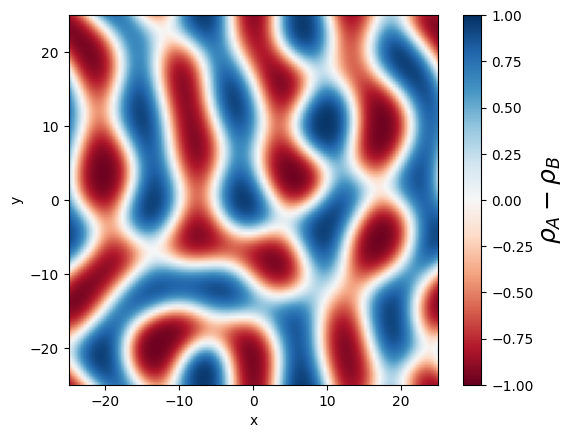

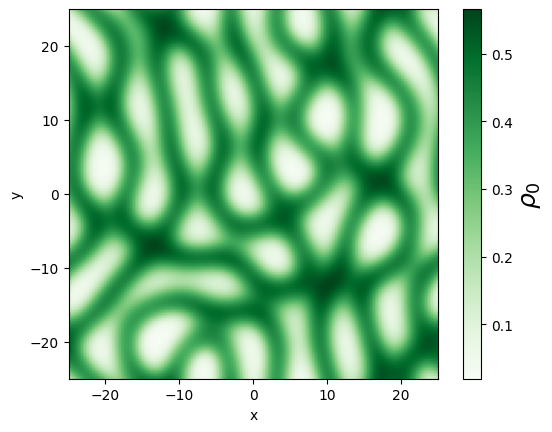

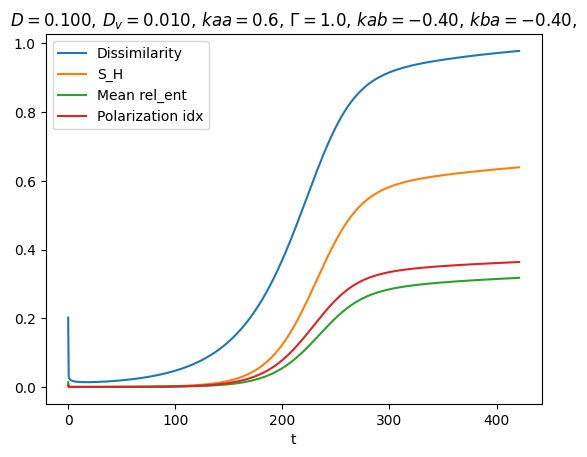

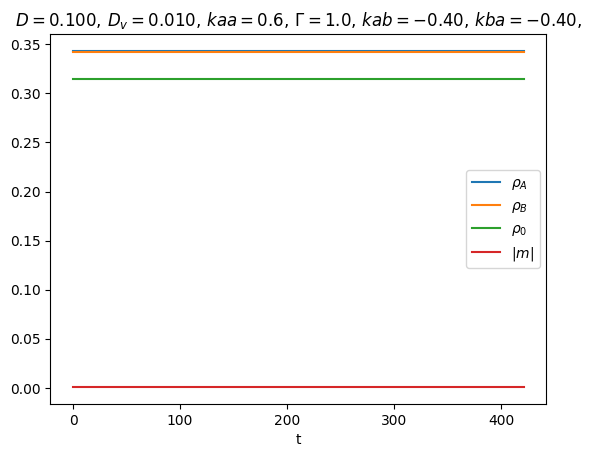

In [3]:
#Load a single run

regime = "segregating"
run = 3
Dv = 0.01
phi_run = np.load(f"data/{regime}/run_{run}_det_Dv{Dv:.2f}.npy")

dt = 1e-3
frames = phi_run.shape[1]-1
nsteps = 500*frames
theta = 2/5
Lx, Ly = 50, 50

kappa_aa = kappas[0][0,0]
kappa_ab = kappas[0][0,1]
kappa_ba = kappas[0][1,0]
kappa_bb = kappas[0][1,1]

title = fr"$D = {D[0]:.3f},\, D_v = {Dv:.3f},\, kaa = {kappa_aa:.1f},\, \Gamma = { Gamma[0,0]},\, kab = {kappa_ab:.2f}, \, kba = {kappa_ba:.2f}, $"
phi_diff = phi_run[ 0] - phi_run[1]
# t = np.linspace(0,dt*nsteps, plot_every+1)
im =plt.imshow(phi_diff[-1], cmap = 'RdBu', aspect='equal', origin='lower', extent=[-Lx/2,Lx/2,-Ly/2,Ly/2], vmin=-1, vmax=1)
# plt.title(title)
plt.xlabel("x")
plt.ylabel("y")
cbar = plt.colorbar(im, fraction=0.046)
cbar.set_label(r"$\rho_A - \rho_B$",size=18)
# plt.savefig("fhd_plots/integrating_tanh_noisy_reactions.pdf")
plt.show()

phi0 = 1 -  phi_run[ 0] - phi_run[1]
# t = np.linspace(0,dt*nsteps, plot_every+1)
im =plt.imshow(phi0[-1], cmap = 'Greens', aspect='equal', origin='lower', extent=[-Lx/2,Lx/2,-Ly/2,Ly/2])
# plt.title(title)
plt.xlabel("x")
plt.ylabel("y")
cbar = plt.colorbar(im, fraction=0.046)
cbar.set_label(r"$\rho_0$",size=18)
# plt.savefig("fhd_plots/integrating_tanh_noisy_reactions.pdf")
plt.show()

def polarization_index(phi):
    mu = phi[0]-phi[1]
    # rho0 = 1- phi.sum(axis=0)
    return np.var(mu)

Rel_ent = np.array([fhd.mean_relative_entropy(phi_run[:,t]) for t in range(frames+1)])
Dis_idx = np.array([fhd.dissimilarity(phi_run[:,t]) for t in range(frames+1)])
Q_unhappy = np.array([fhd.fraction_unhappy(theta, phi_run[:,t]) for t in range(frames+1)])
pol_idx = np.array([polarization_index(phi_run[:,t]) for t in range(frames+1)])
S_H = np.array([fhd.entropy_index(phi_run[:,t]) for t in range(frames + 1)])

t = np.linspace(0, dt*nsteps, frames+1)
plt.plot(t,Dis_idx, label = "Dissimilarity")
plt.plot(t,S_H, label = "S_H")
plt.plot(t,Rel_ent,  label = "Mean rel_ent")
plt.plot(t,pol_idx, label = "Polarization idx")
plt.title(title)
# plt.yscale('log')
# plt.xscale("log")
plt.xlabel("t")
plt.legend()
plt.show()

phi0_tot = np.mean(1-  phi_run.sum(axis=0), axis = (1,2))
rhoA = phi_run[0].mean(axis=(1,2))
rhoB = phi_run[1].mean(axis=(1,2))
t = np.linspace(0, dt*nsteps, frames+1)

plt.plot(t,rhoA, label = r"$\rho_A$")
plt.plot(t,rhoB, label = r"$\rho_B$")
plt.plot(t,phi0_tot, label = r"$\rho_0$")
plt.plot(t,rhoA - rhoB, label = r"$|m|$")
plt.title(title)
plt.xlabel("t")
plt.legend()
plt.show()

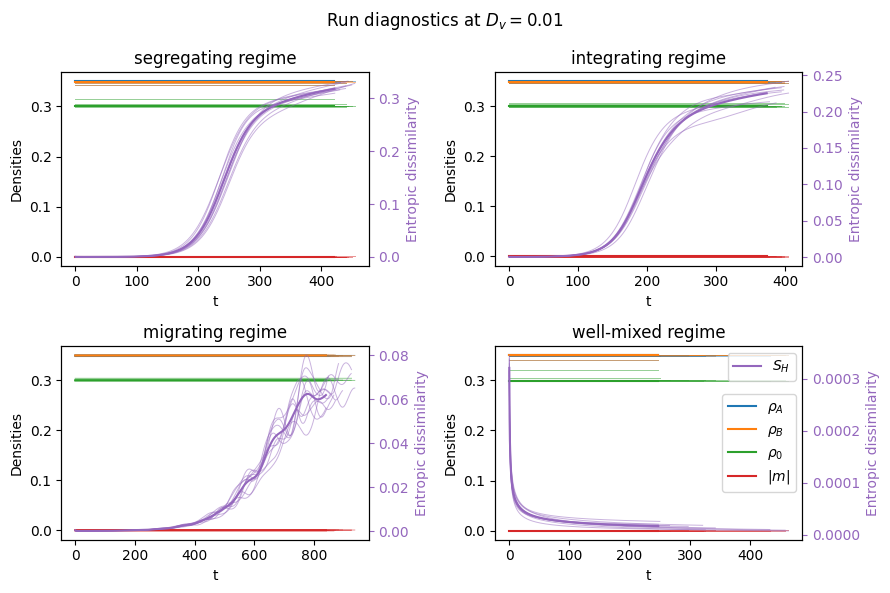

In [4]:
# Plot all runs dissimilarity and mass loss/difference in one plot:

Dv = 0.01

fig, axs = plt.subplots(2,2, figsize = (9,6))

for i_r, reg in enumerate(regimes):
    ax1 = axs.flatten()[i_r]
    ax2 = ax1.twinx()   
    title = fr"{reg} regime"
    phi_runs = []
    Rel_ents = []

    for run in range(10):
        phi_run = np.load(f"data/{reg}/run_{run}_det_Dv{Dv:.2f}.npy")
        phi_runs.append(phi_run)
        frames = phi_run.shape[1]
        t = np.linspace(0, dt*frames*500, frames)

        rhoA = phi_run[0].mean(axis=(1,2))
        rhoB = phi_run[1].mean(axis=(1,2))

        ax1.plot(t,rhoA, color= 'C0', alpha = 0.5, lw=0.7)
        ax1.plot(t,rhoB, color = 'C1', alpha = 0.5, lw=0.7)
        ax1.plot(t,1-rhoA-rhoB, color = 'C2', alpha = 0.5, lw=0.7)
        ax1.plot(t,rhoA - rhoB, color = 'C3', alpha = 0.5, lw=0.7)

        Rel_ent = np.array([fhd.mean_relative_entropy(phi_run[:,t]) for t in range(frames)])
        Rel_ents.append(Rel_ent)
        ax2.plot(t[1:], Rel_ent[1:], color = 'C4', alpha = 0.5, lw=0.7)
        

    ep = min([rho.shape[1] for rho in phi_runs])

    rhos = np.array([phi_run[:,:ep,:,:].mean(axis=(2,3)) for phi_run in phi_runs])
    rhoA = rhos[0].mean(axis=0)
    rhoB = rhos[1].mean(axis=0)

    ax1.plot(t[:ep],rhoA, color= 'C0', label = r"$\rho_A$")
    ax1.plot(t[:ep],rhoB, color = 'C1', label = r"$\rho_B$")
    ax1.plot(t[:ep],1-rhoA-rhoB, color = 'C2', label = r"$\rho_0$")
    ax1.plot(t[:ep],rhoA - rhoB, color = 'C3', label = r"$|m|$")

    Ds = np.array([Rel_ent[:ep] for Rel_ent in Rel_ents]).mean(axis=0)
    ax2.plot(t[1:ep],Ds[1:], color= 'C4', label = r"$S_H$")

    ax1.set_title(title)
    ax1.set_xlabel("t")
    ax1.set_ylabel("Densities")
    ax2.set_ylabel("Entropic dissimilarity", color= 'C4')
    ax2.tick_params(axis='y', colors='C4')
    # labels = [r"$\rho_A$", r"$\rho_B$", r"$\rho_0$", r"$|m|$"]
ax1.legend()
ax2.legend()
plt.suptitle(rf"Deterministic runs at $D_v = {Dv:.2f}$")
plt.tight_layout()
plt.show()

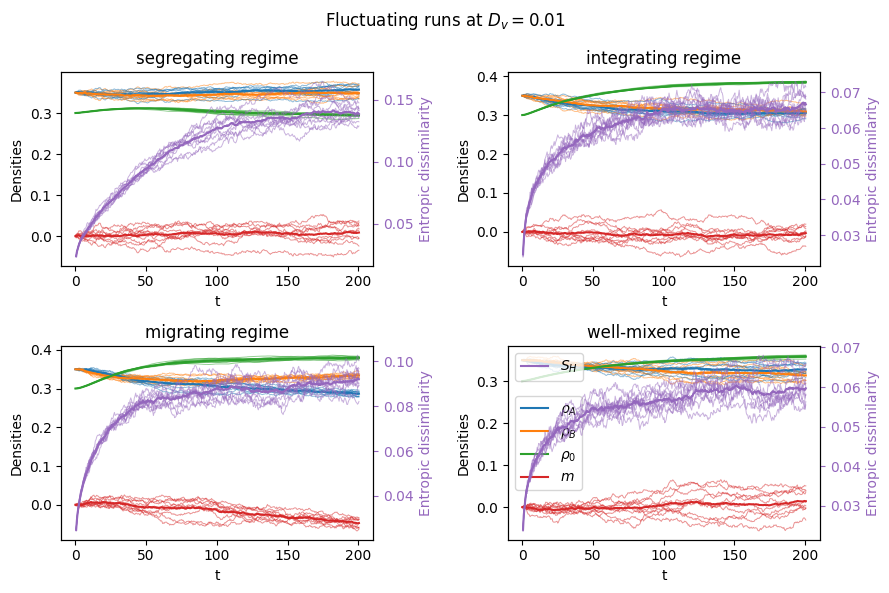

In [4]:
# Plot all runs dissimilarity and mass loss/difference in one plot:

Dv = 0.01

fig, axs = plt.subplots(2,2, figsize = (9,6))

for i_r, reg in enumerate(regimes):
    ax1 = axs.flatten()[i_r]
    ax2 = ax1.twinx()   
    title = fr"{reg} regime"
    phi_runs = []
    Rel_ents = []

    for run in range(10):
        phi_run = np.load(f"data/{reg}/FV_run_{run}_fluc_Dv{Dv:.2f}.npy")
        phi_runs.append(phi_run)
        frames = phi_run.shape[1]
        t = np.linspace(0, dt*frames*500, frames)

        rhoA = phi_run[0].mean(axis=(1,2))
        rhoB = phi_run[1].mean(axis=(1,2))

        ax1.plot(t,rhoA, color= 'C0', alpha = 0.5, lw=0.7)
        ax1.plot(t,rhoB, color = 'C1', alpha = 0.5, lw=0.7)
        ax1.plot(t,1-rhoA-rhoB, color = 'C2', alpha = 0.5, lw=0.7)
        ax1.plot(t,rhoA - rhoB, color = 'C3', alpha = 0.5, lw=0.7)

        Rel_ent = np.array([fhd.mean_relative_entropy(phi_run[:,t]) for t in range(frames)])
        Rel_ents.append(Rel_ent)
        ax2.plot(t[1:], Rel_ent[1:], color = 'C4', alpha = 0.5, lw=0.7)
        

    ep = min([rho.shape[1] for rho in phi_runs])

    rhos = np.array([phi[:,:ep,:,:].mean(axis=(2,3)) for phi in phi_runs])
    rhoA = rhos[:,0].mean(axis=0)
    rhoB = rhos[:,1].mean(axis=0)

    ax1.plot(t[:ep],rhoA, color= 'C0', label = r"$\rho_A$")
    ax1.plot(t[:ep],rhoB, color = 'C1', label = r"$\rho_B$")
    ax1.plot(t[:ep],1-rhoA-rhoB, color = 'C2', label = r"$\rho_0$")
    ax1.plot(t[:ep],rhoA-rhoB, color = 'C3', label = r"$m$")

    Ds = np.array([Rel_ent[:ep] for Rel_ent in Rel_ents]).mean(axis=0)
    ax2.plot(t[1:ep],Ds[1:], color= 'C4', label = r"$S_H$")

    ax1.set_title(title)
    ax1.set_xlabel("t")
    ax1.set_ylabel("Densities")
    ax2.set_ylabel("Entropic dissimilarity", color= 'C4')
    ax2.tick_params(axis='y', colors='C4')
    # labels = [r"$\rho_A$", r"$\rho_B$", r"$\rho_0$", r"$|m|$"]
ax1.legend()
ax2.legend()
plt.suptitle(rf"Fluctuating runs at $D_v = {Dv:.2f}$")
plt.tight_layout()
plt.show()

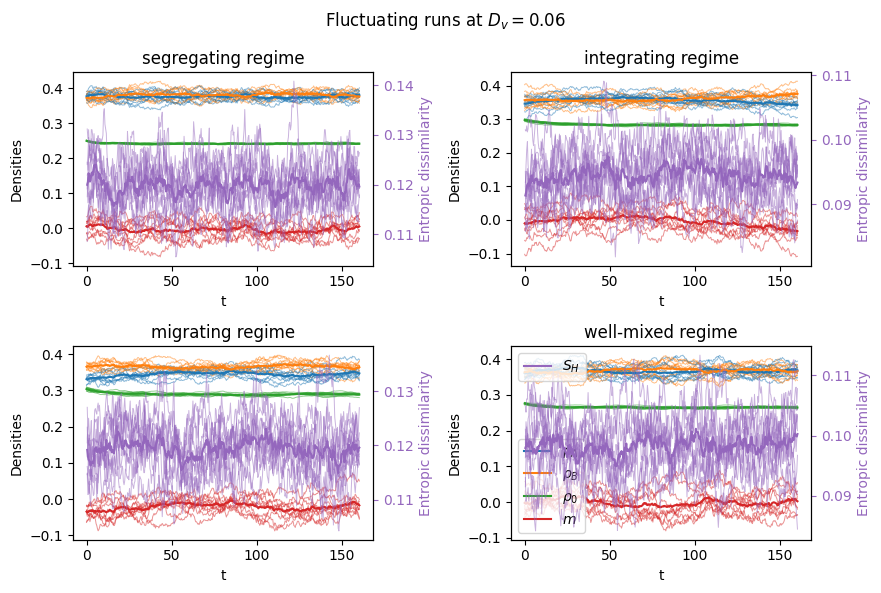

In [44]:
# Plot all runs dissimilarity and mass loss/difference in one plot:
D_v = 0.06
df = pd.read_csv("processed_FV_old/masses_per_run.csv")
df_mpp = pd.read_csv("processed_FV_old/masses_by_parameter.csv")

fig, axs = plt.subplots(2,2, figsize = (9,6))
dt =1e-3
frames = 401

for i_r, reg in enumerate(regimes):
    ax1 = axs.flatten()[i_r]
    ax2 = ax1.twinx()   
    title = fr"{reg} regime"
    phi_runs = []
    # Rel_ents = []

    for run in range(10):
        data = df[(df["regime"] == reg) & (df["D_v"] == D_v) & (df["n_run"] == run)]
        t = dt*frames*data["snapshot"]
        ax1.plot(t,data["rhoA"], color= 'C0', alpha = 0.5, lw=0.7)
        ax1.plot(t,data["rhoB"], color = 'C1', alpha = 0.5, lw=0.7)
        ax1.plot(t,data["rho0"], color = 'C2', alpha = 0.5, lw=0.7)
        ax1.plot(t,data["rhoA"]-data["rhoB"], color = 'C3', alpha = 0.5, lw=0.7)

        Rel_ent = data["DKL"]
        ax2.plot(t[1:], Rel_ent[1:], color = 'C4', alpha = 0.5, lw=0.7)
        
    data_pp = df_mpp[(df_mpp["regime"]== reg) & (df_mpp["D_v"] == D_v)]
    rhoA_mean = data_pp["rhoA_mean"]
    rhoB_mean = data_pp["rhoB_mean"]
    DKL_mean = data_pp['DKL_mean']

    ax1.plot(t,rhoA_mean, color= 'C0', label = r"$\rho_A$")
    ax1.plot(t,rhoB_mean, color = 'C1', label = r"$\rho_B$")
    ax1.plot(t,1-rhoA_mean-rhoB_mean, color = 'C2', label = r"$\rho_0$")
    ax1.plot(t,rhoA_mean-rhoB_mean, color = 'C3', label = r"$m$")

    # Ds = np.array([Rel_ent[:ep] for Rel_ent in Rel_ents]).mean(axis=0)
    ax2.plot(t[1:],DKL_mean[1:], color= 'C4', label = r"$S_H$")

    ax1.set_title(title)
    ax1.set_xlabel("t")
    ax1.set_ylabel("Densities")
    ax2.set_ylabel("Entropic dissimilarity", color= 'C4')
    ax2.tick_params(axis='y', colors='C4')
    # labels = [r"$\rho_A$", r"$\rho_B$", r"$\rho_0$", r"$|m|$"]
ax1.legend()
ax2.legend()
plt.suptitle(rf"Fluctuating runs at $D_v = {D_v:.2f}$")
plt.tight_layout()
plt.show()

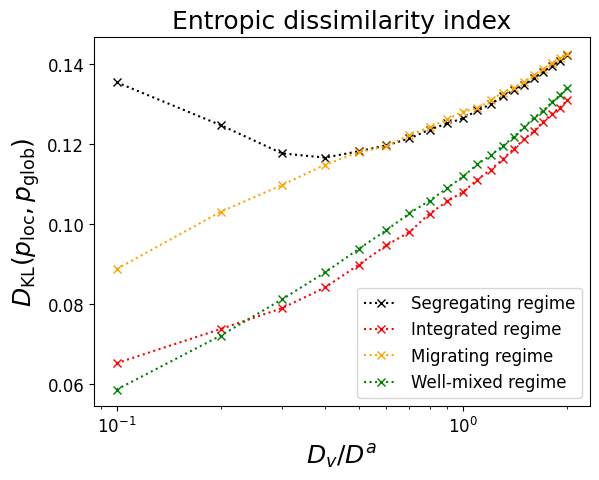

In [19]:
df_obs = pd.read_csv("processed_FV_old/observables_spectra_by_parameter.csv")

Dkl_indices = []
for reg in regimes:
    data = df_obs[(df_obs["regime"]==reg) & (df_obs["k_bin"] == 0)]
    Dkl_indices.append(data["DKL_mean_runs"])

Dkl_indices = np.array(Dkl_indices).transpose()

plt.semilogx(Dv_space/D[0], Dkl_indices[:,0], "x:k", label = "Segregating regime")
plt.semilogx(Dv_space/D[0], Dkl_indices[:,1], "x:r", label = "Integrated regime")
plt.semilogx(Dv_space/D[0], Dkl_indices[:,2], "x:", color= 'orange', label = "Migrating regime")
plt.semilogx(Dv_space/D[0], Dkl_indices[:,3], "x:g", label = "Well-mixed regime")
# plt.semilogx(D[0]/Dv_space, Dkl_indices_mig[:], "x:", color='orange', label = "Migrating regime")
plt.xlabel(r"$D_v/D^a$", size=18)
plt.ylabel(r"$D_{\rm KL}(p_{\rm loc}, p_{\rm glob})$", size=18)
plt.title(r"Entropic dissimilarity index", size=18)
plt.xticks(size=12)
plt.yticks(size=12)
plt.legend(fontsize=12)
plt.show()

In [20]:
df_obs.head()

,regime,D_v,n_runs,n_steady_snapshots,H_mean_runs,H_std_runs,D_mean_runs,D_std_runs,DKL_mean_runs,DKL_std_runs,...,k_bin,k,PS_A_mean,PS_A_std,PS_B_mean,PS_B_std,PS_0_mean,PS_0_std,G_AB_mean,G_AB_std
0,segregating,0.01,10,200,0.246746,0.014117,0.643946,0.017469,0.135483,0.007184,...,0,0.096388,27239.396869,8147.164635,26387.124807,7372.444277,2061.544404,547.208015,-25782.488636,7504.513847
1,segregating,0.01,10,200,0.246746,0.014117,0.643946,0.017469,0.135483,0.007184,...,1,0.289164,55562.902577,15652.478754,56076.346325,17043.887279,3508.756985,785.792524,-54065.245958,16122.991190
2,segregating,0.01,10,200,0.246746,0.014117,0.643946,0.017469,0.135483,0.007184,...,2,0.481940,109070.973507,17837.527802,107271.297484,18678.986801,4447.989862,410.889679,-105947.140565,18077.836809
3,segregating,0.01,10,200,0.246746,0.014117,0.643946,0.017469,0.135483,0.007184,...,3,0.674716,58336.833806,7297.358053,59045.849270,7546.677217,4076.182718,402.372064,-56653.250179,7391.971780
4,segregating,0.01,10,200,0.246746,0.014117,0.643946,0.017469,0.135483,0.007184,...,4,0.867492,13191.793719,1492.381958,13073.370140,1712.979732,3967.916031,275.139897,-11148.623914,1592.284791


In [51]:
D_v = 0.01
k_bins = df_obs[(df_obs['regime']=='segregating') & (df_obs['D_v'] == D_v)]['k'].values
num_bins = len(k_bins)+1

PS_matrix = np.zeros((len(Dv_space), len(regimes), 3, num_bins-1))
GAB_matrix = np.zeros((len(Dv_space), len(regimes), num_bins-1))

for i, dv in enumerate(Dv_space):
    for r, reg in enumerate(regimes):
        data = df_obs[(df_obs['regime']==reg) & (dv - 1e-10 < df_obs['D_v']) & (df_obs['D_v'] < dv + 1e-10)]
        GAB_matrix[i, r] = data['G_AB_mean']
        PS_matrix[i,r,0] = data["PS_A_mean"]
        PS_matrix[i,r,1] = data["PS_B_mean"]
        PS_matrix[i,r,2] = data["PS_0_mean"]

df_masses = pd.read_csv("processed_FV_old/masses_by_parameter.csv")

/tmp/ipykernel_2800755/4135481369.py:71: RuntimeWarning: All-NaN slice encountered
  envelope = np.nanmax(


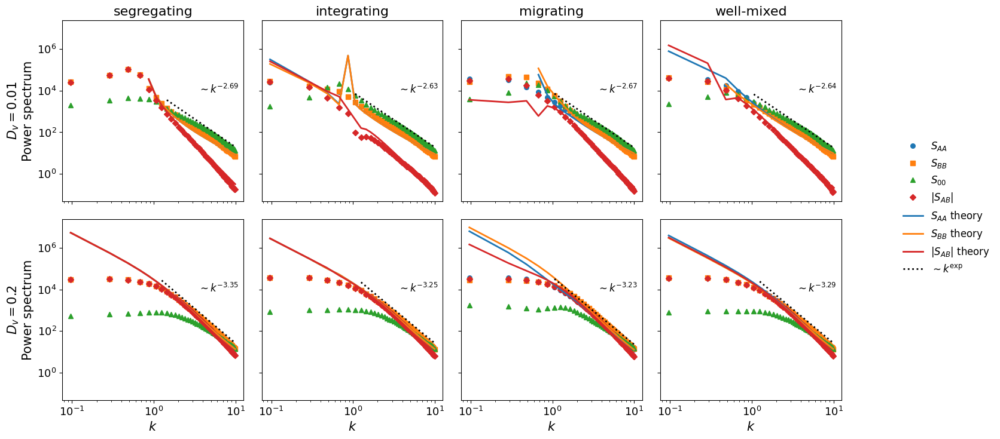

In [56]:
from structure_factor import *

regimes = ["segregating", "integrating", "migrating", "well-mixed"]

kappas = [
    np.array([[0.6, -0.4], [-0.4, 0.6]]),
    np.array([[0.6,  1.0], [ 1.0, 0.6]]),
    np.array([[1.0,  1.0], [-1.0, 1.0]]),
    np.array([[0.6,  0.4], [ 0.6, 0.4]])
]

Dv_indices = [0, 19]

# Large-k cutoff
k_max_cutoff = 10

# Number of theory points to omit from display
theory_skip = 0
averaging_bp = -200

# ---------- styling for paper ----------
title_fs  = 16
label_fs  = 15
tick_fs   = 13
legend_fs = 12
text_fs   = 12

lw_th     = 2.0
lw_ref    = 2.0
ms        = 5.5

plt.rcParams.update({
    "font.size": tick_fs,
    "axes.labelsize": label_fs,
    "axes.titlesize": title_fs,
    "xtick.labelsize": tick_fs,
    "ytick.labelsize": tick_fs,
    "legend.fontsize": legend_fs,
})

# ---------- helper functions ----------
def fit_amplitude_logspace(theory, data):
    """
    Fit a multiplicative amplitude amp in log-space:
        log(data) ~ log(amp) + log(theory)
    """
    valid = (
        np.isfinite(theory) & np.isfinite(data) &
        (theory > 0) & (data > 0)
    )

    if not np.any(valid):
        return 1.0

    log_amp = np.mean(np.log(data[valid]) - np.log(theory[valid]))
    return np.exp(log_amp)


def get_k_mask(k_bins, k_max_cutoff=None):
    mask = (k_bins > 0)
    if k_max_cutoff is not None:
        mask &= (k_bins <= k_max_cutoff)
    return mask


def get_dynamic_fit_mask(k_bins, k_mask, power_spectra, G_AB, n_after_peak=2):
    """
    Start the fit 2 points after the maximum of the data envelope
    from S_AA, S_BB, and |S_AB|.
    """
    envelope = np.nanmax(
        np.vstack([
            np.where(k_mask, power_spectra[0], np.nan),
            np.where(k_mask, power_spectra[1], np.nan),
            np.where(k_mask, np.abs(G_AB), np.nan)
        ]),
        axis=0
    )

    if np.all(np.isnan(envelope)):
        idx_start = 1
    else:
        idx_start = np.nanargmax(envelope) + n_after_peak

    idx = np.arange(len(k_bins))
    fit_mask = k_mask & (idx >= idx_start)

    if np.sum(fit_mask) < 3:
        fit_mask = k_mask & (idx >= max(1, idx_start - n_after_peak))

    return fit_mask


def fit_power_law_tail(k, y, n_after_peak=2, min_points=4):
    """
    Fit a power law y ~ A * k^exp to the high-k tail of y.

    The fit starts 2 points after the maximum of y and uses the rest
    of the available k-range. The fit is done in log-log space:
        log(y) = log(A) + exp * log(k)

    Returns
    -------
    exp_fit : float
        Fitted exponent.
    A_fit : float
        Fitted prefactor.
    tail_mask : boolean array
        Mask of the points used in the fit, in the coordinates of k and y.
    """
    valid = np.isfinite(k) & np.isfinite(y) & (k > 0) & (y > 0)

    k_valid = k[valid]
    y_valid = y[valid]

    if len(k_valid) < min_points:
        return np.nan, np.nan, np.zeros_like(k, dtype=bool)

    peak_idx = np.argmax(y_valid)
    start_idx = peak_idx + n_after_peak

    if start_idx >= len(k_valid) - min_points:
        start_idx = max(0, len(k_valid) - min_points)

    k_tail = k_valid[start_idx:]
    y_tail = y_valid[start_idx:]

    if len(k_tail) < 2:
        return np.nan, np.nan, np.zeros_like(k, dtype=bool)

    coeffs = np.polyfit(np.log(k_tail), np.log(y_tail), 1)
    exp_fit = coeffs[0]
    logA_fit = coeffs[1]
    A_fit = np.exp(logA_fit)

    tail_mask = np.zeros_like(k, dtype=bool)
    valid_indices = np.where(valid)[0]
    tail_indices = valid_indices[start_idx:]
    tail_mask[tail_indices] = True

    return exp_fit, A_fit, tail_mask


def add_fitted_powerlaw_reference(ax, k, y, exp_fit, tail_mask, 
                                  vertical_shift=2.5, label=None):
    """
    Add a reference line y_ref ~ k^exp_fit over the tail region.
    The line is shifted upward by 'vertical_shift' to avoid overlap.
    """
    if np.isnan(exp_fit):
        return

    if np.sum(tail_mask) < 2:
        return

    k_tail = k[tail_mask]
    y_tail = y[tail_mask]

    valid = np.isfinite(k_tail) & np.isfinite(y_tail) & (k_tail > 0) & (y_tail > 0)
    k_tail = k_tail[valid]
    y_tail = y_tail[valid]

    if len(k_tail) < 2:
        return

    # Anchor the guide line near the first point of the fitted tail,
    # but place it somewhat above the data/theory.
    k0 = k_tail[0]
    y0 = vertical_shift * y_tail[0]

    y_ref = y0 * (k_tail / k0) ** exp_fit

    ax.plot(k_tail, y_ref, "k:", lw=lw_ref, label=label)


# ---------- figure ----------
fig, axes = plt.subplots(
    nrows=2,
    ncols=4,
    figsize=(16, 8),
    sharex=True,
    sharey=True
)

for row_idx, Dv_idx in enumerate(Dv_indices):

    Dv = Dv_space[Dv_idx]

    for regime_idx, regime in enumerate(regimes):

        ax = axes[row_idx, regime_idx]

        param_panel = {'h': 50/128, 'D': 0.1*np.ones(2), 'Gamma': np.eye(2), 'beta': 10}
        param_panel["kappa"] = kappas[regime_idx]
        param_panel["D_v"] = Dv

        power_spectra = PS_matrix[Dv_idx, regime_idx]
        G_AB = GAB_matrix[Dv_idx, regime_idx]

        # compute theory
        S_AA_theory = np.zeros(len(k_bins), dtype=complex)
        S_AB_theory = np.zeros(len(k_bins), dtype=complex)
        S_BB_theory = np.zeros(len(k_bins), dtype=complex)

        data_pp = df_masses[(df_masses["regime"]== regime) & (df_masses["D_v"] == Dv)]
        rhoA_mean = data_pp["rhoA_mean"]
        rhoB_mean = data_pp["rhoB_mean"]

        phi_A_mean = rhoA_mean[averaging_bp:].mean()
        phi_B_mean = rhoB_mean[averaging_bp:].mean()

        for i, k in enumerate(k_bins):
            structure_factors = structure_factor(
                k,
                phi_A_mean,
                phi_B_mean,
                param_panel
            )
            S_AA_theory[i] = structure_factors[0, 0]
            S_AB_theory[i] = structure_factors[0, 1]
            S_BB_theory[i] = structure_factors[1, 1]

        # masks
        k_mask = get_k_mask(k_bins, k_max_cutoff=k_max_cutoff)
        fit_mask = get_dynamic_fit_mask(
            k_bins, k_mask, power_spectra, G_AB, n_after_peak=2
        )

        # optionally also remove the first displayed theory points from the fit
        theory_indices_all = np.where(k_mask)[0]
        if len(theory_indices_all) > theory_skip:
            fit_mask[theory_indices_all[:theory_skip]] = False

        # log-space amplitude fit
        theory_fit = np.vstack([
            S_AA_theory[fit_mask].real,
            S_BB_theory[fit_mask].real,
            np.abs(S_AB_theory[fit_mask])
        ])

        data_fit = np.vstack([
            power_spectra[0, fit_mask],
            power_spectra[1, fit_mask],
            np.abs(G_AB[fit_mask])
        ])

        amp = fit_amplitude_logspace(theory_fit, data_fit)

        # plotting mask
        plot_mask = k_mask
        k_plot = k_bins[plot_mask]

        # theory display mask: skip first few displayed theory points
        theory_indices = np.where(plot_mask)[0]
        theory_plot_indices = theory_indices[theory_skip:]

        # ---------- DATA: markers only ----------
        ax.plot(
            k_plot, power_spectra[0, plot_mask],
            linestyle="None", marker="o", color="tab:blue",
            ms=ms, label=r"$S_{AA}$"
        )
        ax.plot(
            k_plot, power_spectra[1, plot_mask],
            linestyle="None", marker="s", color="tab:orange",
            ms=ms, label=r"$S_{BB}$"
        )
        ax.plot(
            k_plot, power_spectra[2, plot_mask],
            linestyle="None", marker="^", color="tab:green",
            ms=ms, label=r"$S_{00}$"
        )
        ax.plot(
            k_plot, np.abs(G_AB[plot_mask]),
            linestyle="None", marker="D", color="tab:red",
            ms=ms, label=r"$|S_{AB}|$"
        )

        # ---------- THEORY ----------
        k_AA = k_bins[theory_plot_indices]
        S_AA_plot = S_AA_theory[theory_plot_indices].real
        ax.plot(
            k_AA[S_AA_plot>0],
            amp * S_AA_plot[S_AA_plot>0],
            "-", color="tab:blue", lw=lw_th, label=r"$S_{AA}$ theory"
        )

        k_BB = k_bins[theory_plot_indices]
        S_BB_plot = S_BB_theory[theory_plot_indices].real
        ax.plot(
            k_BB[S_BB_plot>0],
            amp * S_BB_plot[S_BB_plot>0],
            "-", color="tab:orange", lw=lw_th, label=r"$S_{BB}$ theory"
        )
        k_AB = k_bins[theory_plot_indices]
        S_AB_plot = S_AB_theory[theory_plot_indices].real        
        ax.plot(
            k_AB[S_AB_plot<0],
            - amp * S_AB_plot[S_AB_plot<0],
            "-", color="tab:red", lw=lw_th, label=r"$|S_{AB}|$ theory"
        )

        # ---------- fit S_AA tail exponent and add reference ----------
        SAA_plot = power_spectra[0, plot_mask]

        exp_fit, A_fit, tail_mask_local = fit_power_law_tail(
            k_plot, SAA_plot, n_after_peak=5, min_points=4
        )

        add_fitted_powerlaw_reference(
            ax,
            k_plot,
            SAA_plot,
            exp_fit,
            tail_mask_local,
            vertical_shift=2.5,
            label=r"$\sim k^{\mathrm{exp}}$" if (row_idx == 0 and regime_idx == 0) else None
        )

        # add text with fitted exponent
        if np.isfinite(exp_fit):
            exp_text = fr"$\sim k^{{{exp_fit:.2f}}}$"
        else:
            exp_text = r"$\sim k^{\mathrm{nan}}$"

        ax.text(
            0.75, 0.65,
            exp_text,
            transform=ax.transAxes,
            fontsize=text_fs,
            va="top",
            ha="left"
        )

        # axes formatting
        ax.set_xscale("log")
        ax.set_yscale("log")
        ax.set_box_aspect(1)

        if row_idx == 0:
            ax.set_title(regime)

        if regime_idx == 0:
            ax.set_ylabel(fr"$D_v = {param_panel['D_v']}$" + "\nPower spectrum")

        if row_idx == 1:
            ax.set_xlabel(r"$k$")

        ax.tick_params(axis='both', which='both', labelsize=tick_fs)

# global legend
handles, labels = axes[0, 0].get_legend_handles_labels()
fig.legend(
    handles, labels,
    loc="center right",
    bbox_to_anchor=(1.05, 0.5),
    frameon=False,
    fontsize=legend_fs
)

# fig.suptitle("Power spectra across regimes and $D_v$", fontsize=title_fs + 2) 

plt.tight_layout(rect=[0, 0, 0.9, 0.95])
# plt.savefig("images/Schelling_Voter_PS_FV.pdf")
plt.show()

In [9]:
#LOAD SWEEP CODE:
averaging_bp = -200
N = (2**7, 2**7)
L = (50,50)
Lx, Ly = L
sim_2d = fhd.fhd_2d(L,N, bc= 'periodic', fft=False)

Ta = 2/5
Tb = 2/5
kappa_aa = 1-Ta
kappa_bb = 1-Tb
kappa_ab = -Ta
kappa_ba = -Tb
nu = np.zeros((2,2,2))
# coupling matrix kappa  for pi^{(a)} = sum_b kappa_ab * (V * phi_b)
kappa = np.array([[kappa_aa, kappa_ab],
                  [kappa_ba, kappa_bb]])
D = 0.1*np.ones(2) # Schelling diffusion coefficient
Gamma = np.eye(2) # Utility nabla^3 term coefficient
D_v = 0.0 #Voter model diffusion term
beta = 10

param = {'D': D, 'kappa': kappa, 'Gamma': Gamma, 'nu': nu, 'D_v': D_v, 'beta': beta, 'noise_v' : 1, 'h': 0.1}

x = sim_2d.x
y = sim_2d.y

xx, yy = np.meshgrid(x, y, indexing='ij')
nspecies = sim_2d.nspecies
num_bins = 60

Dv_space = np.linspace(0.01,0.2,20)

regimes = ["segregating", "integrating", "migrating", "well-mixed"]
kappas = [np.array([[0.6, -0.4],[-0.4, 0.6]]), np.array([[0.6, 1], [1, 0.6]]),
np.array([[1, 1], [-1, 1]]), np.array([[0.6, 0.4], [0.6, 0.4]])]

H_indices = np.zeros((len(Dv_space),len(regimes)))
D_indices = np.zeros((len(Dv_space),len(regimes)))
Dkl_indices = np.zeros((len(Dv_space),len(regimes)))
kmeans = np.zeros((len(Dv_space),len(regimes)))
kpeaks = np.zeros((len(Dv_space),len(regimes)))
PS_matrix = np.zeros((len(Dv_space), len(regimes), 3, num_bins-1))
GAB_matrix = np.zeros((len(Dv_space), len(regimes), num_bins-1))

dt = 0.001
noise = False

rhoAs = {}
rhoBs = {}

def kmean(power_spectrum, k_bins):
    Z = np.sum(power_spectrum)
    kmean = np.sum(k_bins*power_spectrum)
    return kmean/Z


for i, Dv in enumerate(Dv_space):
    for r, regime in enumerate(regimes):
        phi_runs = []
        for n_run in range(10):
            try:    
                phi_run = np.load(f"data/{regime}/run_{n_run}_det_Dv{Dv:.2f}.npy")
                phi_runs.append(phi_run)
            except:
                print(f"Failed to load {regime} sweep run {n_run} for Dv = {Dv:.2f}")
                # phi_run = np.zeros((2,-averaging_bp+1)+N)
        phi_runs = np.array([phi_run[:,averaging_bp:] for phi_run in phi_runs])

        H_indices[i,r] = np.mean([fhd.entropy_index(phi_runs[n_run,:,-t]) for t in range(-averaging_bp) for n_run in range(phi_runs.shape[0])])
        D_indices[i,r] = np.mean([fhd.dissimilarity(phi_runs[n_run,:,-t]) for t in range(-averaging_bp) for n_run in range(phi_runs.shape[0])])
        Dkl_indices[i,r] = np.mean([fhd.mean_relative_entropy(phi_runs[n_run,:,-t]) for t in range(-averaging_bp) for n_run in range(phi_runs.shape[0])])

        phi_runs = phi_runs.transpose((1,2,0,3,4))
        phi_runs = phi_runs.reshape((2, phi_runs.shape[1]*phi_runs.shape[2],)+N)
        k_bins, power_spectra, G_AB = fhd.power_spectrum(phi_runs, (Lx, Ly), num_bins=60, averaged = True,  centered = True)

        PS_matrix[i,r] = power_spectra
        GAB_matrix[i,r] = G_AB
        kmeans[i,r] = kmean(power_spectra[0]+power_spectra[1],k_bins)
        kpeaks[i,r] = k_bins[power_spectra[0].argmax()]


/home/wmrs@cbsp.nl/codebase/fluctuating_hydro/.venv/lib/python3.10/site-packages/numba/np/ufunc/parallel.py:373: NumbaWarning: The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12050. The TBB threading layer is disabled.
  warnings.warn(problem)


# Run analysis (Finite volume with NOISE)

In [2]:
averaging_bp = -200
N = (2**7, 2**7)
L = (50,50)
Lx, Ly = L
sim_2d = fhd.fhd_2d(L,N, bc= 'Neumann', fft=False, use_numba_projection=False)

Ta = 2/5
Tb = 2/5
kappa_aa = 1-Ta
kappa_bb = 1-Tb
kappa_ab = -Ta
kappa_ba = -Tb
nu = np.zeros((2,2,2))
# coupling matrix kappa  for pi^{(a)} = sum_b kappa_ab * (V * phi_b)
kappa = np.array([[kappa_aa, kappa_ab],
                  [kappa_ba, kappa_bb]])
D = 0.1*np.ones(2) # Schelling diffusion coefficient
Gamma = np.eye(2) # Utility nabla^3 term coefficient
D_v = 0.01 #Voter model diffusion term
beta = 10

param = {'D': D, 'kappa': kappa, 'Gamma': Gamma, 'nu': nu, 'D_v': D_v, 'beta': beta, 'noise_v' : 1, 'h': 50/128}

x = sim_2d.x
y = sim_2d.y

xx, yy = np.meshgrid(x, y, indexing='ij')
nspecies = sim_2d.nspecies
num_bins = 60

Dv_space = np.linspace(0.01,0.2,20)

regimes = ["segregating", "integrating", "migrating", "well-mixed"]
kappas = [np.array([[0.6, -0.4],[-0.4, 0.6]]), np.array([[0.6, 1], [1, 0.6]]),
np.array([[1, 1], [-1, 1]]), np.array([[0.6, 0.4], [0.6, 0.4]])]


dt = 5e-4
nsteps = 500_000
frames = 400
store_every = nsteps//frames
noise = True


phi_run = np.load(f"data/{regime}/FV_run_{n_run}_fluc_Dv{Dv:.2f}.npy")

NameError: name 'regime' is not defined

In [ ]:
#LOAD SWEEP CODE:
averaging_bp = -200
N = (2**7, 2**7)
L = (50,50)
Lx, Ly = L
sim_2d = fhd.fhd_2d(L,N, bc= 'Neumann', fft=False, use_numba_projection=False)

Ta = 2/5
Tb = 2/5
kappa_aa = 1-Ta
kappa_bb = 1-Tb
kappa_ab = -Ta
kappa_ba = -Tb
nu = np.zeros((2,2,2))
# coupling matrix kappa  for pi^{(a)} = sum_b kappa_ab * (V * phi_b)
kappa = np.array([[kappa_aa, kappa_ab],
                  [kappa_ba, kappa_bb]])
D = 0.1*np.ones(2) # Schelling diffusion coefficient
Gamma = np.eye(2) # Utility nabla^3 term coefficient
D_v = 0.01 #Voter model diffusion term
beta = 10

param = {'D': D, 'kappa': kappa, 'Gamma': Gamma, 'nu': nu, 'D_v': D_v, 'beta': beta, 'noise_v' : 1, 'h': 50/128}

x = sim_2d.x
y = sim_2d.y

xx, yy = np.meshgrid(x, y, indexing='ij')
nspecies = sim_2d.nspecies
num_bins = 60

Dv_space = np.linspace(0.01,0.2,20)

regimes = ["segregating", "integrating", "migrating", "well-mixed"]
kappas = [np.array([[0.6, -0.4],[-0.4, 0.6]]), np.array([[0.6, 1], [1, 0.6]]),
np.array([[1, 1], [-1, 1]]), np.array([[0.6, 0.4], [0.6, 0.4]])]


dt = 5e-4
nsteps = 500_000
frames = 400
store_every = nsteps//frames
noise = True


H_indices = np.zeros((len(Dv_space),len(regimes)))
D_indices = np.zeros((len(Dv_space),len(regimes)))
Dkl_indices = np.zeros((len(Dv_space),len(regimes)))
Dkl_variance = np.zeros((len(Dv_space),len(regimes)))
kmeans = np.zeros((len(Dv_space),len(regimes)))
kpeaks = np.zeros((len(Dv_space),len(regimes)))
PS_matrix = np.zeros((len(Dv_space), len(regimes), 3, num_bins-1))
GAB_matrix = np.zeros((len(Dv_space), len(regimes), num_bins-1))

def kmean(power_spectrum, k_bins):
    Z = np.sum(power_spectrum)
    kmean = np.sum(k_bins*power_spectrum)
    return kmean/Z


for i, Dv in enumerate(Dv_space):
    for r, regime in enumerate(regimes):
        phi_runs = []
        for n_run in range(10):
            try:    
                phi_run = np.load(f"data/{regime}/FV_run_{n_run}_fluc_Dv{Dv:.2f}.npy")
                phi_runs.append(phi_run)
            except:
                print(f"Failed to load {regime} sweep run {n_run} for Dv = {Dv:.2f}")
                # phi_run = np.zeros((2,-averaging_bp+1)+N)
        phi_runs = np.array([phi_run[:,averaging_bp:] for phi_run in phi_runs])

        Dkl_list = [fhd.mean_relative_entropy(phi_runs[n_run,:,-t]) for t in range(-averaging_bp) for n_run in range(phi_runs.shape[0])]
        H_indices[i,r] = np.mean([fhd.entropy_index(phi_runs[n_run,:,-t]) for t in range(-averaging_bp) for n_run in range(phi_runs.shape[0])])
        D_indices[i,r] = np.mean([fhd.dissimilarity(phi_runs[n_run,:,-t]) for t in range(-averaging_bp) for n_run in range(phi_runs.shape[0])])
        Dkl_indices[i,r] = np.mean(Dkl_list)
        Dkl_variance[i,r] = np.var(Dkl_list)

        phi_runs = phi_runs.transpose((1,2,0,3,4))
        phi_runs = phi_runs.reshape((2, phi_runs.shape[1]*phi_runs.shape[2],)+N)
        k_bins, power_spectra, G_AB = fhd.power_spectrum(phi_runs, (Lx, Ly), num_bins=num_bins, averaged = True,  centered = True)

        PS_matrix[i,r] = power_spectra
        GAB_matrix[i,r] = G_AB
        kmeans[i,r] = kmean(power_spectra[0]+power_spectra[1],k_bins)
        kpeaks[i,r] = k_bins[power_spectra[0].argmax()]


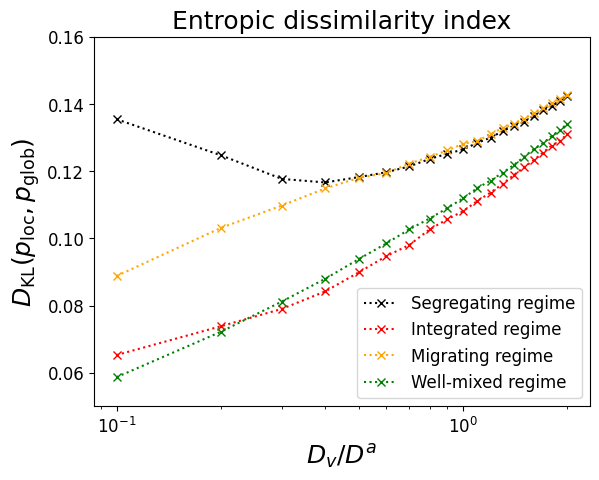

In [4]:
# Finite-volume run
plt.semilogx(Dv_space/D[0], Dkl_indices[:,0], "x:k", label = "Segregating regime")
plt.semilogx(Dv_space/D[0], Dkl_indices[:,1], "x:r", label = "Integrated regime")
plt.semilogx(Dv_space/D[0], Dkl_indices[:,2], "x:", color= 'orange', label = "Migrating regime")
plt.semilogx(Dv_space/D[0], Dkl_indices[:,3], "x:g", label = "Well-mixed regime")
# plt.semilogx(D[0]/Dv_space, Dkl_indices_mig[:], "x:", color='orange', label = "Migrating regime")
plt.xlabel(r"$D_v/D^a$", size=18)
plt.ylabel(r"$D_{\rm KL}(p_{\rm loc}, p_{\rm glob})$", size=18)
plt.title(r"Entropic dissimilarity index", size=18)
plt.ylim([0.05,0.16])
plt.xticks(size=12)
plt.yticks(size=12)
plt.legend(fontsize=12)
plt.show()

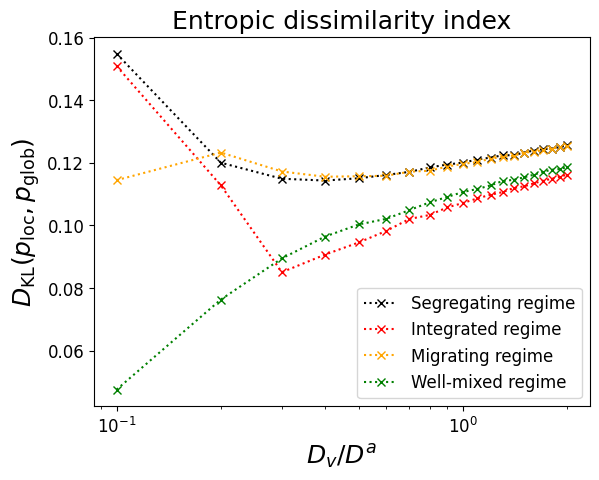

In [ ]:
# Finite difference noisy run
plt.semilogx(Dv_space/D[0], Dkl_indices[:,0], "x:k", label = "Segregating regime")
plt.semilogx(Dv_space/D[0], Dkl_indices[:,1], "x:r", label = "Integrated regime")
plt.semilogx(Dv_space/D[0], Dkl_indices[:,2], "x:", color= 'orange', label = "Migrating regime")
plt.semilogx(Dv_space/D[0], Dkl_indices[:,3], "x:g", label = "Well-mixed regime")
# plt.semilogx(D[0]/Dv_space, Dkl_indices_mig[:], "x:", color='orange', label = "Migrating regime")
plt.xlabel(r"$D_v/D^a$", size=18)
plt.ylabel(r"$D_{\rm KL}(p_{\rm loc}, p_{\rm glob})$", size=18)
plt.title(r"Entropic dissimilarity index", size=18)
plt.xticks(size=12)
plt.yticks(size=12)
plt.legend(fontsize=12)
plt.show()

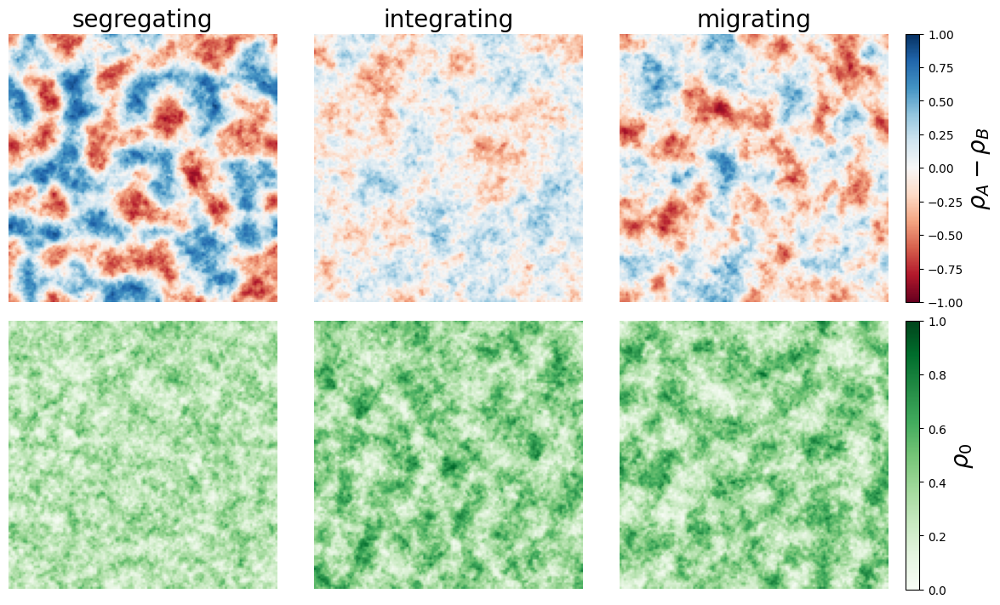

In [9]:
run = 0
Dv = 0.01

regimes = ["segregating", "integrating", "migrating"]

fig, ax = plt.subplots(
    2, 3,
    figsize=(12, 7),
    constrained_layout=True
)

ims_top = []
ims_bottom = []

for i, regime in enumerate(regimes):
    phi_run = np.load(f"data/{regime}/FV_run_{run}_fluc_Dv{Dv:.2f}.npy")

    phi_diff = phi_run[0] - phi_run[1]
    phi_0 = 1 - phi_run.sum(axis=0)

    im1 = ax[0, i].imshow(
        phi_diff[-1],
        cmap="RdBu",
        aspect="equal",
        origin="lower",
        extent=[-Lx/2, Lx/2, -Ly/2, Ly/2],
        vmin=-1,
        vmax=1
    )

    im2 = ax[1, i].imshow(
        phi_0[-1],
        cmap="Greens",
        aspect="equal",
        origin="lower",
        extent=[-Lx/2, Lx/2, -Ly/2, Ly/2],
        vmin=0,
        vmax=1
    )

    ax[0, i].axis("off")
    ax[1, i].axis("off")

    ax[0, i].set_title(regime, fontsize=20)

    ims_top.append(im1)
    ims_bottom.append(im2)

# One colorbar per row, aligned with all axes in that row
cbar1 = fig.colorbar(
    ims_top[-1],
    ax=ax[0, :],
    location="right",
    fraction=0.035,
    pad=0.02
)
cbar1.set_label(r"$\rho_A - \rho_B$", size=20)

cbar2 = fig.colorbar(
    ims_bottom[-1],
    ax=ax[1, :],
    location="right",
    fraction=0.035,
    pad=0.02
)
cbar2.set_label(r"$\rho_0$", size=20)
plt.savefig(f"images/schelling_phases_noise_Dv{Dv:.2f}.png")
plt.show()

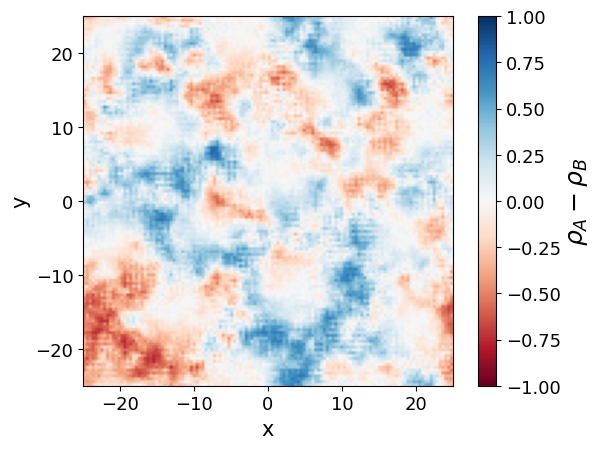

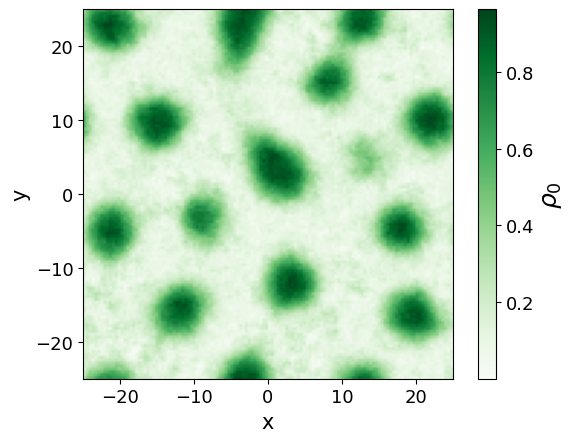

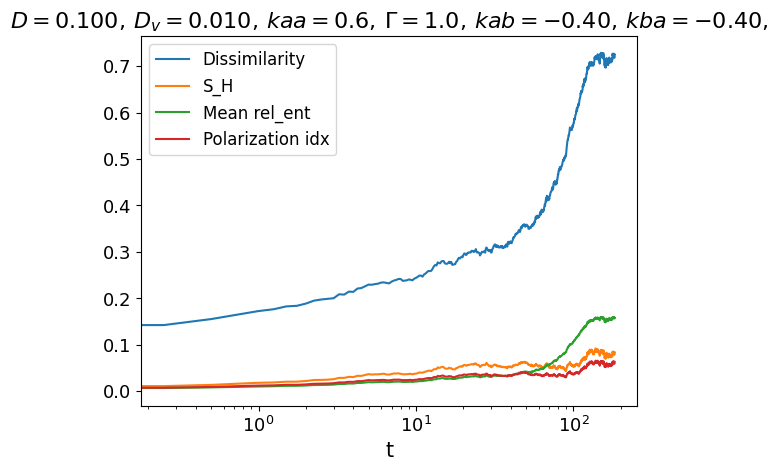

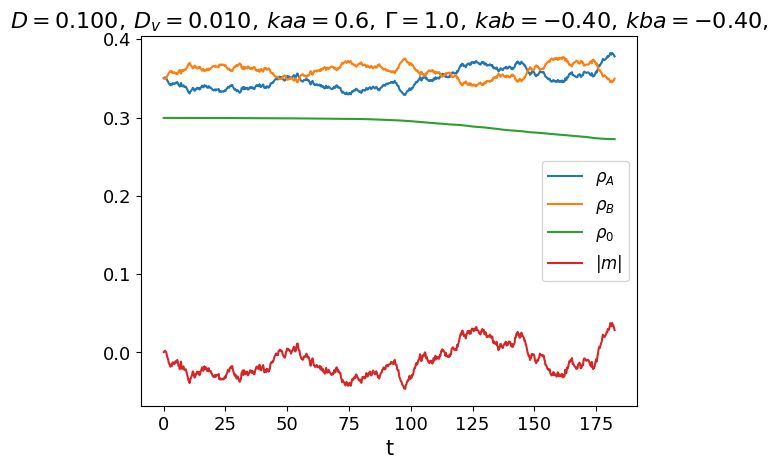

In [56]:
# p1_vals = np.arange(-1.0, 1.0001, 0.1)
# p2_vals = np.arange(-1.0, 1.0001, 0.1)
# D_v = 0.1
# D_idx = 20
# Dv_idx = 10

regime = "integrating"
run = 0
Dv = 0.01
# phi_run = np.load(f"data/bifurcation_run/run_MIG_D{D[0]:.2f}_Dv{Dv:.2f}_fwd.npy")
phi_run = np.load(f"data/{regime}/run_{run}_fluc_Dv{Dv:.2f}.npy")

# phi_run = np.load(f"data/{sweep}/run_kdiag06_Dv_{str(D_v)[0]+str(D_v)[2:]}_kab{kappa_ab:.2f}_kba{kappa_ba:.2f}.npy")

# phi_run = np.load(f"data/sweep2/run_kdiag06_Dv_0001_kab{kab:.2f}_kba_{kba:.2f}.npy")
frames = phi_run.shape[1]-1
nsteps = 500*frames
theta = 2/5
Lx, Ly = 50, 50


title = fr"$D = {D[0]:.3f},\, D_v = {Dv:.3f},\, kaa = {kappa_aa:.1f},\, \Gamma = { Gamma[0,0]},\, kab = {kappa_ab:.2f}, \, kba = {kappa_ba:.2f}, $"
phi_diff = phi_run[ 0] - phi_run[1]
# t = np.linspace(0,dt*nsteps, plot_every+1)
im =plt.imshow(phi_diff[-1], cmap = 'RdBu', aspect='equal', origin='lower', extent=[-Lx/2,Lx/2,-Ly/2,Ly/2], vmin=-1, vmax=1)
# plt.title(title)
plt.xlabel("x")
plt.ylabel("y")
cbar = plt.colorbar(im, fraction=0.046)
cbar.set_label(r"$\rho_A - \rho_B$",size=18)
# plt.savefig("fhd_plots/integrating_tanh_noisy_reactions.pdf")
plt.show()

phi0 = 1 -  phi_run[ 0] - phi_run[1]
# t = np.linspace(0,dt*nsteps, plot_every+1)
im =plt.imshow(phi0[-1], cmap = 'Greens', aspect='equal', origin='lower', extent=[-Lx/2,Lx/2,-Ly/2,Ly/2])
# plt.title(title)
plt.xlabel("x")
plt.ylabel("y")
cbar = plt.colorbar(im, fraction=0.046)
cbar.set_label(r"$\rho_0$",size=18)
# plt.savefig("fhd_plots/integrating_tanh_noisy_reactions.pdf")
plt.show()

def polarization_index(phi):
    mu = phi[0]-phi[1]
    # rho0 = 1- phi.sum(axis=0)
    return np.var(mu)

Rel_ent = np.array([fhd.mean_relative_entropy(phi_run[:,t]) for t in range(frames+1)])
Dis_idx = np.array([fhd.dissimilarity(phi_run[:,t]) for t in range(frames+1)])
Q_unhappy = np.array([fhd.fraction_unhappy(theta, phi_run[:,t]) for t in range(frames+1)])
pol_idx = np.array([polarization_index(phi_run[:,t]) for t in range(frames+1)])
S_H = np.array([fhd.entropy_index(phi_run[:,t]) for t in range(frames + 1)])

t = np.linspace(0, dt*nsteps, frames+1)
plt.plot(t,Dis_idx, label = "Dissimilarity")
plt.plot(t,S_H, label = "S_H")
plt.plot(t,Rel_ent,  label = "Mean rel_ent")
plt.plot(t,pol_idx, label = "Polarization idx")
plt.title(title)
# plt.yscale('log')
plt.xscale("log")
plt.xlabel("t")
plt.legend()
plt.show()

phi0_tot = np.mean(1-  phi_run.sum(axis=0), axis = (1,2))
rhoA = phi_run[0].mean(axis=(1,2))
rhoB = phi_run[1].mean(axis=(1,2))
t = np.linspace(0, dt*nsteps, frames+1)

plt.plot(t,rhoA, label = r"$\rho_A$")
plt.plot(t,rhoB, label = r"$\rho_B$")
plt.plot(t,phi0_tot, label = r"$\rho_0$")
plt.plot(t,rhoA - rhoB, label = r"$|m|$")
plt.title(title)
plt.xlabel("t")
plt.legend()
plt.show()

In [10]:
data_Tuan = np.load("data/long_scan_Gamma1_kappa_aa0.6_kappa_ab-0.4_kappa_ba-0.4_Da_0.100_Dv_0.050.npz")

In [12]:
snapshots= data_Tuan['snapshots']

In [42]:
from numpy.fft import fft2

M = 1800   # number of snapshots to average over
Nx = 100
Ny = 100
N = Nx * Ny
n_discard = 100 
snapshots_analysis = snapshots[n_discard:]
# snap_times_analysis = snap_times[n_discard:]

# -------------------------define physical k axes ----------------------------------
# (if domain lengths Lx,Ly, and spacing dx and dy)
Lx= 50/1.28
h = Lx/Nx # for the theory comparison
dx = Lx/Nx # in general, if we know the physical length Lx, and the number of houses along one axis, Nx then dx= Lx/Nx, the same for dy=Ly/Ny 
dy = Lx/Nx
kx = 2*np.pi * np.fft.fftfreq(Nx, d=dx)
ky = 2*np.pi * np.fft.fftfreq(Nx, d=dy)
kxg, kyg = np.meshgrid(kx, ky, indexing='ij')
kgrid = np.sqrt(kxg**2 + kyg**2)
k_flat = kgrid.ravel()

# -------------------- radial binning procedure ---------------------------------

kmax = k_flat.max()
nbins = 59  # choose reasonable number bins
kbins = np.linspace(0.0, kmax, nbins+1)
kcent = 0.5*(kbins[:-1] + kbins[1:])
bin_index = np.searchsorted(kbins, k_flat) - 1
valid_bin = (bin_index >= 0) & (bin_index < nbins)
counts = np.bincount(bin_index[valid_bin], minlength=nbins)

mask = counts > 0

# k grid excluding zero mode and any bins with zero count
k_vals = kcent[mask]

# we pick indices where k>0 (should be all valid except possibly first)
pos      = k_vals > 0
if len(pos) == 0:
    raise RuntimeError("No nonzero k bins.")

k_use = k_vals[pos]
k_vals   = k_use

#----------------------------------------helper functions--------------------------

def radial_average_2d(S2d):
    Sflat = S2d.ravel().real
    Srad = np.bincount(
        bin_index[valid_bin],
        weights=Sflat[valid_bin],
        minlength=nbins
    ).astype(float)
    Srad[mask] /= counts[mask]
    return Srad

take = min(M, len(snapshots_analysis))  # take the mininum between the required last M snapshots and the real length of snapshot

S_AA_acc = np.zeros((Ny, Nx), dtype=np.float64)
S_BB_acc = np.zeros((Ny, Nx), dtype=np.float64)
S_AB_acc = np.zeros((Ny, Nx), dtype=np.float64)
S_00_acc = np.zeros((Ny, Nx), dtype=np.float64)

S_AA_tidx = np.full(( take, nbins), np.nan)
S_BB_tidx = np.full(( take, nbins), np.nan)
S_AB_tidx = np.full(( take, nbins), np.nan)
S_00_tidx = np.full(( take, nbins), np.nan)

# store characteristic wave number vs time
kmean_tidx = np.full((take), np.nan)
kpeak_tidx = np.full((take), np.nan)


for jj,snap in enumerate(snapshots_analysis[-take:]):
    #indicator fields
    rhoA = (snap == 1).astype(float)
    rhoB = (snap == -1).astype(float)
    rho0 = (snap == 0).astype(float)

    stack_field = np.stack([rhoA, rhoB])
    #H_field += mean_relative_entropy(stack_field)
    #D_field += dissimilarity(stack_field)
    
    #mean (global) densities
    a0 = rhoA.mean()
    b0 = rhoB.mean()

    #fluctuations
    dA = rhoA - a0
    dB = rhoB - b0
    d0 = rho0 - rho0.mean()

    # FFTs
    dA_k = fft2(dA)
    dB_k = fft2(dB)
    d0_k = fft2(d0)

    S_AA_2d = (dA_k * np.conj(dA_k)).real / N
    S_BB_2d = (dB_k * np.conj(dB_k)).real / N
    S_00_2d = (d0_k * np.conj(d0_k)).real / N
    S_AB_2d = np.real(dA_k * np.conj(dB_k)) / N # complex in general; take real part for radial averaging

    # accumulate structure factors over the last M snapshots
    S_AA_acc += S_AA_2d
    S_BB_acc += S_BB_2d 
    S_00_acc += S_00_2d
    S_AB_acc += S_AB_2d 

    # radial average at THIS time point
    S_AA_t  = radial_average_2d(S_AA_2d)
    S_BB_t  = radial_average_2d(S_BB_2d)
    S_00_t  = radial_average_2d(S_00_2d)
    S_AB_t  = radial_average_2d(S_AB_2d)

    S_AA_tidx[jj, :] = S_AA_t 
    S_BB_tidx[jj, :] = S_BB_t 
    S_00_tidx[jj, :] = S_00_t 
    S_AB_tidx[jj, :] = S_AB_t 

    # characteristic k at this time
    Ssym_t = S_AA_t[mask][pos] + S_BB_t[mask][pos]
    if np.any(np.isfinite(Ssym_t)) and np.nansum(Ssym_t) > 0:
        kmean_tidx[jj] = np.sum(k_use * Ssym_t) / np.sum(Ssym_t)
        kpeak_tidx[jj] = k_use[np.argmax(Ssym_t)]

# average over snapshots
S_AA_k = S_AA_acc / take
S_BB_k = S_BB_acc / take
S_AB_k = S_AB_acc / take
S_00_k = S_00_acc / take

S_AA_flat = S_AA_k.ravel().real
S_BB_flat = S_BB_k.ravel().real
S_00_flat = S_00_k.ravel().real
S_AB_flat = np.real(S_AB_k.ravel())
Srad_A = np.zeros(nbins)
Srad_B = np.zeros(nbins)
Srad_0 = np.zeros(nbins)
Srad_AB = np.zeros(nbins)

for i, k in enumerate(k_flat):
    binidx = np.searchsorted(kbins, k) - 1
    if 0 <= binidx < nbins:
        Srad_A[binidx] += S_AA_flat[i]
        Srad_B[binidx] += S_BB_flat[i]
        Srad_0[binidx] += S_00_flat[i]
        Srad_AB[binidx] += S_AB_flat[i]
        counts[binidx] += 1

mask = counts>0 
Srad_A[mask] /= counts[mask]
Srad_B[mask] /= counts[mask]
Srad_0[mask] /= counts[mask]
Srad_AB[mask] /= counts[mask]

In [37]:
Srad_A.shape

(59,)

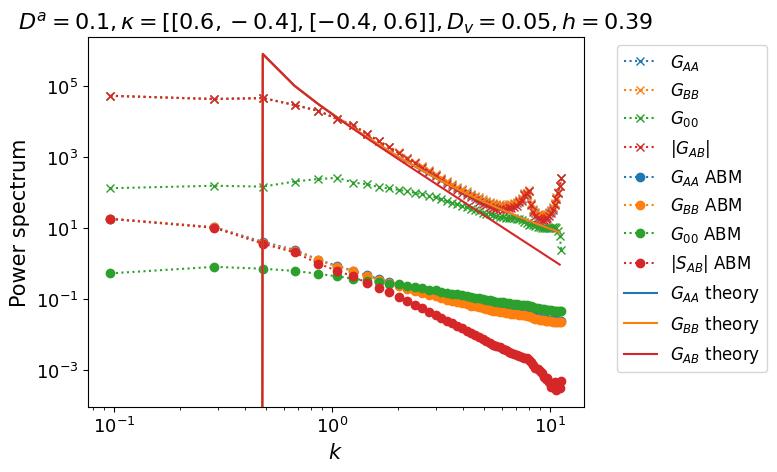

In [61]:
from structure_factor import *
from scipy.optimize import minimize

# averaging_bp = -200
# k_bins, power_spectra, G_AB = fhd.power_spectrum(phi_run, (Lx, Ly), num_bins=60, bp = averaging_bp, centered = True)
param['h'] = 50/128
# # param['D_v'] = 0.1
regimes = ["segregating", "integrating", "migrating", "well-mixed"]
# regimes = ["migrating", "well-mixed"]
kappas = [np.array([[0.6, -0.4],[-0.4, 0.6]]), np.array([[0.6, 1], [1, 0.6]]),
np.array([[1, 1], [-1, 1]]), np.array([[0.6, 0.4], [0.6, 0.4]])]

regime_idx = 0
Dv_idx = 4
Dv = Dv_space[Dv_idx]

if regimes[regime_idx] == "segregating":
    param['kappa'] = kappas[0]
elif regimes[regime_idx] == "integrating":
    param['kappa'] = kappas[1]
elif regimes[regime_idx] == "migrating":
    param['kappa'] = kappas[2]
elif regimes[regime_idx] == "well-mixed":
    param['kappa'] = kappas[3]

run = 1
phi_run = np.load(f"data/{regimes[regime_idx]}/run_{run}_fluc_Dv{Dv:.2f}.npy")
k_bins, power_spectra, G_AB = fhd.power_spectrum(phi_run, (Lx, Ly), num_bins=60, averaged = True, bp = 200, centered = True)

# power_spectra, G_AB = PS_matrix[Dv_idx, regime_idx], GAB_matrix[Dv_idx, regime_idx]


# param["D"] = D*np.ones(2)
param["D_v"] = Dv

S_AA_theory = np.zeros(len(k_bins))
S_AB_theory = np.zeros(len(k_bins))
S_BB_theory = np.zeros(len(k_bins))

for i, k in enumerate(k_bins):
    structure_factors = structure_factor(k,phi_run[0,averaging_bp:,:].mean(), phi_run[1,averaging_bp:,:].mean(), param)
    S_AA_theory[i] = structure_factors[0,0]
    S_AB_theory[i] = structure_factors[0,1]
    S_BB_theory[i] = structure_factors[1,1]

amp = 4000
theory_bp = 5
theory_ep = -1
k_bins_thy = k_bins[theory_bp: theory_ep]

def std_amp(amp, theory, data):
    AA = np.abs(amp*theory[0] - data[0])
    BB = np.abs(amp*theory[1] - data[1])
    AB = np.abs(amp*theory[2] - data[2])
    return np.std(np.array([AA,BB,AB]))

theory = np.array([S_AA_theory[theory_bp:theory_ep], S_BB_theory[theory_bp:theory_ep], np.abs(S_AB_theory[theory_bp:theory_ep])])
data = np.array([power_spectra[0,theory_bp:theory_ep],power_spectra[1,theory_bp:theory_ep], np.abs(G_AB[theory_bp:theory_ep])])
data_Tuan = np.array([Srad_A[theory_bp:theory_ep],Srad_B[theory_bp:theory_ep], np.abs(Srad_AB[theory_bp:theory_ep])])
optamp = minimize(std_amp, amp, args = (theory, data))

# dk = k_bins[1]-k_bins[0]

amp=optamp.x
# amp = 1
plt.plot(k_bins[:], power_spectra[0,:], "x:", label = r"$G_{AA}$", color = 'tab:blue')
# plt.plot(k_max_AA, interpolate_func(k_max_AA), marker = "*", color = 'k')
plt.plot(k_bins[:], power_spectra[1,:], "x:", label = r"$G_{BB}$", color = 'tab:orange')
plt.plot(k_bins[:], power_spectra[2,:], "x:", label = r"$G_{00}$", color = 'tab:green')
plt.plot(k_bins[:], np.abs(G_AB)[:], "x:", label = r"$|G_{AB}|$", color = 'tab:red')

plt.plot(k_bins[:], Srad_A, "o:", label = r"$G_{AA}$ ABM", color = 'tab:blue')
# plt.plot(k_max_AA, interpolate_func(k_max_AA), marker = "*", color = 'k')
plt.plot(k_bins[:], Srad_B, "o:", label = r"$G_{BB}$ ABM", color = 'tab:orange')
plt.plot(k_bins[:], Srad_0, "o:", label = r"$G_{00}$ ABM", color = 'tab:green')
plt.plot(k_bins[:], np.abs(Srad_AB)[:], "o:", label = r"$|S_{AB}|$ ABM", color = 'tab:red')

plt.plot(k_bins[:theory_ep], amp*S_AA_theory[:theory_ep].real, '-', label = r"$G_{AA}$ theory",  color = 'tab:blue')
plt.plot(k_bins[:theory_ep], amp*S_BB_theory[:theory_ep].real, '-', label = r"$G_{BB}$ theory", color = 'tab:orange')
plt.plot(k_bins[:theory_ep], -amp*S_AB_theory[:theory_ep], '-', label = r"$G_{AB}$ theory", color = 'tab:red')
plt.title(fr"$D^a = {param['D'][0]},  \kappa = [[{kappa_aa:.1f},{kappa_ab:.1f}],[{kappa_ba:.1f},{kappa_bb:.1f}]], D_v = {param['D_v']:.2f}, h = {param['h']:.2f}$")
plt.xscale('log')
plt.yscale('log')
plt.xlabel(r"$k$")
plt.ylabel(r"Power spectrum")
plt.legend(bbox_to_anchor =  (1.05,1))
plt.tight_layout
plt.show()

In [51]:
param

{'D': array([0.1, 0.1]),
 'kappa': array([[ 0.6, -0.4],
        [-0.4,  0.6]]),
 'Gamma': array([[1., 0.],
        [0., 1.]]),
 'nu': array([[[0., 0.],
         [0., 0.]],
 
        [[0., 0.],
         [0., 0.]]]),
 'D_v': np.float64(0.05),
 'beta': 10,
 'noise_v': 1,
 'h': 0.390625}

In [47]:
amp

array([5.18159326])

/tmp/ipykernel_2141833/2663869085.py:72: RuntimeWarning: All-NaN slice encountered
  envelope = np.nanmax(


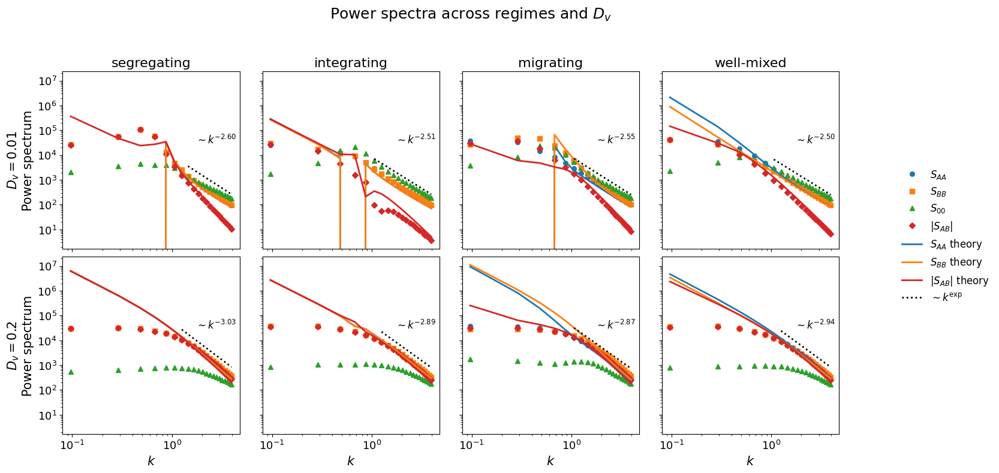

In [ ]:
from structure_factor import *
import numpy as np
import matplotlib.pyplot as plt

regimes = ["segregating", "integrating", "migrating", "well-mixed"]

kappas = [
    np.array([[0.6, -0.4], [-0.4, 0.6]]),
    np.array([[0.6,  1.0], [ 1.0, 0.6]]),
    np.array([[1.0,  1.0], [-1.0, 1.0]]),
    np.array([[0.6,  0.4], [ 0.6, 0.4]])
]

Dv_indices = [0, 19]

# Large-k cutoff
k_max_cutoff = 4

# Number of theory points to omit from display
theory_skip = 0

# ---------- styling for paper ----------
title_fs  = 16
label_fs  = 15
tick_fs   = 13
legend_fs = 12
text_fs   = 12

lw_th     = 2.0
lw_ref    = 2.0
ms        = 5.5

plt.rcParams.update({
    "font.size": tick_fs,
    "axes.labelsize": label_fs,
    "axes.titlesize": title_fs,
    "xtick.labelsize": tick_fs,
    "ytick.labelsize": tick_fs,
    "legend.fontsize": legend_fs,
})

# ---------- helper functions ----------
def fit_amplitude_logspace(theory, data):
    """
    Fit a multiplicative amplitude amp in log-space:
        log(data) ~ log(amp) + log(theory)
    """
    valid = (
        np.isfinite(theory) & np.isfinite(data) &
        (theory > 0) & (data > 0)
    )

    if not np.any(valid):
        return 1.0

    log_amp = np.mean(np.log(data[valid]) - np.log(theory[valid]))
    return np.exp(log_amp)


def get_k_mask(k_bins, k_max_cutoff=None):
    mask = (k_bins > 0)
    if k_max_cutoff is not None:
        mask &= (k_bins <= k_max_cutoff)
    return mask


def get_dynamic_fit_mask(k_bins, k_mask, power_spectra, G_AB, n_after_peak=2):
    """
    Start the fit 2 points after the maximum of the data envelope
    from S_AA, S_BB, and |S_AB|.
    """
    envelope = np.nanmax(
        np.vstack([
            np.where(k_mask, power_spectra[0], np.nan),
            np.where(k_mask, power_spectra[1], np.nan),
            np.where(k_mask, np.abs(G_AB), np.nan)
        ]),
        axis=0
    )

    if np.all(np.isnan(envelope)):
        idx_start = 1
    else:
        idx_start = np.nanargmax(envelope) + n_after_peak

    idx = np.arange(len(k_bins))
    fit_mask = k_mask & (idx >= idx_start)

    if np.sum(fit_mask) < 3:
        fit_mask = k_mask & (idx >= max(1, idx_start - n_after_peak))

    return fit_mask


def fit_power_law_tail(k, y, n_after_peak=2, min_points=4):
    """
    Fit a power law y ~ A * k^exp to the high-k tail of y.

    The fit starts 2 points after the maximum of y and uses the rest
    of the available k-range. The fit is done in log-log space:
        log(y) = log(A) + exp * log(k)

    Returns
    -------
    exp_fit : float
        Fitted exponent.
    A_fit : float
        Fitted prefactor.
    tail_mask : boolean array
        Mask of the points used in the fit, in the coordinates of k and y.
    """
    valid = np.isfinite(k) & np.isfinite(y) & (k > 0) & (y > 0)

    k_valid = k[valid]
    y_valid = y[valid]

    if len(k_valid) < min_points:
        return np.nan, np.nan, np.zeros_like(k, dtype=bool)

    peak_idx = np.argmax(y_valid)
    start_idx = peak_idx + n_after_peak

    if start_idx >= len(k_valid) - min_points:
        start_idx = max(0, len(k_valid) - min_points)

    k_tail = k_valid[start_idx:]
    y_tail = y_valid[start_idx:]

    if len(k_tail) < 2:
        return np.nan, np.nan, np.zeros_like(k, dtype=bool)

    coeffs = np.polyfit(np.log(k_tail), np.log(y_tail), 1)
    exp_fit = coeffs[0]
    logA_fit = coeffs[1]
    A_fit = np.exp(logA_fit)

    tail_mask = np.zeros_like(k, dtype=bool)
    valid_indices = np.where(valid)[0]
    tail_indices = valid_indices[start_idx:]
    tail_mask[tail_indices] = True

    return exp_fit, A_fit, tail_mask


def add_fitted_powerlaw_reference(ax, k, y, exp_fit, tail_mask, 
                                  vertical_shift=2.5, label=None):
    """
    Add a reference line y_ref ~ k^exp_fit over the tail region.
    The line is shifted upward by 'vertical_shift' to avoid overlap.
    """
    if np.isnan(exp_fit):
        return

    if np.sum(tail_mask) < 2:
        return

    k_tail = k[tail_mask]
    y_tail = y[tail_mask]

    valid = np.isfinite(k_tail) & np.isfinite(y_tail) & (k_tail > 0) & (y_tail > 0)
    k_tail = k_tail[valid]
    y_tail = y_tail[valid]

    if len(k_tail) < 2:
        return

    # Anchor the guide line near the first point of the fitted tail,
    # but place it somewhat above the data/theory.
    k0 = k_tail[0]
    y0 = vertical_shift * y_tail[0]

    y_ref = y0 * (k_tail / k0) ** exp_fit

    ax.plot(k_tail, y_ref, "k:", lw=lw_ref, label=label)


# ---------- figure ----------
fig, axes = plt.subplots(
    nrows=2,
    ncols=4,
    figsize=(16, 8),
    sharex=True,
    sharey=True
)

for row_idx, Dv_idx in enumerate(Dv_indices):

    Dv = Dv_space[Dv_idx]

    for regime_idx, regime in enumerate(regimes):

        ax = axes[row_idx, regime_idx]

        param_panel = param.copy()
        param_panel["kappa"] = kappas[regime_idx]
        param_panel["D_v"] = Dv

        power_spectra = PS_matrix[Dv_idx, regime_idx]
        G_AB = GAB_matrix[Dv_idx, regime_idx]

        # compute theory
        S_AA_theory = np.zeros(len(k_bins), dtype=complex)
        S_AB_theory = np.zeros(len(k_bins), dtype=complex)
        S_BB_theory = np.zeros(len(k_bins), dtype=complex)

        phi_A_mean = phi_run[0, averaging_bp:, :].mean()
        phi_B_mean = phi_run[1, averaging_bp:, :].mean()

        for i, k in enumerate(k_bins):
            structure_factors = structure_factor(
                k,
                phi_A_mean,
                phi_B_mean,
                param_panel
            )
            S_AA_theory[i] = structure_factors[0, 0]
            S_AB_theory[i] = structure_factors[0, 1]
            S_BB_theory[i] = structure_factors[1, 1]

        # masks
        k_mask = get_k_mask(k_bins, k_max_cutoff=k_max_cutoff)
        fit_mask = get_dynamic_fit_mask(
            k_bins, k_mask, power_spectra, G_AB, n_after_peak=2
        )

        # optionally also remove the first displayed theory points from the fit
        theory_indices_all = np.where(k_mask)[0]
        if len(theory_indices_all) > theory_skip:
            fit_mask[theory_indices_all[:theory_skip]] = False

        # log-space amplitude fit
        theory_fit = np.vstack([
            S_AA_theory[fit_mask].real,
            S_BB_theory[fit_mask].real,
            np.abs(S_AB_theory[fit_mask])
        ])

        data_fit = np.vstack([
            power_spectra[0, fit_mask],
            power_spectra[1, fit_mask],
            np.abs(G_AB[fit_mask])
        ])

        amp = fit_amplitude_logspace(theory_fit, data_fit)

        # plotting mask
        plot_mask = k_mask
        k_plot = k_bins[plot_mask]

        # theory display mask: skip first few displayed theory points
        theory_indices = np.where(plot_mask)[0]
        theory_plot_indices = theory_indices[theory_skip:]

        # ---------- DATA: markers only ----------
        ax.plot(
            k_plot, power_spectra[0, plot_mask],
            linestyle="None", marker="o", color="tab:blue",
            ms=ms, label=r"$S_{AA}$"
        )
        ax.plot(
            k_plot, power_spectra[1, plot_mask],
            linestyle="None", marker="s", color="tab:orange",
            ms=ms, label=r"$S_{BB}$"
        )
        ax.plot(
            k_plot, power_spectra[2, plot_mask],
            linestyle="None", marker="^", color="tab:green",
            ms=ms, label=r"$S_{00}$"
        )
        ax.plot(
            k_plot, np.abs(G_AB[plot_mask]),
            linestyle="None", marker="D", color="tab:red",
            ms=ms, label=r"$|S_{AB}|$"
        )

        # ---------- THEORY ----------
        ax.plot(
            k_bins[theory_plot_indices],
            amp * S_AA_theory[theory_plot_indices].real,
            "-", color="tab:blue", lw=lw_th, label=r"$S_{AA}$ theory"
        )
        ax.plot(
            k_bins[theory_plot_indices],
            amp * S_BB_theory[theory_plot_indices].real,
            "-", color="tab:orange", lw=lw_th, label=r"$S_{BB}$ theory"
        )
        ax.plot(
            k_bins[theory_plot_indices],
            np.abs(amp * S_AB_theory[theory_plot_indices]),
            "-", color="tab:red", lw=lw_th, label=r"$|S_{AB}|$ theory"
        )

        # ---------- fit S_AA tail exponent and add reference ----------
        SAA_plot = power_spectra[0, plot_mask]

        exp_fit, A_fit, tail_mask_local = fit_power_law_tail(
            k_plot, SAA_plot, n_after_peak=5, min_points=4
        )

        add_fitted_powerlaw_reference(
            ax,
            k_plot,
            SAA_plot,
            exp_fit,
            tail_mask_local,
            vertical_shift=2.5,
            label=r"$\sim k^{\mathrm{exp}}$" if (row_idx == 0 and regime_idx == 0) else None
        )

        # add text with fitted exponent
        if np.isfinite(exp_fit):
            exp_text = fr"$\sim k^{{{exp_fit:.2f}}}$"
        else:
            exp_text = r"$\sim k^{\mathrm{nan}}$"

        ax.text(
            0.75, 0.65,
            exp_text,
            transform=ax.transAxes,
            fontsize=text_fs,
            va="top",
            ha="left"
        )

        # axes formatting
        ax.set_xscale("log")
        ax.set_yscale("log")
        ax.set_box_aspect(1)

        if row_idx == 0:
            ax.set_title(regime)

        if regime_idx == 0:
            ax.set_ylabel(fr"$D_v = {param_panel['D_v']}$" + "\nPower spectrum")

        if row_idx == 1:
            ax.set_xlabel(r"$k$")

        ax.tick_params(axis='both', which='both', labelsize=tick_fs)

# global legend
handles, labels = axes[0, 0].get_legend_handles_labels()
fig.legend(
    handles, labels,
    loc="center right",
    bbox_to_anchor=(1.05, 0.5),
    frameon=False,
    fontsize=legend_fs
)

# fig.suptitle("Power spectra across regimes and $D_v$", fontsize=title_fs + 2) 

plt.tight_layout(rect=[0, 0, 0.9, 0.95])
plt.savefig("images/Schelling_Voter_PS_FV.pdf")
plt.show()

# Run analysis (NOISE)

In [ ]:
#LOAD SWEEP CODE:
averaging_bp = -200
N = (2**7, 2**7)
L = (50,50)
Lx, Ly = L
sim_2d = fhd.fhd_2d(L,N, bc= 'periodic', fft=False)

Ta = 2/5
Tb = 2/5
kappa_aa = 1-Ta
kappa_bb = 1-Tb
kappa_ab = -Ta
kappa_ba = -Tb
nu = np.zeros((2,2,2))
# coupling matrix kappa  for pi^{(a)} = sum_b kappa_ab * (V * phi_b)
kappa = np.array([[kappa_aa, kappa_ab],
                  [kappa_ba, kappa_bb]])
D = 0.1*np.ones(2) # Schelling diffusion coefficient
Gamma = np.eye(2) # Utility nabla^3 term coefficient
D_v = 0.0 #Voter model diffusion term
beta = 10

param = {'D': D, 'kappa': kappa, 'Gamma': Gamma, 'nu': nu, 'D_v': D_v, 'beta': beta, 'noise_v' : 1, 'h': 0.1}

x = sim_2d.x
y = sim_2d.y

xx, yy = np.meshgrid(x, y, indexing='ij')
nspecies = sim_2d.nspecies
num_bins = 60

Dv_space = np.linspace(0.01,0.2,20)

regimes = ["segregating", "integrating", "migrating", "well-mixed"]
kappas = [np.array([[0.6, -0.4],[-0.4, 0.6]]), np.array([[0.6, 1], [1, 0.6]]),
np.array([[1, 1], [-1, 1]]), np.array([[0.6, 0.4], [0.6, 0.4]])]

H_indices = np.zeros((len(Dv_space),len(regimes)))
D_indices = np.zeros((len(Dv_space),len(regimes)))
Dkl_indices = np.zeros((len(Dv_space),len(regimes)))
Dkl_variance = np.zeros((len(Dv_space),len(regimes)))
kmeans = np.zeros((len(Dv_space),len(regimes)))
kpeaks = np.zeros((len(Dv_space),len(regimes)))
PS_matrix = np.zeros((len(Dv_space), len(regimes), 3, num_bins-1))
GAB_matrix = np.zeros((len(Dv_space), len(regimes), num_bins-1))

dt = 0.002
noise = True

def kmean(power_spectrum, k_bins):
    Z = np.sum(power_spectrum)
    kmean = np.sum(k_bins*power_spectrum)
    return kmean/Z


for i, Dv in enumerate(Dv_space):
    for r, regime in enumerate(regimes):
        phi_runs = []
        for n_run in range(10):
            try:    
                phi_run = np.load(f"data/{regime}/run_{n_run}_fluc_Dv{Dv:.2f}.npy")
                phi_runs.append(phi_run)
            except:
                print(f"Failed to load {regime} sweep run {n_run} for Dv = {Dv:.2f}")
                # phi_run = np.zeros((2,-averaging_bp+1)+N)
        phi_runs = np.array([phi_run[:,averaging_bp:] for phi_run in phi_runs])

        Dkl_list = [fhd.mean_relative_entropy(phi_runs[n_run,:,-t]) for t in range(-averaging_bp) for n_run in range(phi_runs.shape[0])]
        H_indices[i,r] = np.mean([fhd.entropy_index(phi_runs[n_run,:,-t]) for t in range(-averaging_bp) for n_run in range(phi_runs.shape[0])])
        D_indices[i,r] = np.mean([fhd.dissimilarity(phi_runs[n_run,:,-t]) for t in range(-averaging_bp) for n_run in range(phi_runs.shape[0])])
        Dkl_indices[i,r] = np.mean(Dkl_list)
        Dkl_variance[i,r] = np.var(Dkl_list)

        phi_runs = phi_runs.transpose((1,2,0,3,4))
        phi_runs = phi_runs.reshape((2, phi_runs.shape[1]*phi_runs.shape[2],)+N)
        k_bins, power_spectra, G_AB = fhd.power_spectrum(phi_runs, (Lx, Ly), num_bins=60, averaged = True,  centered = True)

        PS_matrix[i,r] = power_spectra
        GAB_matrix[i,r] = G_AB
        kmeans[i,r] = kmean(power_spectra[0]+power_spectra[1],k_bins)
        kpeaks[i,r] = k_bins[power_spectra[0].argmax()]


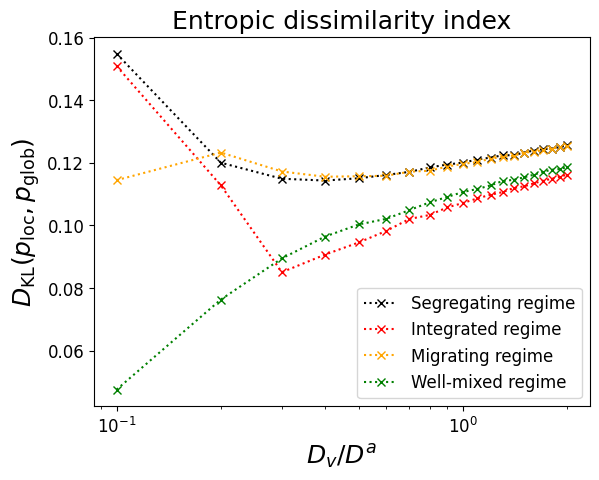

In [ ]:
# Finite difference noisy run
plt.semilogx(Dv_space/D[0], Dkl_indices[:,0], "x:k", label = "Segregating regime")
plt.semilogx(Dv_space/D[0], Dkl_indices[:,1], "x:r", label = "Integrated regime")
plt.semilogx(Dv_space/D[0], Dkl_indices[:,2], "x:", color= 'orange', label = "Migrating regime")
plt.semilogx(Dv_space/D[0], Dkl_indices[:,3], "x:g", label = "Well-mixed regime")
# plt.semilogx(D[0]/Dv_space, Dkl_indices_mig[:], "x:", color='orange', label = "Migrating regime")
plt.xlabel(r"$D_v/D^a$", size=18)
plt.ylabel(r"$D_{\rm KL}(p_{\rm loc}, p_{\rm glob})$", size=18)
plt.title(r"Entropic dissimilarity index", size=18)
plt.xticks(size=12)
plt.yticks(size=12)
plt.legend(fontsize=12)
plt.show()

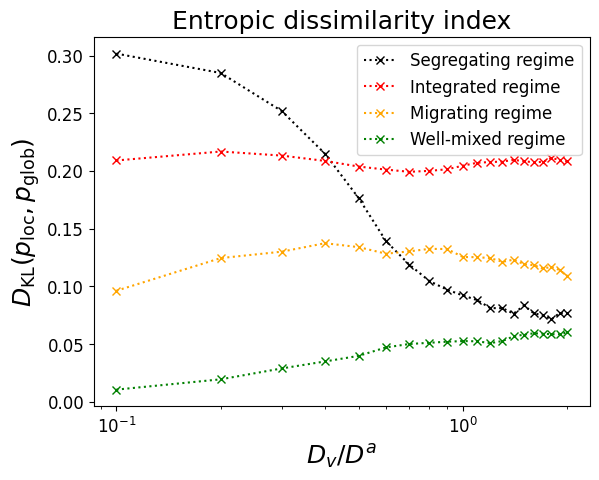

In [ ]:
# OLD PLOT DO NOT RUN CELL!!!

plt.semilogx(Dv_space/D[0], Dkl_indices[:,0], "x:k", label = "Segregating regime")
plt.semilogx(Dv_space/D[0], Dkl_indices[:,1], "x:r", label = "Integrated regime")
plt.semilogx(Dv_space/D[0], Dkl_indices[:,2], "x:", color= 'orange', label = "Migrating regime")
plt.semilogx(Dv_space/D[0], Dkl_indices[:,3], "x:g", label = "Well-mixed regime")
# plt.semilogx(D[0]/Dv_space, Dkl_indices_mig[:], "x:", color='orange', label = "Migrating regime")
plt.xlabel(r"$D_v/D^a$", size=18)
plt.ylabel(r"$D_{\rm KL}(p_{\rm loc}, p_{\rm glob})$", size=18)
plt.title(r"Entropic dissimilarity index", size=18)
plt.xticks(size=12)
plt.yticks(size=12)
plt.legend(fontsize=12)
plt.show()

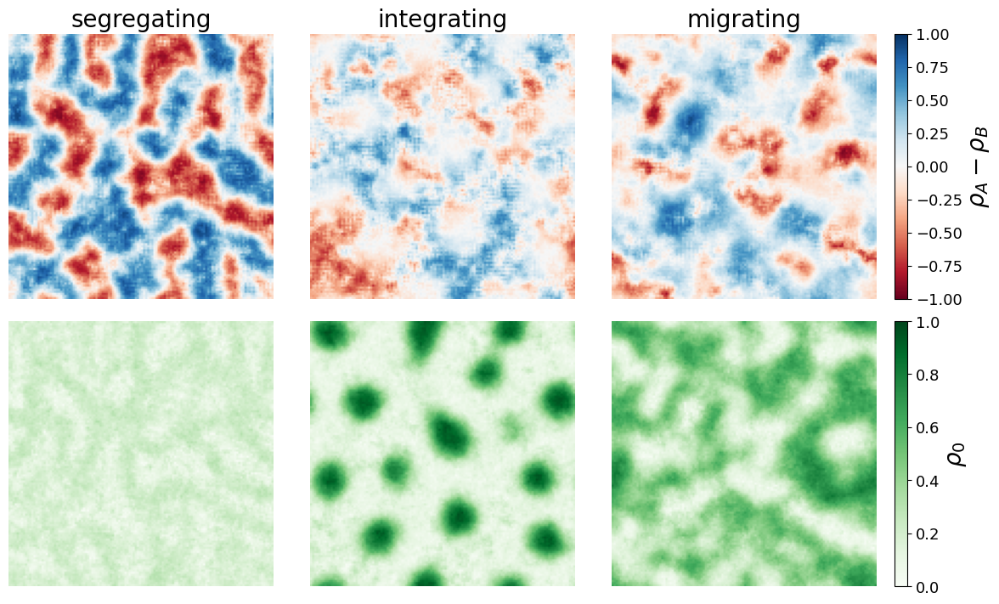

In [ ]:
run = 0
Dv = 0.01

regimes = ["segregating", "integrating", "migrating"]

fig, ax = plt.subplots(
    2, 3,
    figsize=(12, 7),
    constrained_layout=True
)

ims_top = []
ims_bottom = []

for i, regime in enumerate(regimes):
    phi_run = np.load(f"data/{regime}/run_{run}_fluc_Dv{Dv:.2f}.npy")

    phi_diff = phi_run[0] - phi_run[1]
    phi_0 = 1 - phi_run.sum(axis=0)

    im1 = ax[0, i].imshow(
        phi_diff[-1],
        cmap="RdBu",
        aspect="equal",
        origin="lower",
        extent=[-Lx/2, Lx/2, -Ly/2, Ly/2],
        vmin=-1,
        vmax=1
    )

    im2 = ax[1, i].imshow(
        phi_0[-1],
        cmap="Greens",
        aspect="equal",
        origin="lower",
        extent=[-Lx/2, Lx/2, -Ly/2, Ly/2],
        vmin=0,
        vmax=1
    )

    ax[0, i].axis("off")
    ax[1, i].axis("off")

    ax[0, i].set_title(regime, fontsize=20)

    ims_top.append(im1)
    ims_bottom.append(im2)

# One colorbar per row, aligned with all axes in that row
cbar1 = fig.colorbar(
    ims_top[-1],
    ax=ax[0, :],
    location="right",
    fraction=0.035,
    pad=0.02
)
cbar1.set_label(r"$\rho_A - \rho_B$", size=20)

cbar2 = fig.colorbar(
    ims_bottom[-1],
    ax=ax[1, :],
    location="right",
    fraction=0.035,
    pad=0.02
)
cbar2.set_label(r"$\rho_0$", size=20)
plt.savefig(f"images/schelling_phases_noise_Dv{Dv:.2f}.png")
plt.show()

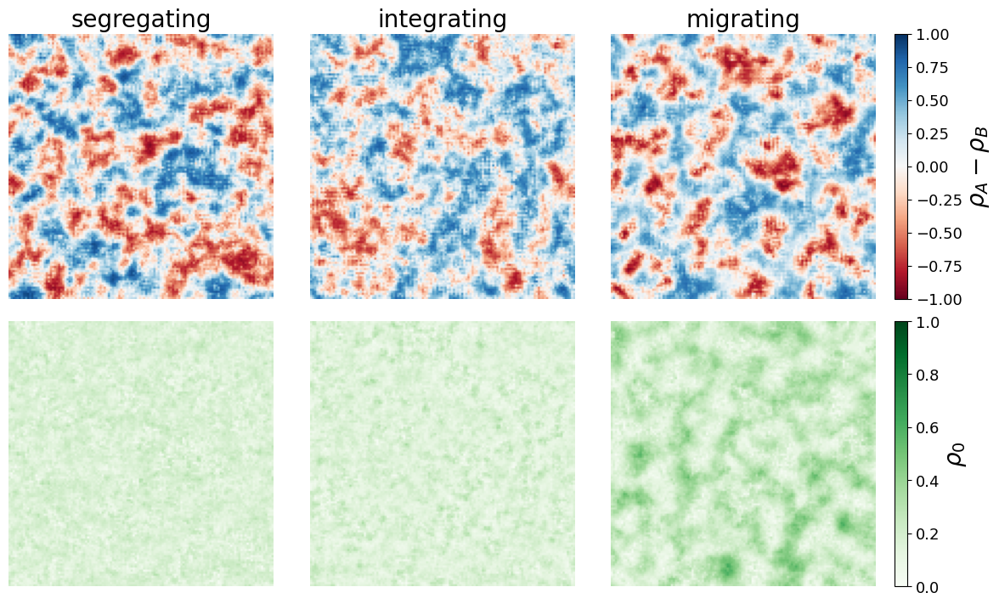

In [ ]:
# OLD PLOT DO NOT RUN CELL!!!

run = 0
Dv = 0.04

regimes = ["segregating", "integrating", "migrating"]

fig, ax = plt.subplots(
    2, 3,
    figsize=(12, 7),
    constrained_layout=True
)

ims_top = []
ims_bottom = []

for i, regime in enumerate(regimes):
    phi_run = np.load(f"data/{regime}/run_{run}_fluc_Dv{Dv:.2f}.npy")

    phi_diff = phi_run[0] - phi_run[1]
    phi_0 = 1 - phi_run.sum(axis=0)

    im1 = ax[0, i].imshow(
        phi_diff[-1],
        cmap="RdBu",
        aspect="equal",
        origin="lower",
        extent=[-Lx/2, Lx/2, -Ly/2, Ly/2],
        vmin=-1,
        vmax=1
    )

    im2 = ax[1, i].imshow(
        phi_0[-1],
        cmap="Greens",
        aspect="equal",
        origin="lower",
        extent=[-Lx/2, Lx/2, -Ly/2, Ly/2],
        vmin=0,
        vmax=1
    )

    ax[0, i].axis("off")
    ax[1, i].axis("off")

    ax[0, i].set_title(regime, fontsize=20)

    ims_top.append(im1)
    ims_bottom.append(im2)

# One colorbar per row, aligned with all axes in that row
cbar1 = fig.colorbar(
    ims_top[-1],
    ax=ax[0, :],
    location="right",
    fraction=0.035,
    pad=0.02
)
cbar1.set_label(r"$\rho_A - \rho_B$", size=20)

cbar2 = fig.colorbar(
    ims_bottom[-1],
    ax=ax[1, :],
    location="right",
    fraction=0.035,
    pad=0.02
)
cbar2.set_label(r"$\rho_0$", size=20)

plt.show()

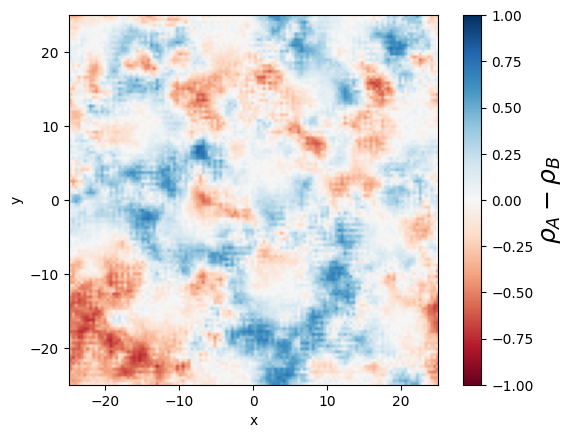

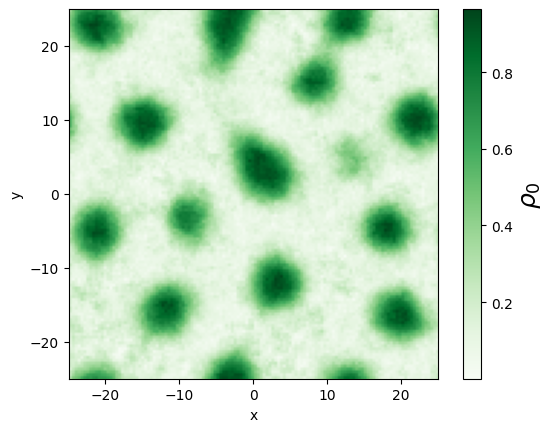

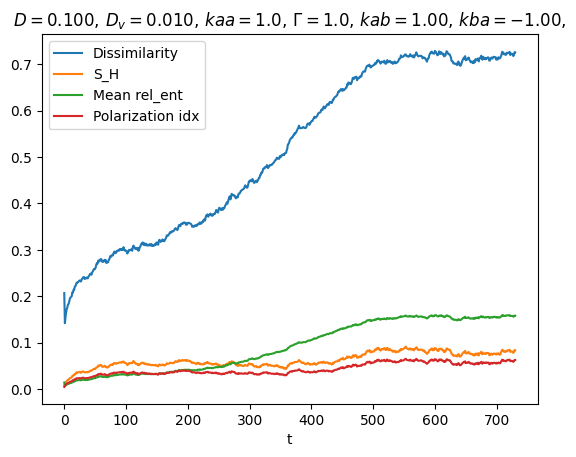

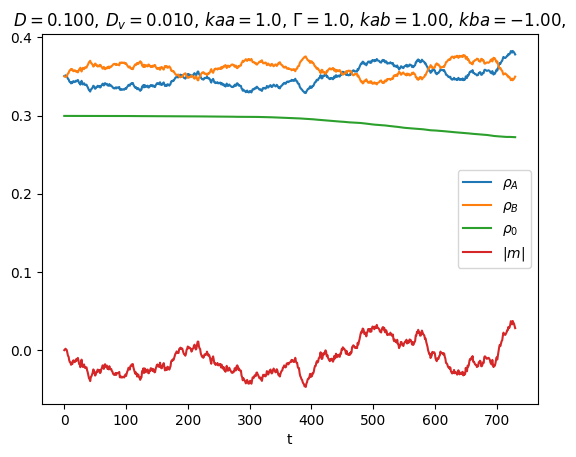

In [10]:
# p1_vals = np.arange(-1.0, 1.0001, 0.1)
# p2_vals = np.arange(-1.0, 1.0001, 0.1)
# D_v = 0.1
# D_idx = 20
# Dv_idx = 10

regime = "integrating"
run = 0
Dv = 0.01
# phi_run = np.load(f"data/bifurcation_run/run_MIG_D{D[0]:.2f}_Dv{Dv:.2f}_fwd.npy")
phi_run = np.load(f"data/{regime}/run_{run}_fluc_Dv{Dv:.2f}.npy")
dt = 2e-3
# nsteps = phi_run.shape[1]

# phi_run = np.load(f"data/{sweep}/run_kdiag06_Dv_{str(D_v)[0]+str(D_v)[2:]}_kab{kappa_ab:.2f}_kba{kappa_ba:.2f}.npy")

# phi_run = np.load(f"data/sweep2/run_kdiag06_Dv_0001_kab{kab:.2f}_kba_{kba:.2f}.npy")
frames = phi_run.shape[1]-1
nsteps = 500*frames
theta = 2/5
Lx, Ly = 50, 50


title = fr"$D = {D[0]:.3f},\, D_v = {Dv:.3f},\, kaa = {kappa_aa:.1f},\, \Gamma = { Gamma[0,0]},\, kab = {kappa_ab:.2f}, \, kba = {kappa_ba:.2f}, $"
phi_diff = phi_run[ 0] - phi_run[1]
# t = np.linspace(0,dt*nsteps, plot_every+1)
im =plt.imshow(phi_diff[-1], cmap = 'RdBu', aspect='equal', origin='lower', extent=[-Lx/2,Lx/2,-Ly/2,Ly/2], vmin=-1, vmax=1)
# plt.title(title)
plt.xlabel("x")
plt.ylabel("y")
cbar = plt.colorbar(im, fraction=0.046)
cbar.set_label(r"$\rho_A - \rho_B$",size=18)
# plt.savefig("fhd_plots/integrating_tanh_noisy_reactions.pdf")
plt.show()

phi0 = 1 -  phi_run[ 0] - phi_run[1]
# t = np.linspace(0,dt*nsteps, plot_every+1)
im =plt.imshow(phi0[-1], cmap = 'Greens', aspect='equal', origin='lower', extent=[-Lx/2,Lx/2,-Ly/2,Ly/2])
# plt.title(title)
plt.xlabel("x")
plt.ylabel("y")
cbar = plt.colorbar(im, fraction=0.046)
cbar.set_label(r"$\rho_0$",size=18)
# plt.savefig("fhd_plots/integrating_tanh_noisy_reactions.pdf")
plt.show()

def polarization_index(phi):
    mu = phi[0]-phi[1]
    # rho0 = 1- phi.sum(axis=0)
    return np.var(mu)

Rel_ent = np.array([fhd.mean_relative_entropy(phi_run[:,t]) for t in range(frames+1)])
Dis_idx = np.array([fhd.dissimilarity(phi_run[:,t]) for t in range(frames+1)])
Q_unhappy = np.array([fhd.fraction_unhappy(theta, phi_run[:,t]) for t in range(frames+1)])
pol_idx = np.array([polarization_index(phi_run[:,t]) for t in range(frames+1)])
S_H = np.array([fhd.entropy_index(phi_run[:,t]) for t in range(frames + 1)])

t = np.linspace(0, dt*nsteps, frames+1)
plt.plot(t,Dis_idx, label = "Dissimilarity")
plt.plot(t,S_H, label = "S_H")
plt.plot(t,Rel_ent,  label = "Mean rel_ent")
plt.plot(t,pol_idx, label = "Polarization idx")
plt.title(title)
# plt.yscale('log')
# plt.xscale("log")
plt.xlabel("t")
plt.legend()
plt.show()

phi0_tot = np.mean(1-  phi_run.sum(axis=0), axis = (1,2))
rhoA = phi_run[0].mean(axis=(1,2))
rhoB = phi_run[1].mean(axis=(1,2))
t = np.linspace(0, dt*nsteps, frames+1)

plt.plot(t,rhoA, label = r"$\rho_A$")
plt.plot(t,rhoB, label = r"$\rho_B$")
plt.plot(t,phi0_tot, label = r"$\rho_0$")
plt.plot(t,rhoA - rhoB, label = r"$|m|$")
plt.title(title)
plt.xlabel("t")
plt.legend()
plt.show()

In [9]:
nsteps

365000

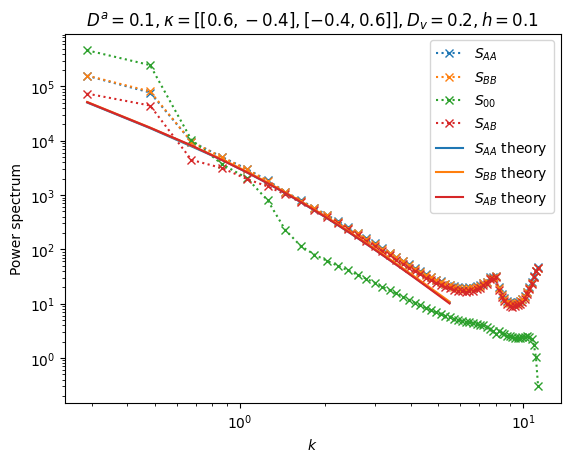

In [ ]:
from structure_factor import *
from scipy.optimize import minimize

# averaging_bp = -200
# k_bins, power_spectra, G_AB = fhd.power_spectrum(phi_run, (Lx, Ly), num_bins=60, bp = averaging_bp, centered = True)
# param['h'] = 0.1
# # param['D_v'] = 0.1
regimes = ["segregating", "integrating", "migrating", "well-mixed"]
# regimes = ["migrating", "well-mixed"]
kappas = [np.array([[0.6, -0.4],[-0.4, 0.6]]), np.array([[0.6, 1], [1, 0.6]]),
np.array([[1, 1], [-1, 1]]), np.array([[0.6, 0.4], [0.6, 0.4]])]

regime_idx = 1
Dv_idx = 19
Dv = Dv_space[Dv_idx]

if regimes[regime_idx] == "segregating":
    param['kappa'] = kappas[0]
elif regimes[regime_idx] == "integrating":
    param['kappa'] = kappas[1]
elif regimes[regime_idx] == "migrating":
    param['kappa'] = kappas[2]
elif regimes[regime_idx] == "well-mixed":
    param['kappa'] = kappas[3]

power_spectra, G_AB = PS_matrix[Dv_idx, regime_idx], GAB_matrix[Dv_idx, regime_idx]


# param["D"] = D*np.ones(2)
param["D_v"] = Dv

S_AA_theory = np.zeros(len(k_bins))
S_AB_theory = np.zeros(len(k_bins))
S_BB_theory = np.zeros(len(k_bins))

for i, k in enumerate(k_bins):
    structure_factors = structure_factor(k,phi_run[0,averaging_bp:,:].mean(), phi_run[1,averaging_bp:,:].mean(), param)
    S_AA_theory[i] = structure_factors[0,0]
    S_AB_theory[i] = structure_factors[0,1]
    S_BB_theory[i] = structure_factors[1,1]

amp = 4000
theory_bp = 5
theory_ep = -30
k_bins_thy = k_bins[theory_bp: theory_ep]

def std_amp(amp, theory, data):
    AA = np.abs(amp*theory[0] - data[0])
    BB = np.abs(amp*theory[1] - data[1])
    AB = np.abs(amp*theory[2] - data[2])
    return np.std(np.array([AA,BB,AB]))

theory = np.array([S_AA_theory[theory_bp:theory_ep], S_BB_theory[theory_bp:theory_ep], np.abs(S_AB_theory[theory_bp:theory_ep])])
data = np.array([power_spectra[0,theory_bp:theory_ep],power_spectra[1,theory_bp:theory_ep], np.abs(G_AB[theory_bp:theory_ep])])
optamp = minimize(std_amp, amp, args = (theory, data))

# dk = k_bins[1]-k_bins[0]

amp=optamp.x
# amp = 1
plt.plot(k_bins[1:], power_spectra[0,1:], "x:", label = r"$S_{AA}$", color = 'tab:blue')
# plt.plot(k_max_AA, interpolate_func(k_max_AA), marker = "*", color = 'k')
plt.plot(k_bins[1:], power_spectra[1,1:], "x:", label = r"$S_{BB}$", color = 'tab:orange')
plt.plot(k_bins[1:], power_spectra[2,1:], "x:", label = r"$S_{00}$", color = 'tab:green')
plt.plot(k_bins[1:], np.abs(G_AB)[1:], "x:", label = r"$S_{AB}$", color = 'tab:red')
plt.plot(k_bins[1:theory_ep], amp*S_AA_theory[1:theory_ep].real, '-', label = r"$S_{AA}$ theory",  color = 'tab:blue')
plt.plot(k_bins[1:theory_ep], amp*S_BB_theory[1:theory_ep].real, '-', label = r"$S_{BB}$ theory", color = 'tab:orange')
plt.plot(k_bins[1:theory_ep], -amp*S_AB_theory[1:theory_ep], '-', label = r"$S_{AB}$ theory", color = 'tab:red')
plt.title(fr"$D^a = {param['D'][0]},  \kappa = [[{kappa_aa:.1f},{kappa_ab:.1f}],[{kappa_ba:.1f},{kappa_bb:.1f}]], D_v = {param['D_v']}, h = {param['h']}$")
plt.xscale('log')
plt.yscale('log')
plt.xlabel(r"$k$")
plt.ylabel(r"Power spectrum")
plt.legend()
plt.tight_layout
plt.show()

/tmp/ipykernel_3361501/2497327470.py:72: RuntimeWarning: All-NaN slice encountered
  envelope = np.nanmax(


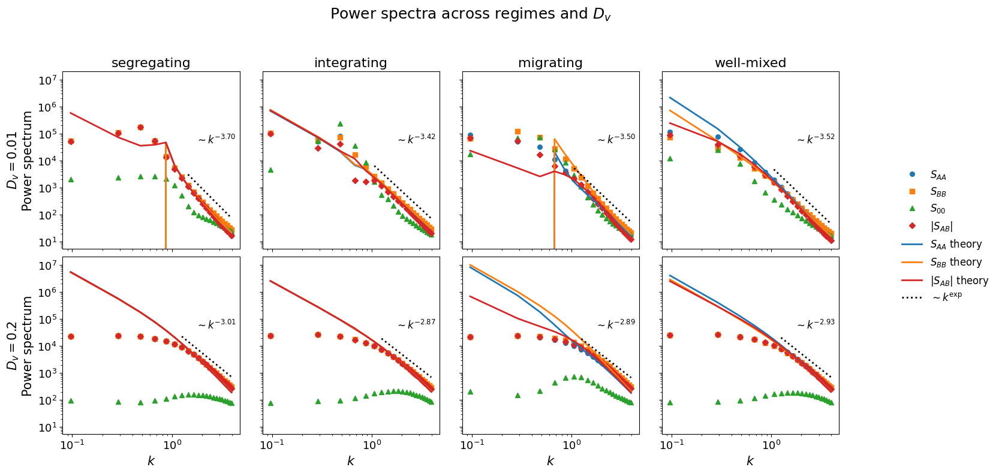

In [ ]:
from structure_factor import *
import numpy as np
import matplotlib.pyplot as plt

regimes = ["segregating", "integrating", "migrating", "well-mixed"]

kappas = [
    np.array([[0.6, -0.4], [-0.4, 0.6]]),
    np.array([[0.6,  1.0], [ 1.0, 0.6]]),
    np.array([[1.0,  1.0], [-1.0, 1.0]]),
    np.array([[0.6,  0.4], [ 0.6, 0.4]])
]

Dv_indices = [0, 19]

# Large-k cutoff
k_max_cutoff = 4

# Number of theory points to omit from display
theory_skip = 0

# ---------- styling for paper ----------
title_fs  = 16
label_fs  = 15
tick_fs   = 13
legend_fs = 12
text_fs   = 12

lw_th     = 2.0
lw_ref    = 2.0
ms        = 5.5

plt.rcParams.update({
    "font.size": tick_fs,
    "axes.labelsize": label_fs,
    "axes.titlesize": title_fs,
    "xtick.labelsize": tick_fs,
    "ytick.labelsize": tick_fs,
    "legend.fontsize": legend_fs,
})

# ---------- helper functions ----------
def fit_amplitude_logspace(theory, data):
    """
    Fit a multiplicative amplitude amp in log-space:
        log(data) ~ log(amp) + log(theory)
    """
    valid = (
        np.isfinite(theory) & np.isfinite(data) &
        (theory > 0) & (data > 0)
    )

    if not np.any(valid):
        return 1.0

    log_amp = np.mean(np.log(data[valid]) - np.log(theory[valid]))
    return np.exp(log_amp)


def get_k_mask(k_bins, k_max_cutoff=None):
    mask = (k_bins > 0)
    if k_max_cutoff is not None:
        mask &= (k_bins <= k_max_cutoff)
    return mask


def get_dynamic_fit_mask(k_bins, k_mask, power_spectra, G_AB, n_after_peak=2):
    """
    Start the fit 2 points after the maximum of the data envelope
    from S_AA, S_BB, and |S_AB|.
    """
    envelope = np.nanmax(
        np.vstack([
            np.where(k_mask, power_spectra[0], np.nan),
            np.where(k_mask, power_spectra[1], np.nan),
            np.where(k_mask, np.abs(G_AB), np.nan)
        ]),
        axis=0
    )

    if np.all(np.isnan(envelope)):
        idx_start = 1
    else:
        idx_start = np.nanargmax(envelope) + n_after_peak

    idx = np.arange(len(k_bins))
    fit_mask = k_mask & (idx >= idx_start)

    if np.sum(fit_mask) < 3:
        fit_mask = k_mask & (idx >= max(1, idx_start - n_after_peak))

    return fit_mask


def fit_power_law_tail(k, y, n_after_peak=2, min_points=4):
    """
    Fit a power law y ~ A * k^exp to the high-k tail of y.

    The fit starts 2 points after the maximum of y and uses the rest
    of the available k-range. The fit is done in log-log space:
        log(y) = log(A) + exp * log(k)

    Returns
    -------
    exp_fit : float
        Fitted exponent.
    A_fit : float
        Fitted prefactor.
    tail_mask : boolean array
        Mask of the points used in the fit, in the coordinates of k and y.
    """
    valid = np.isfinite(k) & np.isfinite(y) & (k > 0) & (y > 0)

    k_valid = k[valid]
    y_valid = y[valid]

    if len(k_valid) < min_points:
        return np.nan, np.nan, np.zeros_like(k, dtype=bool)

    peak_idx = np.argmax(y_valid)
    start_idx = peak_idx + n_after_peak

    if start_idx >= len(k_valid) - min_points:
        start_idx = max(0, len(k_valid) - min_points)

    k_tail = k_valid[start_idx:]
    y_tail = y_valid[start_idx:]

    if len(k_tail) < 2:
        return np.nan, np.nan, np.zeros_like(k, dtype=bool)

    coeffs = np.polyfit(np.log(k_tail), np.log(y_tail), 1)
    exp_fit = coeffs[0]
    logA_fit = coeffs[1]
    A_fit = np.exp(logA_fit)

    tail_mask = np.zeros_like(k, dtype=bool)
    valid_indices = np.where(valid)[0]
    tail_indices = valid_indices[start_idx:]
    tail_mask[tail_indices] = True

    return exp_fit, A_fit, tail_mask


def add_fitted_powerlaw_reference(ax, k, y, exp_fit, tail_mask, 
                                  vertical_shift=2.5, label=None):
    """
    Add a reference line y_ref ~ k^exp_fit over the tail region.
    The line is shifted upward by 'vertical_shift' to avoid overlap.
    """
    if np.isnan(exp_fit):
        return

    if np.sum(tail_mask) < 2:
        return

    k_tail = k[tail_mask]
    y_tail = y[tail_mask]

    valid = np.isfinite(k_tail) & np.isfinite(y_tail) & (k_tail > 0) & (y_tail > 0)
    k_tail = k_tail[valid]
    y_tail = y_tail[valid]

    if len(k_tail) < 2:
        return

    # Anchor the guide line near the first point of the fitted tail,
    # but place it somewhat above the data/theory.
    k0 = k_tail[0]
    y0 = vertical_shift * y_tail[0]

    y_ref = y0 * (k_tail / k0) ** exp_fit

    ax.plot(k_tail, y_ref, "k:", lw=lw_ref, label=label)


# ---------- figure ----------
fig, axes = plt.subplots(
    nrows=2,
    ncols=4,
    figsize=(16, 8),
    sharex=True,
    sharey=True
)

for row_idx, Dv_idx in enumerate(Dv_indices):

    Dv = Dv_space[Dv_idx]

    for regime_idx, regime in enumerate(regimes):

        ax = axes[row_idx, regime_idx]

        param_panel = param.copy()
        param_panel["kappa"] = kappas[regime_idx]
        param_panel["D_v"] = Dv

        power_spectra = PS_matrix[Dv_idx, regime_idx]
        G_AB = GAB_matrix[Dv_idx, regime_idx]

        # compute theory
        S_AA_theory = np.zeros(len(k_bins), dtype=complex)
        S_AB_theory = np.zeros(len(k_bins), dtype=complex)
        S_BB_theory = np.zeros(len(k_bins), dtype=complex)

        phi_A_mean = phi_run[0, averaging_bp:, :].mean()
        phi_B_mean = phi_run[1, averaging_bp:, :].mean()

        for i, k in enumerate(k_bins):
            structure_factors = structure_factor(
                k,
                phi_A_mean,
                phi_B_mean,
                param_panel
            )
            S_AA_theory[i] = structure_factors[0, 0]
            S_AB_theory[i] = structure_factors[0, 1]
            S_BB_theory[i] = structure_factors[1, 1]

        # masks
        k_mask = get_k_mask(k_bins, k_max_cutoff=k_max_cutoff)
        fit_mask = get_dynamic_fit_mask(
            k_bins, k_mask, power_spectra, G_AB, n_after_peak=2
        )

        # optionally also remove the first displayed theory points from the fit
        theory_indices_all = np.where(k_mask)[0]
        if len(theory_indices_all) > theory_skip:
            fit_mask[theory_indices_all[:theory_skip]] = False

        # log-space amplitude fit
        theory_fit = np.vstack([
            S_AA_theory[fit_mask].real,
            S_BB_theory[fit_mask].real,
            np.abs(S_AB_theory[fit_mask])
        ])

        data_fit = np.vstack([
            power_spectra[0, fit_mask],
            power_spectra[1, fit_mask],
            np.abs(G_AB[fit_mask])
        ])

        amp = fit_amplitude_logspace(theory_fit, data_fit)

        # plotting mask
        plot_mask = k_mask
        k_plot = k_bins[plot_mask]

        # theory display mask: skip first few displayed theory points
        theory_indices = np.where(plot_mask)[0]
        theory_plot_indices = theory_indices[theory_skip:]

        # ---------- DATA: markers only ----------
        ax.plot(
            k_plot, power_spectra[0, plot_mask],
            linestyle="None", marker="o", color="tab:blue",
            ms=ms, label=r"$S_{AA}$"
        )
        ax.plot(
            k_plot, power_spectra[1, plot_mask],
            linestyle="None", marker="s", color="tab:orange",
            ms=ms, label=r"$S_{BB}$"
        )
        ax.plot(
            k_plot, power_spectra[2, plot_mask],
            linestyle="None", marker="^", color="tab:green",
            ms=ms, label=r"$S_{00}$"
        )
        ax.plot(
            k_plot, np.abs(G_AB[plot_mask]),
            linestyle="None", marker="D", color="tab:red",
            ms=ms, label=r"$|S_{AB}|$"
        )

        # ---------- THEORY ----------
        ax.plot(
            k_bins[theory_plot_indices],
            amp * S_AA_theory[theory_plot_indices].real,
            "-", color="tab:blue", lw=lw_th, label=r"$S_{AA}$ theory"
        )
        ax.plot(
            k_bins[theory_plot_indices],
            amp * S_BB_theory[theory_plot_indices].real,
            "-", color="tab:orange", lw=lw_th, label=r"$S_{BB}$ theory"
        )
        ax.plot(
            k_bins[theory_plot_indices],
            np.abs(amp * S_AB_theory[theory_plot_indices]),
            "-", color="tab:red", lw=lw_th, label=r"$|S_{AB}|$ theory"
        )

        # ---------- fit S_AA tail exponent and add reference ----------
        SAA_plot = power_spectra[0, plot_mask]

        exp_fit, A_fit, tail_mask_local = fit_power_law_tail(
            k_plot, SAA_plot, n_after_peak=5, min_points=4
        )

        add_fitted_powerlaw_reference(
            ax,
            k_plot,
            SAA_plot,
            exp_fit,
            tail_mask_local,
            vertical_shift=2.5,
            label=r"$\sim k^{\mathrm{exp}}$" if (row_idx == 0 and regime_idx == 0) else None
        )

        # add text with fitted exponent
        if np.isfinite(exp_fit):
            exp_text = fr"$\sim k^{{{exp_fit:.2f}}}$"
        else:
            exp_text = r"$\sim k^{\mathrm{nan}}$"

        ax.text(
            0.75, 0.65,
            exp_text,
            transform=ax.transAxes,
            fontsize=text_fs,
            va="top",
            ha="left"
        )

        # axes formatting
        ax.set_xscale("log")
        ax.set_yscale("log")
        ax.set_box_aspect(1)

        if row_idx == 0:
            ax.set_title(regime)

        if regime_idx == 0:
            ax.set_ylabel(fr"$D_v = {param_panel['D_v']}$" + "\nPower spectrum")

        if row_idx == 1:
            ax.set_xlabel(r"$k$")

        ax.tick_params(axis='both', which='both', labelsize=tick_fs)

# global legend
handles, labels = axes[0, 0].get_legend_handles_labels()
fig.legend(
    handles, labels,
    loc="center right",
    bbox_to_anchor=(1.05, 0.5),
    frameon=False,
    fontsize=legend_fs
)

fig.suptitle("Power spectra across regimes and $D_v$", fontsize=title_fs + 2)

plt.tight_layout(rect=[0, 0, 0.9, 0.95])
plt.savefig("images/Schellin_Voter_PS.pdf")
plt.show()

/tmp/ipykernel_3693246/2497327470.py:72: RuntimeWarning: All-NaN slice encountered
  envelope = np.nanmax(


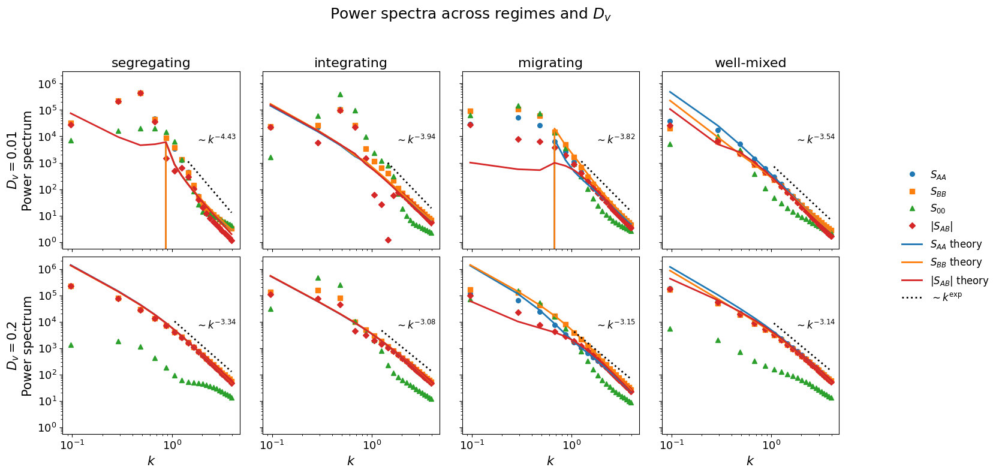

In [ ]:
#OLD: DO NOT RUN CELL!

from structure_factor import *
import numpy as np
import matplotlib.pyplot as plt

regimes = ["segregating", "integrating", "migrating", "well-mixed"]

kappas = [
    np.array([[0.6, -0.4], [-0.4, 0.6]]),
    np.array([[0.6,  1.0], [ 1.0, 0.6]]),
    np.array([[1.0,  1.0], [-1.0, 1.0]]),
    np.array([[0.6,  0.4], [ 0.6, 0.4]])
]

Dv_indices = [0, 19]

# Large-k cutoff
k_max_cutoff = 4

# Number of theory points to omit from display
theory_skip = 0

# ---------- styling for paper ----------
title_fs  = 16
label_fs  = 15
tick_fs   = 13
legend_fs = 12
text_fs   = 12

lw_th     = 2.0
lw_ref    = 2.0
ms        = 5.5

plt.rcParams.update({
    "font.size": tick_fs,
    "axes.labelsize": label_fs,
    "axes.titlesize": title_fs,
    "xtick.labelsize": tick_fs,
    "ytick.labelsize": tick_fs,
    "legend.fontsize": legend_fs,
})

# ---------- helper functions ----------
def fit_amplitude_logspace(theory, data):
    """
    Fit a multiplicative amplitude amp in log-space:
        log(data) ~ log(amp) + log(theory)
    """
    valid = (
        np.isfinite(theory) & np.isfinite(data) &
        (theory > 0) & (data > 0)
    )

    if not np.any(valid):
        return 1.0

    log_amp = np.mean(np.log(data[valid]) - np.log(theory[valid]))
    return np.exp(log_amp)


def get_k_mask(k_bins, k_max_cutoff=None):
    mask = (k_bins > 0)
    if k_max_cutoff is not None:
        mask &= (k_bins <= k_max_cutoff)
    return mask


def get_dynamic_fit_mask(k_bins, k_mask, power_spectra, G_AB, n_after_peak=2):
    """
    Start the fit 2 points after the maximum of the data envelope
    from S_AA, S_BB, and |S_AB|.
    """
    envelope = np.nanmax(
        np.vstack([
            np.where(k_mask, power_spectra[0], np.nan),
            np.where(k_mask, power_spectra[1], np.nan),
            np.where(k_mask, np.abs(G_AB), np.nan)
        ]),
        axis=0
    )

    if np.all(np.isnan(envelope)):
        idx_start = 1
    else:
        idx_start = np.nanargmax(envelope) + n_after_peak

    idx = np.arange(len(k_bins))
    fit_mask = k_mask & (idx >= idx_start)

    if np.sum(fit_mask) < 3:
        fit_mask = k_mask & (idx >= max(1, idx_start - n_after_peak))

    return fit_mask


def fit_power_law_tail(k, y, n_after_peak=2, min_points=4):
    """
    Fit a power law y ~ A * k^exp to the high-k tail of y.

    The fit starts 2 points after the maximum of y and uses the rest
    of the available k-range. The fit is done in log-log space:
        log(y) = log(A) + exp * log(k)

    Returns
    -------
    exp_fit : float
        Fitted exponent.
    A_fit : float
        Fitted prefactor.
    tail_mask : boolean array
        Mask of the points used in the fit, in the coordinates of k and y.
    """
    valid = np.isfinite(k) & np.isfinite(y) & (k > 0) & (y > 0)

    k_valid = k[valid]
    y_valid = y[valid]

    if len(k_valid) < min_points:
        return np.nan, np.nan, np.zeros_like(k, dtype=bool)

    peak_idx = np.argmax(y_valid)
    start_idx = peak_idx + n_after_peak

    if start_idx >= len(k_valid) - min_points:
        start_idx = max(0, len(k_valid) - min_points)

    k_tail = k_valid[start_idx:]
    y_tail = y_valid[start_idx:]

    if len(k_tail) < 2:
        return np.nan, np.nan, np.zeros_like(k, dtype=bool)

    coeffs = np.polyfit(np.log(k_tail), np.log(y_tail), 1)
    exp_fit = coeffs[0]
    logA_fit = coeffs[1]
    A_fit = np.exp(logA_fit)

    tail_mask = np.zeros_like(k, dtype=bool)
    valid_indices = np.where(valid)[0]
    tail_indices = valid_indices[start_idx:]
    tail_mask[tail_indices] = True

    return exp_fit, A_fit, tail_mask


def add_fitted_powerlaw_reference(ax, k, y, exp_fit, tail_mask, 
                                  vertical_shift=2.5, label=None):
    """
    Add a reference line y_ref ~ k^exp_fit over the tail region.
    The line is shifted upward by 'vertical_shift' to avoid overlap.
    """
    if np.isnan(exp_fit):
        return

    if np.sum(tail_mask) < 2:
        return

    k_tail = k[tail_mask]
    y_tail = y[tail_mask]

    valid = np.isfinite(k_tail) & np.isfinite(y_tail) & (k_tail > 0) & (y_tail > 0)
    k_tail = k_tail[valid]
    y_tail = y_tail[valid]

    if len(k_tail) < 2:
        return

    # Anchor the guide line near the first point of the fitted tail,
    # but place it somewhat above the data/theory.
    k0 = k_tail[0]
    y0 = vertical_shift * y_tail[0]

    y_ref = y0 * (k_tail / k0) ** exp_fit

    ax.plot(k_tail, y_ref, "k:", lw=lw_ref, label=label)


# ---------- figure ----------
fig, axes = plt.subplots(
    nrows=2,
    ncols=4,
    figsize=(16, 8),
    sharex=True,
    sharey=True
)

for row_idx, Dv_idx in enumerate(Dv_indices):

    Dv = Dv_space[Dv_idx]

    for regime_idx, regime in enumerate(regimes):

        ax = axes[row_idx, regime_idx]

        param_panel = param.copy()
        param_panel["kappa"] = kappas[regime_idx]
        param_panel["D_v"] = Dv

        power_spectra = PS_matrix[Dv_idx, regime_idx]
        G_AB = GAB_matrix[Dv_idx, regime_idx]

        # compute theory
        S_AA_theory = np.zeros(len(k_bins), dtype=complex)
        S_AB_theory = np.zeros(len(k_bins), dtype=complex)
        S_BB_theory = np.zeros(len(k_bins), dtype=complex)

        phi_A_mean = phi_run[0, averaging_bp:, :].mean()
        phi_B_mean = phi_run[1, averaging_bp:, :].mean()

        for i, k in enumerate(k_bins):
            structure_factors = structure_factor(
                k,
                phi_A_mean,
                phi_B_mean,
                param_panel
            )
            S_AA_theory[i] = structure_factors[0, 0]
            S_AB_theory[i] = structure_factors[0, 1]
            S_BB_theory[i] = structure_factors[1, 1]

        # masks
        k_mask = get_k_mask(k_bins, k_max_cutoff=k_max_cutoff)
        fit_mask = get_dynamic_fit_mask(
            k_bins, k_mask, power_spectra, G_AB, n_after_peak=2
        )

        # optionally also remove the first displayed theory points from the fit
        theory_indices_all = np.where(k_mask)[0]
        if len(theory_indices_all) > theory_skip:
            fit_mask[theory_indices_all[:theory_skip]] = False

        # log-space amplitude fit
        theory_fit = np.vstack([
            S_AA_theory[fit_mask].real,
            S_BB_theory[fit_mask].real,
            np.abs(S_AB_theory[fit_mask])
        ])

        data_fit = np.vstack([
            power_spectra[0, fit_mask],
            power_spectra[1, fit_mask],
            np.abs(G_AB[fit_mask])
        ])

        amp = fit_amplitude_logspace(theory_fit, data_fit)

        # plotting mask
        plot_mask = k_mask
        k_plot = k_bins[plot_mask]

        # theory display mask: skip first few displayed theory points
        theory_indices = np.where(plot_mask)[0]
        theory_plot_indices = theory_indices[theory_skip:]

        # ---------- DATA: markers only ----------
        ax.plot(
            k_plot, power_spectra[0, plot_mask],
            linestyle="None", marker="o", color="tab:blue",
            ms=ms, label=r"$S_{AA}$"
        )
        ax.plot(
            k_plot, power_spectra[1, plot_mask],
            linestyle="None", marker="s", color="tab:orange",
            ms=ms, label=r"$S_{BB}$"
        )
        ax.plot(
            k_plot, power_spectra[2, plot_mask],
            linestyle="None", marker="^", color="tab:green",
            ms=ms, label=r"$S_{00}$"
        )
        ax.plot(
            k_plot, np.abs(G_AB[plot_mask]),
            linestyle="None", marker="D", color="tab:red",
            ms=ms, label=r"$|S_{AB}|$"
        )

        # ---------- THEORY ----------
        ax.plot(
            k_bins[theory_plot_indices],
            amp * S_AA_theory[theory_plot_indices].real,
            "-", color="tab:blue", lw=lw_th, label=r"$S_{AA}$ theory"
        )
        ax.plot(
            k_bins[theory_plot_indices],
            amp * S_BB_theory[theory_plot_indices].real,
            "-", color="tab:orange", lw=lw_th, label=r"$S_{BB}$ theory"
        )
        ax.plot(
            k_bins[theory_plot_indices],
            np.abs(amp * S_AB_theory[theory_plot_indices]),
            "-", color="tab:red", lw=lw_th, label=r"$|S_{AB}|$ theory"
        )

        # ---------- fit S_AA tail exponent and add reference ----------
        SAA_plot = power_spectra[0, plot_mask]

        exp_fit, A_fit, tail_mask_local = fit_power_law_tail(
            k_plot, SAA_plot, n_after_peak=5, min_points=4
        )

        add_fitted_powerlaw_reference(
            ax,
            k_plot,
            SAA_plot,
            exp_fit,
            tail_mask_local,
            vertical_shift=2.5,
            label=r"$\sim k^{\mathrm{exp}}$" if (row_idx == 0 and regime_idx == 0) else None
        )

        # add text with fitted exponent
        if np.isfinite(exp_fit):
            exp_text = fr"$\sim k^{{{exp_fit:.2f}}}$"
        else:
            exp_text = r"$\sim k^{\mathrm{nan}}$"

        ax.text(
            0.75, 0.65,
            exp_text,
            transform=ax.transAxes,
            fontsize=text_fs,
            va="top",
            ha="left"
        )

        # axes formatting
        ax.set_xscale("log")
        ax.set_yscale("log")
        ax.set_box_aspect(1)

        if row_idx == 0:
            ax.set_title(regime)

        if regime_idx == 0:
            ax.set_ylabel(fr"$D_v = {param_panel['D_v']}$" + "\nPower spectrum")

        if row_idx == 1:
            ax.set_xlabel(r"$k$")

        ax.tick_params(axis='both', which='both', labelsize=tick_fs)

# global legend
handles, labels = axes[0, 0].get_legend_handles_labels()
fig.legend(
    handles, labels,
    loc="center right",
    bbox_to_anchor=(1.05, 0.5),
    frameon=False,
    fontsize=legend_fs
)

fig.suptitle("Power spectra across regimes and $D_v$", fontsize=title_fs + 2)

plt.tight_layout(rect=[0, 0, 0.9, 0.95])
plt.savefig("images/Schellin_Voter_PS.pdf")
plt.show()

In [5]:
#LOAD SWEEP CODE:
averaging_bp = -200
N = (2**7, 2**7)
L = (50,50)
Lx, Ly = L
sim_2d = fhd.fhd_2d(L,N, bc= 'periodic', fft=False)

Ta = 2/5
Tb = 2/5
kappa_aa = 1-Ta
kappa_bb = 1-Tb
kappa_ab = -Ta
kappa_ba = -Tb
nu = np.zeros((2,2,2))
# coupling matrix kappa  for pi^{(a)} = sum_b kappa_ab * (V * phi_b)
kappa = np.array([[kappa_aa, kappa_ab],
                  [kappa_ba, kappa_bb]])
D = 0.1*np.ones(2) # Schelling diffusion coefficient
Gamma = np.eye(2) # Utility nabla^3 term coefficient
D_v = 0.0 #Voter model diffusion term
beta = 10

param = {'D': D, 'kappa': kappa, 'Gamma': Gamma, 'nu': nu, 'D_v': D_v, 'beta': beta, 'noise_v' : 1, 'h': 0.1}

x = sim_2d.x
y = sim_2d.y

xx, yy = np.meshgrid(x, y, indexing='ij')
nspecies = sim_2d.nspecies
num_bins = 60

Dv_space = np.linspace(0.01,0.2,20)

regimes = ["segregating", "integrating", "migrating", "well-mixed"]
kappas = [np.array([[0.6, -0.4],[-0.4, 0.6]]), np.array([[0.6, 1], [1, 0.6]]),
np.array([[1, 1], [-1, 1]]), np.array([[0.6, 0.4], [0.6, 0.4]])]

H_indices = np.zeros((len(Dv_space),len(regimes)))
D_indices = np.zeros((len(Dv_space),len(regimes)))
Dkl_indices = np.zeros((len(Dv_space),len(regimes)))
Dkl_variance = np.zeros((len(Dv_space),len(regimes)))
kmeans = np.zeros((len(Dv_space),len(regimes)))
kpeaks = np.zeros((len(Dv_space),len(regimes)))
PS_matrix = np.zeros((len(Dv_space), len(regimes), 3, num_bins-1))
GAB_matrix = np.zeros((len(Dv_space), len(regimes), num_bins-1))

dt = 0.002
noise = True

def kmean(power_spectrum, k_bins):
    Z = np.sum(power_spectrum)
    kmean = np.sum(k_bins*power_spectrum)
    return kmean/Z


for i, Dv in enumerate(Dv_space):
    for r, regime in enumerate(regimes):
        phi_runs = []
        for n_run in range(10):
            try:    
                phi_run = np.load(f"data/{regime}/run_{n_run}_fluc_Dv{Dv:.2f}.npy")
                phi_runs.append(phi_run)
            except:
                print(f"Failed to load {regime} sweep run {n_run} for Dv = {Dv:.2f}")
                # phi_run = np.zeros((2,-averaging_bp+1)+N)
        phi_runs = np.array([phi_run[:,averaging_bp:] for phi_run in phi_runs])

        Dkl_list = [fhd.mean_relative_entropy(phi_runs[n_run,:,-t]) for t in range(-averaging_bp) for n_run in range(phi_runs.shape[0])]
        H_indices[i,r] = np.mean([fhd.entropy_index(phi_runs[n_run,:,-t]) for t in range(-averaging_bp) for n_run in range(phi_runs.shape[0])])
        D_indices[i,r] = np.mean([fhd.dissimilarity(phi_runs[n_run,:,-t]) for t in range(-averaging_bp) for n_run in range(phi_runs.shape[0])])
        Dkl_indices[i,r] = np.mean(Dkl_list)
        Dkl_variance[i,r] = np.var(Dkl_list)

        phi_runs = phi_runs.transpose((1,2,0,3,4))
        phi_runs = phi_runs.reshape((2, phi_runs.shape[1]*phi_runs.shape[2],)+N)
        k_bins, power_spectra, G_AB = fhd.power_spectrum(phi_runs, (Lx, Ly), num_bins=60, averaged = True,  centered = True)

        PS_matrix[i,r] = power_spectra
        GAB_matrix[i,r] = G_AB
        kmeans[i,r] = kmean(power_spectra[0]+power_spectra[1],k_bins)
        kpeaks[i,r] = k_bins[power_spectra[0].argmax()]


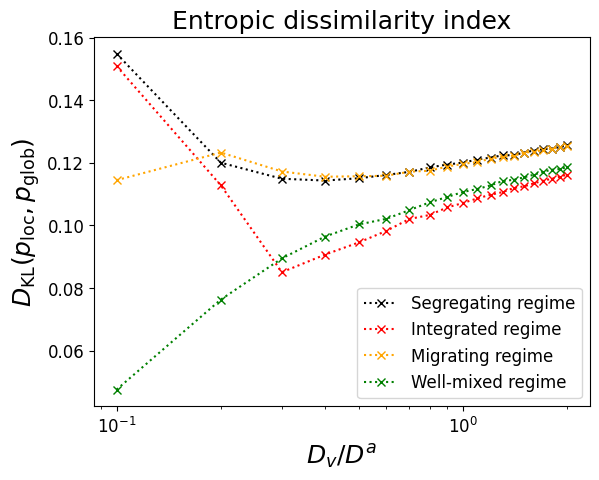

In [8]:
plt.semilogx(Dv_space/D[0], Dkl_indices[:,0], "x:k", label = "Segregating regime")
plt.semilogx(Dv_space/D[0], Dkl_indices[:,1], "x:r", label = "Integrated regime")
plt.semilogx(Dv_space/D[0], Dkl_indices[:,2], "x:", color= 'orange', label = "Migrating regime")
plt.semilogx(Dv_space/D[0], Dkl_indices[:,3], "x:g", label = "Well-mixed regime")
# plt.semilogx(D[0]/Dv_space, Dkl_indices_mig[:], "x:", color='orange', label = "Migrating regime")
plt.xlabel(r"$D_v/D^a$", size=18)
plt.ylabel(r"$D_{\rm KL}(p_{\rm loc}, p_{\rm glob})$", size=18)
plt.title(r"Entropic dissimilarity index", size=18)
plt.xticks(size=12)
plt.yticks(size=12)
plt.legend(fontsize=12)
plt.show()

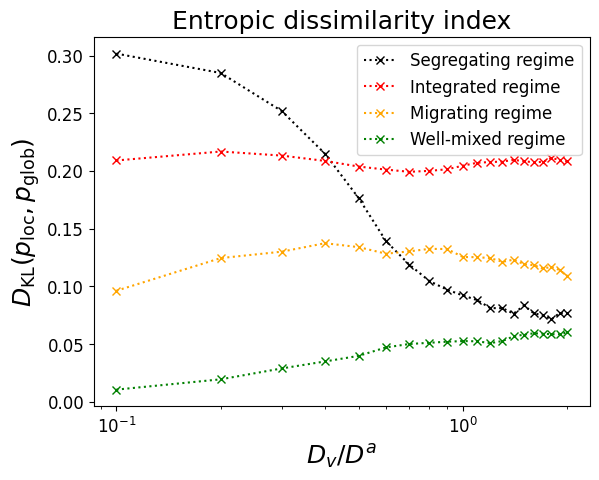

In [ ]:
# OLD PLOT DO NOT RUN CELL!!!

plt.semilogx(Dv_space/D[0], Dkl_indices[:,0], "x:k", label = "Segregating regime")
plt.semilogx(Dv_space/D[0], Dkl_indices[:,1], "x:r", label = "Integrated regime")
plt.semilogx(Dv_space/D[0], Dkl_indices[:,2], "x:", color= 'orange', label = "Migrating regime")
plt.semilogx(Dv_space/D[0], Dkl_indices[:,3], "x:g", label = "Well-mixed regime")
# plt.semilogx(D[0]/Dv_space, Dkl_indices_mig[:], "x:", color='orange', label = "Migrating regime")
plt.xlabel(r"$D_v/D^a$", size=18)
plt.ylabel(r"$D_{\rm KL}(p_{\rm loc}, p_{\rm glob})$", size=18)
plt.title(r"Entropic dissimilarity index", size=18)
plt.xticks(size=12)
plt.yticks(size=12)
plt.legend(fontsize=12)
plt.show()

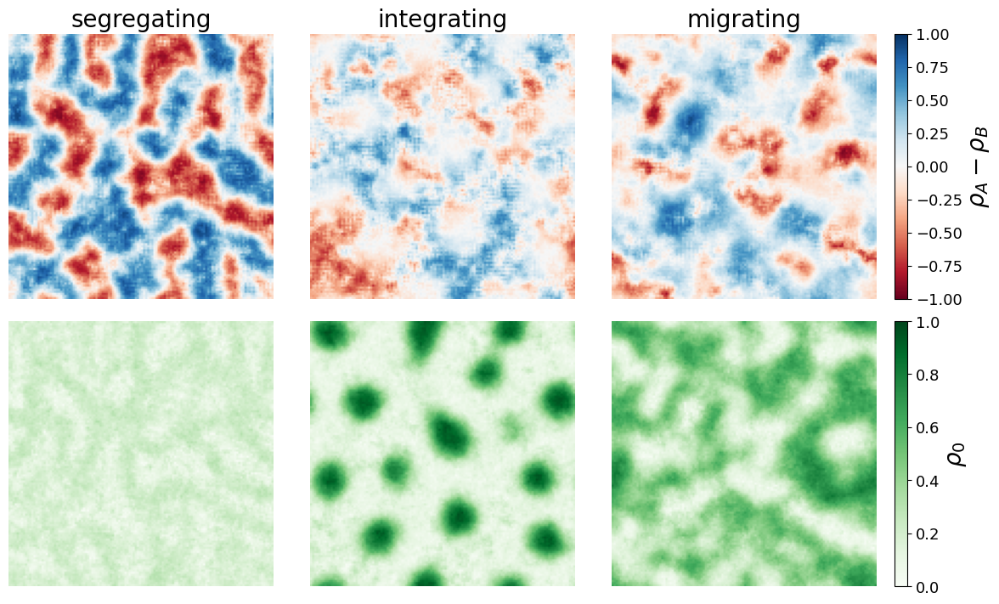

In [ ]:
run = 0
Dv = 0.01

regimes = ["segregating", "integrating", "migrating"]

fig, ax = plt.subplots(
    2, 3,
    figsize=(12, 7),
    constrained_layout=True
)

ims_top = []
ims_bottom = []

for i, regime in enumerate(regimes):
    phi_run = np.load(f"data/{regime}/run_{run}_fluc_Dv{Dv:.2f}.npy")

    phi_diff = phi_run[0] - phi_run[1]
    phi_0 = 1 - phi_run.sum(axis=0)

    im1 = ax[0, i].imshow(
        phi_diff[-1],
        cmap="RdBu",
        aspect="equal",
        origin="lower",
        extent=[-Lx/2, Lx/2, -Ly/2, Ly/2],
        vmin=-1,
        vmax=1
    )

    im2 = ax[1, i].imshow(
        phi_0[-1],
        cmap="Greens",
        aspect="equal",
        origin="lower",
        extent=[-Lx/2, Lx/2, -Ly/2, Ly/2],
        vmin=0,
        vmax=1
    )

    ax[0, i].axis("off")
    ax[1, i].axis("off")

    ax[0, i].set_title(regime, fontsize=20)

    ims_top.append(im1)
    ims_bottom.append(im2)

# One colorbar per row, aligned with all axes in that row
cbar1 = fig.colorbar(
    ims_top[-1],
    ax=ax[0, :],
    location="right",
    fraction=0.035,
    pad=0.02
)
cbar1.set_label(r"$\rho_A - \rho_B$", size=20)

cbar2 = fig.colorbar(
    ims_bottom[-1],
    ax=ax[1, :],
    location="right",
    fraction=0.035,
    pad=0.02
)
cbar2.set_label(r"$\rho_0$", size=20)
plt.savefig(f"images/schelling_phases_noise_Dv{Dv:.2f}.png")
plt.show()

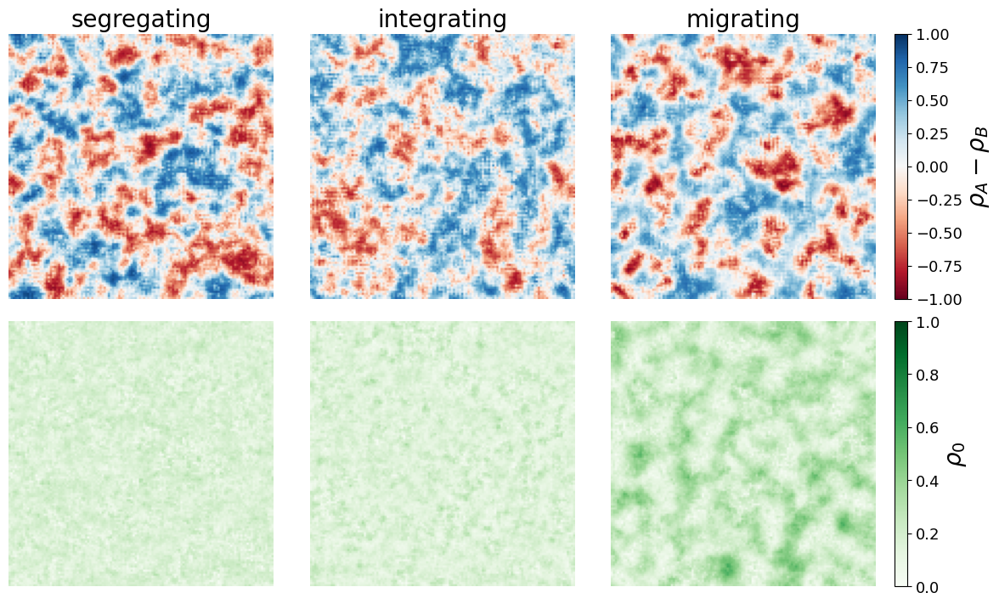

In [ ]:
# OLD PLOT DO NOT RUN CELL!!!

run = 0
Dv = 0.04

regimes = ["segregating", "integrating", "migrating"]

fig, ax = plt.subplots(
    2, 3,
    figsize=(12, 7),
    constrained_layout=True
)

ims_top = []
ims_bottom = []

for i, regime in enumerate(regimes):
    phi_run = np.load(f"data/{regime}/run_{run}_fluc_Dv{Dv:.2f}.npy")

    phi_diff = phi_run[0] - phi_run[1]
    phi_0 = 1 - phi_run.sum(axis=0)

    im1 = ax[0, i].imshow(
        phi_diff[-1],
        cmap="RdBu",
        aspect="equal",
        origin="lower",
        extent=[-Lx/2, Lx/2, -Ly/2, Ly/2],
        vmin=-1,
        vmax=1
    )

    im2 = ax[1, i].imshow(
        phi_0[-1],
        cmap="Greens",
        aspect="equal",
        origin="lower",
        extent=[-Lx/2, Lx/2, -Ly/2, Ly/2],
        vmin=0,
        vmax=1
    )

    ax[0, i].axis("off")
    ax[1, i].axis("off")

    ax[0, i].set_title(regime, fontsize=20)

    ims_top.append(im1)
    ims_bottom.append(im2)

# One colorbar per row, aligned with all axes in that row
cbar1 = fig.colorbar(
    ims_top[-1],
    ax=ax[0, :],
    location="right",
    fraction=0.035,
    pad=0.02
)
cbar1.set_label(r"$\rho_A - \rho_B$", size=20)

cbar2 = fig.colorbar(
    ims_bottom[-1],
    ax=ax[1, :],
    location="right",
    fraction=0.035,
    pad=0.02
)
cbar2.set_label(r"$\rho_0$", size=20)

plt.show()

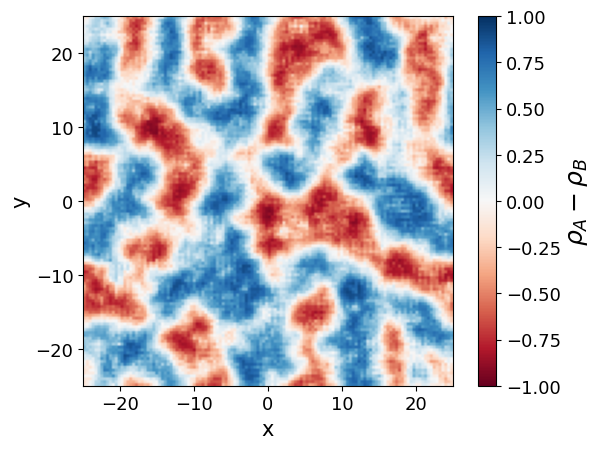

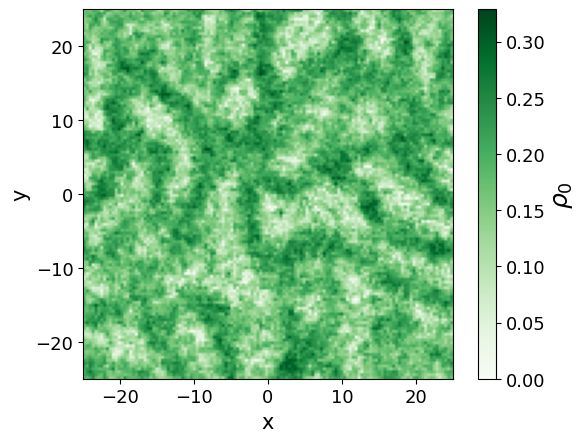

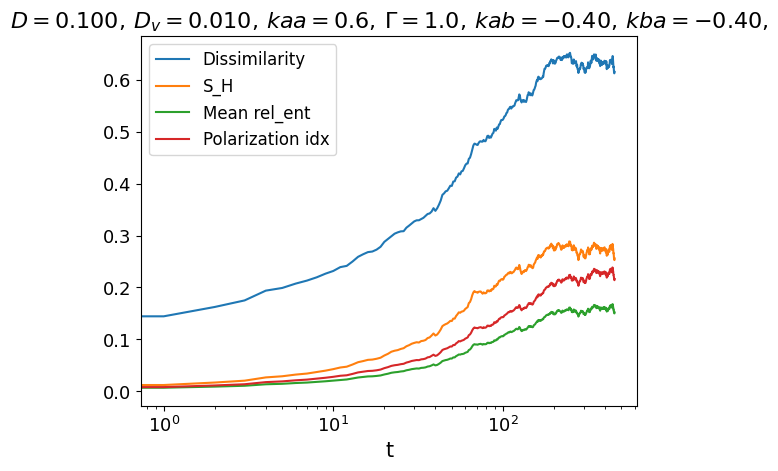

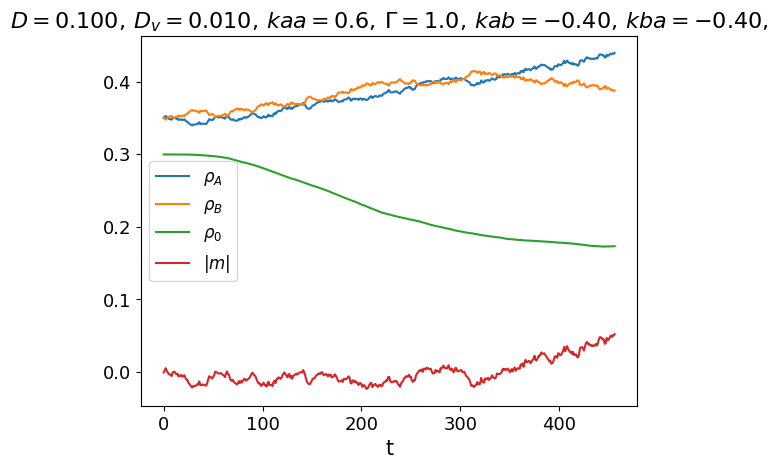

In [15]:
# p1_vals = np.arange(-1.0, 1.0001, 0.1)
# p2_vals = np.arange(-1.0, 1.0001, 0.1)
# D_v = 0.1
# D_idx = 20
# Dv_idx = 10

regime = "segregating"
run = 0
Dv = 0.01
# phi_run = np.load(f"data/bifurcation_run/run_MIG_D{D[0]:.2f}_Dv{Dv:.2f}_fwd.npy")
phi_run = np.load(f"data/{regime}/run_{run}_fluc_Dv{Dv:.2f}.npy")

# phi_run = np.load(f"data/{sweep}/run_kdiag06_Dv_{str(D_v)[0]+str(D_v)[2:]}_kab{kappa_ab:.2f}_kba{kappa_ba:.2f}.npy")

# phi_run = np.load(f"data/sweep2/run_kdiag06_Dv_0001_kab{kab:.2f}_kba_{kba:.2f}.npy")
frames = phi_run.shape[1]-1
nsteps = 500*frames
theta = 2/5
Lx, Ly = 50, 50


title = fr"$D = {D[0]:.3f},\, D_v = {Dv:.3f},\, kaa = {kappa_aa:.1f},\, \Gamma = { Gamma[0,0]},\, kab = {kappa_ab:.2f}, \, kba = {kappa_ba:.2f}, $"
phi_diff = phi_run[ 0] - phi_run[1]
# t = np.linspace(0,dt*nsteps, plot_every+1)
im =plt.imshow(phi_diff[-1], cmap = 'RdBu', aspect='equal', origin='lower', extent=[-Lx/2,Lx/2,-Ly/2,Ly/2], vmin=-1, vmax=1)
# plt.title(title)
plt.xlabel("x")
plt.ylabel("y")
cbar = plt.colorbar(im, fraction=0.046)
cbar.set_label(r"$\rho_A - \rho_B$",size=18)
# plt.savefig("fhd_plots/integrating_tanh_noisy_reactions.pdf")
plt.show()

phi0 = 1 -  phi_run[ 0] - phi_run[1]
# t = np.linspace(0,dt*nsteps, plot_every+1)
im =plt.imshow(phi0[-1], cmap = 'Greens', aspect='equal', origin='lower', extent=[-Lx/2,Lx/2,-Ly/2,Ly/2])
# plt.title(title)
plt.xlabel("x")
plt.ylabel("y")
cbar = plt.colorbar(im, fraction=0.046)
cbar.set_label(r"$\rho_0$",size=18)
# plt.savefig("fhd_plots/integrating_tanh_noisy_reactions.pdf")
plt.show()

def polarization_index(phi):
    mu = phi[0]-phi[1]
    # rho0 = 1- phi.sum(axis=0)
    return np.var(mu)

Rel_ent = np.array([fhd.mean_relative_entropy(phi_run[:,t]) for t in range(frames+1)])
Dis_idx = np.array([fhd.dissimilarity(phi_run[:,t]) for t in range(frames+1)])
Q_unhappy = np.array([fhd.fraction_unhappy(theta, phi_run[:,t]) for t in range(frames+1)])
pol_idx = np.array([polarization_index(phi_run[:,t]) for t in range(frames+1)])
S_H = np.array([fhd.entropy_index(phi_run[:,t]) for t in range(frames + 1)])

t = np.linspace(0, dt*nsteps, frames+1)
plt.plot(t,Dis_idx, label = "Dissimilarity")
plt.plot(t,S_H, label = "S_H")
plt.plot(t,Rel_ent,  label = "Mean rel_ent")
plt.plot(t,pol_idx, label = "Polarization idx")
plt.title(title)
# plt.yscale('log')
plt.xscale("log")
plt.xlabel("t")
plt.legend()
plt.show()

phi0_tot = np.mean(1-  phi_run.sum(axis=0), axis = (1,2))
rhoA = phi_run[0].mean(axis=(1,2))
rhoB = phi_run[1].mean(axis=(1,2))
t = np.linspace(0, dt*nsteps, frames+1)

plt.plot(t,rhoA, label = r"$\rho_A$")
plt.plot(t,rhoB, label = r"$\rho_B$")
plt.plot(t,phi0_tot, label = r"$\rho_0$")
plt.plot(t,rhoA - rhoB, label = r"$|m|$")
plt.title(title)
plt.xlabel("t")
plt.legend()
plt.show()

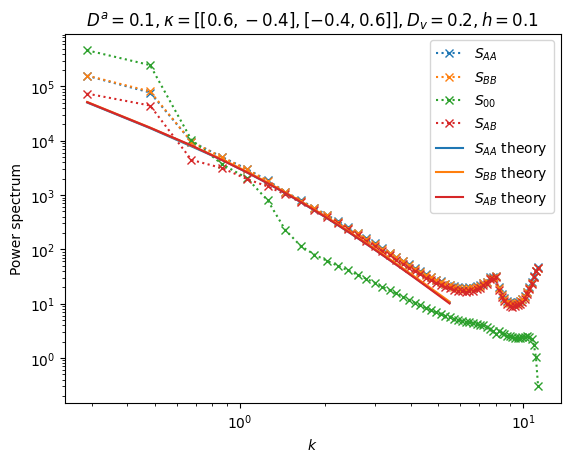

In [21]:
from structure_factor import *
from scipy.optimize import minimize

# averaging_bp = -200
# k_bins, power_spectra, G_AB = fhd.power_spectrum(phi_run, (Lx, Ly), num_bins=60, bp = averaging_bp, centered = True)
# param['h'] = 0.1
# # param['D_v'] = 0.1
regimes = ["segregating", "integrating", "migrating", "well-mixed"]
# regimes = ["migrating", "well-mixed"]
kappas = [np.array([[0.6, -0.4],[-0.4, 0.6]]), np.array([[0.6, 1], [1, 0.6]]),
np.array([[1, 1], [-1, 1]]), np.array([[0.6, 0.4], [0.6, 0.4]])]

regime_idx = 1
Dv_idx = 19
Dv = Dv_space[Dv_idx]

if regimes[regime_idx] == "segregating":
    param['kappa'] = kappas[0]
elif regimes[regime_idx] == "integrating":
    param['kappa'] = kappas[1]
elif regimes[regime_idx] == "migrating":
    param['kappa'] = kappas[2]
elif regimes[regime_idx] == "well-mixed":
    param['kappa'] = kappas[3]

power_spectra, G_AB = PS_matrix[Dv_idx, regime_idx], GAB_matrix[Dv_idx, regime_idx]


# param["D"] = D*np.ones(2)
param["D_v"] = Dv

S_AA_theory = np.zeros(len(k_bins))
S_AB_theory = np.zeros(len(k_bins))
S_BB_theory = np.zeros(len(k_bins))

for i, k in enumerate(k_bins):
    structure_factors = structure_factor(k,phi_run[0,averaging_bp:,:].mean(), phi_run[1,averaging_bp:,:].mean(), param)
    S_AA_theory[i] = structure_factors[0,0]
    S_AB_theory[i] = structure_factors[0,1]
    S_BB_theory[i] = structure_factors[1,1]

amp = 4000
theory_bp = 5
theory_ep = -30
k_bins_thy = k_bins[theory_bp: theory_ep]

def std_amp(amp, theory, data):
    AA = np.abs(amp*theory[0] - data[0])
    BB = np.abs(amp*theory[1] - data[1])
    AB = np.abs(amp*theory[2] - data[2])
    return np.std(np.array([AA,BB,AB]))

theory = np.array([S_AA_theory[theory_bp:theory_ep], S_BB_theory[theory_bp:theory_ep], np.abs(S_AB_theory[theory_bp:theory_ep])])
data = np.array([power_spectra[0,theory_bp:theory_ep],power_spectra[1,theory_bp:theory_ep], np.abs(G_AB[theory_bp:theory_ep])])
optamp = minimize(std_amp, amp, args = (theory, data))

# dk = k_bins[1]-k_bins[0]

amp=optamp.x
# amp = 1
plt.plot(k_bins[1:], power_spectra[0,1:], "x:", label = r"$S_{AA}$", color = 'tab:blue')
# plt.plot(k_max_AA, interpolate_func(k_max_AA), marker = "*", color = 'k')
plt.plot(k_bins[1:], power_spectra[1,1:], "x:", label = r"$S_{BB}$", color = 'tab:orange')
plt.plot(k_bins[1:], power_spectra[2,1:], "x:", label = r"$S_{00}$", color = 'tab:green')
plt.plot(k_bins[1:], np.abs(G_AB)[1:], "x:", label = r"$S_{AB}$", color = 'tab:red')
plt.plot(k_bins[1:theory_ep], amp*S_AA_theory[1:theory_ep].real, '-', label = r"$S_{AA}$ theory",  color = 'tab:blue')
plt.plot(k_bins[1:theory_ep], amp*S_BB_theory[1:theory_ep].real, '-', label = r"$S_{BB}$ theory", color = 'tab:orange')
plt.plot(k_bins[1:theory_ep], -amp*S_AB_theory[1:theory_ep], '-', label = r"$S_{AB}$ theory", color = 'tab:red')
plt.title(fr"$D^a = {param['D'][0]},  \kappa = [[{kappa_aa:.1f},{kappa_ab:.1f}],[{kappa_ba:.1f},{kappa_bb:.1f}]], D_v = {param['D_v']}, h = {param['h']}$")
plt.xscale('log')
plt.yscale('log')
plt.xlabel(r"$k$")
plt.ylabel(r"Power spectrum")
plt.legend()
plt.tight_layout
plt.show()

/tmp/ipykernel_3361501/2497327470.py:72: RuntimeWarning: All-NaN slice encountered
  envelope = np.nanmax(


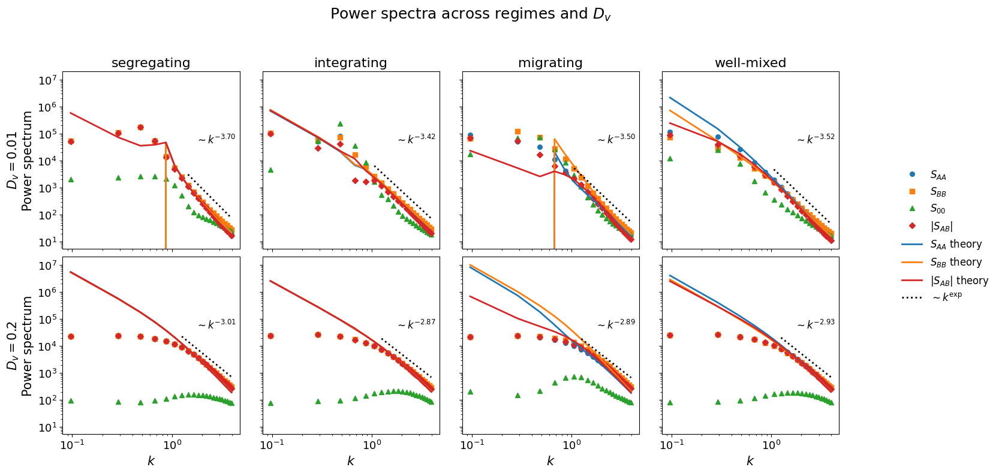

In [7]:
from structure_factor import *
import numpy as np
import matplotlib.pyplot as plt

regimes = ["segregating", "integrating", "migrating", "well-mixed"]

kappas = [
    np.array([[0.6, -0.4], [-0.4, 0.6]]),
    np.array([[0.6,  1.0], [ 1.0, 0.6]]),
    np.array([[1.0,  1.0], [-1.0, 1.0]]),
    np.array([[0.6,  0.4], [ 0.6, 0.4]])
]

Dv_indices = [0, 19]

# Large-k cutoff
k_max_cutoff = 4

# Number of theory points to omit from display
theory_skip = 0

# ---------- styling for paper ----------
title_fs  = 16
label_fs  = 15
tick_fs   = 13
legend_fs = 12
text_fs   = 12

lw_th     = 2.0
lw_ref    = 2.0
ms        = 5.5

plt.rcParams.update({
    "font.size": tick_fs,
    "axes.labelsize": label_fs,
    "axes.titlesize": title_fs,
    "xtick.labelsize": tick_fs,
    "ytick.labelsize": tick_fs,
    "legend.fontsize": legend_fs,
})

# ---------- helper functions ----------
def fit_amplitude_logspace(theory, data):
    """
    Fit a multiplicative amplitude amp in log-space:
        log(data) ~ log(amp) + log(theory)
    """
    valid = (
        np.isfinite(theory) & np.isfinite(data) &
        (theory > 0) & (data > 0)
    )

    if not np.any(valid):
        return 1.0

    log_amp = np.mean(np.log(data[valid]) - np.log(theory[valid]))
    return np.exp(log_amp)


def get_k_mask(k_bins, k_max_cutoff=None):
    mask = (k_bins > 0)
    if k_max_cutoff is not None:
        mask &= (k_bins <= k_max_cutoff)
    return mask


def get_dynamic_fit_mask(k_bins, k_mask, power_spectra, G_AB, n_after_peak=2):
    """
    Start the fit 2 points after the maximum of the data envelope
    from S_AA, S_BB, and |S_AB|.
    """
    envelope = np.nanmax(
        np.vstack([
            np.where(k_mask, power_spectra[0], np.nan),
            np.where(k_mask, power_spectra[1], np.nan),
            np.where(k_mask, np.abs(G_AB), np.nan)
        ]),
        axis=0
    )

    if np.all(np.isnan(envelope)):
        idx_start = 1
    else:
        idx_start = np.nanargmax(envelope) + n_after_peak

    idx = np.arange(len(k_bins))
    fit_mask = k_mask & (idx >= idx_start)

    if np.sum(fit_mask) < 3:
        fit_mask = k_mask & (idx >= max(1, idx_start - n_after_peak))

    return fit_mask


def fit_power_law_tail(k, y, n_after_peak=2, min_points=4):
    """
    Fit a power law y ~ A * k^exp to the high-k tail of y.

    The fit starts 2 points after the maximum of y and uses the rest
    of the available k-range. The fit is done in log-log space:
        log(y) = log(A) + exp * log(k)

    Returns
    -------
    exp_fit : float
        Fitted exponent.
    A_fit : float
        Fitted prefactor.
    tail_mask : boolean array
        Mask of the points used in the fit, in the coordinates of k and y.
    """
    valid = np.isfinite(k) & np.isfinite(y) & (k > 0) & (y > 0)

    k_valid = k[valid]
    y_valid = y[valid]

    if len(k_valid) < min_points:
        return np.nan, np.nan, np.zeros_like(k, dtype=bool)

    peak_idx = np.argmax(y_valid)
    start_idx = peak_idx + n_after_peak

    if start_idx >= len(k_valid) - min_points:
        start_idx = max(0, len(k_valid) - min_points)

    k_tail = k_valid[start_idx:]
    y_tail = y_valid[start_idx:]

    if len(k_tail) < 2:
        return np.nan, np.nan, np.zeros_like(k, dtype=bool)

    coeffs = np.polyfit(np.log(k_tail), np.log(y_tail), 1)
    exp_fit = coeffs[0]
    logA_fit = coeffs[1]
    A_fit = np.exp(logA_fit)

    tail_mask = np.zeros_like(k, dtype=bool)
    valid_indices = np.where(valid)[0]
    tail_indices = valid_indices[start_idx:]
    tail_mask[tail_indices] = True

    return exp_fit, A_fit, tail_mask


def add_fitted_powerlaw_reference(ax, k, y, exp_fit, tail_mask, 
                                  vertical_shift=2.5, label=None):
    """
    Add a reference line y_ref ~ k^exp_fit over the tail region.
    The line is shifted upward by 'vertical_shift' to avoid overlap.
    """
    if np.isnan(exp_fit):
        return

    if np.sum(tail_mask) < 2:
        return

    k_tail = k[tail_mask]
    y_tail = y[tail_mask]

    valid = np.isfinite(k_tail) & np.isfinite(y_tail) & (k_tail > 0) & (y_tail > 0)
    k_tail = k_tail[valid]
    y_tail = y_tail[valid]

    if len(k_tail) < 2:
        return

    # Anchor the guide line near the first point of the fitted tail,
    # but place it somewhat above the data/theory.
    k0 = k_tail[0]
    y0 = vertical_shift * y_tail[0]

    y_ref = y0 * (k_tail / k0) ** exp_fit

    ax.plot(k_tail, y_ref, "k:", lw=lw_ref, label=label)


# ---------- figure ----------
fig, axes = plt.subplots(
    nrows=2,
    ncols=4,
    figsize=(16, 8),
    sharex=True,
    sharey=True
)

for row_idx, Dv_idx in enumerate(Dv_indices):

    Dv = Dv_space[Dv_idx]

    for regime_idx, regime in enumerate(regimes):

        ax = axes[row_idx, regime_idx]

        param_panel = param.copy()
        param_panel["kappa"] = kappas[regime_idx]
        param_panel["D_v"] = Dv

        power_spectra = PS_matrix[Dv_idx, regime_idx]
        G_AB = GAB_matrix[Dv_idx, regime_idx]

        # compute theory
        S_AA_theory = np.zeros(len(k_bins), dtype=complex)
        S_AB_theory = np.zeros(len(k_bins), dtype=complex)
        S_BB_theory = np.zeros(len(k_bins), dtype=complex)

        phi_A_mean = phi_run[0, averaging_bp:, :].mean()
        phi_B_mean = phi_run[1, averaging_bp:, :].mean()

        for i, k in enumerate(k_bins):
            structure_factors = structure_factor(
                k,
                phi_A_mean,
                phi_B_mean,
                param_panel
            )
            S_AA_theory[i] = structure_factors[0, 0]
            S_AB_theory[i] = structure_factors[0, 1]
            S_BB_theory[i] = structure_factors[1, 1]

        # masks
        k_mask = get_k_mask(k_bins, k_max_cutoff=k_max_cutoff)
        fit_mask = get_dynamic_fit_mask(
            k_bins, k_mask, power_spectra, G_AB, n_after_peak=2
        )

        # optionally also remove the first displayed theory points from the fit
        theory_indices_all = np.where(k_mask)[0]
        if len(theory_indices_all) > theory_skip:
            fit_mask[theory_indices_all[:theory_skip]] = False

        # log-space amplitude fit
        theory_fit = np.vstack([
            S_AA_theory[fit_mask].real,
            S_BB_theory[fit_mask].real,
            np.abs(S_AB_theory[fit_mask])
        ])

        data_fit = np.vstack([
            power_spectra[0, fit_mask],
            power_spectra[1, fit_mask],
            np.abs(G_AB[fit_mask])
        ])

        amp = fit_amplitude_logspace(theory_fit, data_fit)

        # plotting mask
        plot_mask = k_mask
        k_plot = k_bins[plot_mask]

        # theory display mask: skip first few displayed theory points
        theory_indices = np.where(plot_mask)[0]
        theory_plot_indices = theory_indices[theory_skip:]

        # ---------- DATA: markers only ----------
        ax.plot(
            k_plot, power_spectra[0, plot_mask],
            linestyle="None", marker="o", color="tab:blue",
            ms=ms, label=r"$S_{AA}$"
        )
        ax.plot(
            k_plot, power_spectra[1, plot_mask],
            linestyle="None", marker="s", color="tab:orange",
            ms=ms, label=r"$S_{BB}$"
        )
        ax.plot(
            k_plot, power_spectra[2, plot_mask],
            linestyle="None", marker="^", color="tab:green",
            ms=ms, label=r"$S_{00}$"
        )
        ax.plot(
            k_plot, np.abs(G_AB[plot_mask]),
            linestyle="None", marker="D", color="tab:red",
            ms=ms, label=r"$|S_{AB}|$"
        )

        # ---------- THEORY ----------
        ax.plot(
            k_bins[theory_plot_indices],
            amp * S_AA_theory[theory_plot_indices].real,
            "-", color="tab:blue", lw=lw_th, label=r"$S_{AA}$ theory"
        )
        ax.plot(
            k_bins[theory_plot_indices],
            amp * S_BB_theory[theory_plot_indices].real,
            "-", color="tab:orange", lw=lw_th, label=r"$S_{BB}$ theory"
        )
        ax.plot(
            k_bins[theory_plot_indices],
            np.abs(amp * S_AB_theory[theory_plot_indices]),
            "-", color="tab:red", lw=lw_th, label=r"$|S_{AB}|$ theory"
        )

        # ---------- fit S_AA tail exponent and add reference ----------
        SAA_plot = power_spectra[0, plot_mask]

        exp_fit, A_fit, tail_mask_local = fit_power_law_tail(
            k_plot, SAA_plot, n_after_peak=5, min_points=4
        )

        add_fitted_powerlaw_reference(
            ax,
            k_plot,
            SAA_plot,
            exp_fit,
            tail_mask_local,
            vertical_shift=2.5,
            label=r"$\sim k^{\mathrm{exp}}$" if (row_idx == 0 and regime_idx == 0) else None
        )

        # add text with fitted exponent
        if np.isfinite(exp_fit):
            exp_text = fr"$\sim k^{{{exp_fit:.2f}}}$"
        else:
            exp_text = r"$\sim k^{\mathrm{nan}}$"

        ax.text(
            0.75, 0.65,
            exp_text,
            transform=ax.transAxes,
            fontsize=text_fs,
            va="top",
            ha="left"
        )

        # axes formatting
        ax.set_xscale("log")
        ax.set_yscale("log")
        ax.set_box_aspect(1)

        if row_idx == 0:
            ax.set_title(regime)

        if regime_idx == 0:
            ax.set_ylabel(fr"$D_v = {param_panel['D_v']}$" + "\nPower spectrum")

        if row_idx == 1:
            ax.set_xlabel(r"$k$")

        ax.tick_params(axis='both', which='both', labelsize=tick_fs)

# global legend
handles, labels = axes[0, 0].get_legend_handles_labels()
fig.legend(
    handles, labels,
    loc="center right",
    bbox_to_anchor=(1.05, 0.5),
    frameon=False,
    fontsize=legend_fs
)

fig.suptitle("Power spectra across regimes and $D_v$", fontsize=title_fs + 2)

plt.tight_layout(rect=[0, 0, 0.9, 0.95])
plt.savefig("images/Schellin_Voter_PS.pdf")
plt.show()

/tmp/ipykernel_3693246/2497327470.py:72: RuntimeWarning: All-NaN slice encountered
  envelope = np.nanmax(


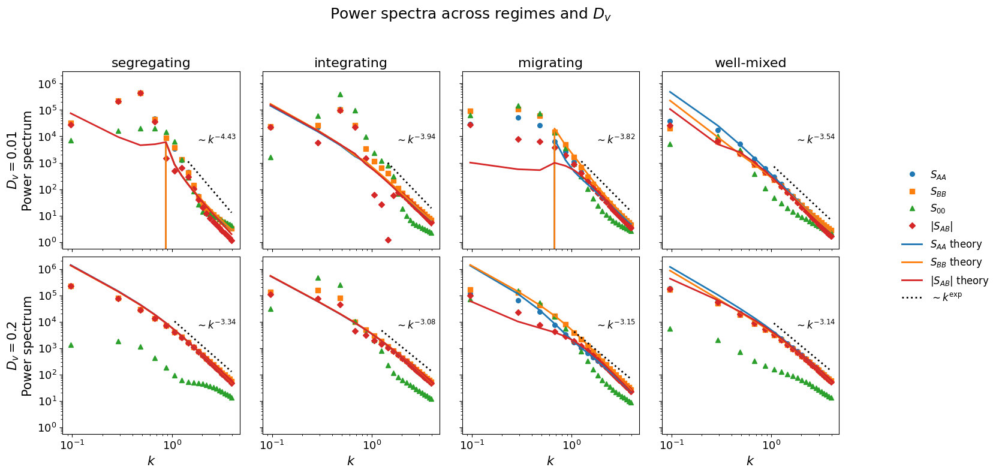

In [ ]:
#OLD: DO NOT RUN CELL!

from structure_factor import *
import numpy as np
import matplotlib.pyplot as plt

regimes = ["segregating", "integrating", "migrating", "well-mixed"]

kappas = [
    np.array([[0.6, -0.4], [-0.4, 0.6]]),
    np.array([[0.6,  1.0], [ 1.0, 0.6]]),
    np.array([[1.0,  1.0], [-1.0, 1.0]]),
    np.array([[0.6,  0.4], [ 0.6, 0.4]])
]

Dv_indices = [0, 19]

# Large-k cutoff
k_max_cutoff = 4

# Number of theory points to omit from display
theory_skip = 0

# ---------- styling for paper ----------
title_fs  = 16
label_fs  = 15
tick_fs   = 13
legend_fs = 12
text_fs   = 12

lw_th     = 2.0
lw_ref    = 2.0
ms        = 5.5

plt.rcParams.update({
    "font.size": tick_fs,
    "axes.labelsize": label_fs,
    "axes.titlesize": title_fs,
    "xtick.labelsize": tick_fs,
    "ytick.labelsize": tick_fs,
    "legend.fontsize": legend_fs,
})

# ---------- helper functions ----------
def fit_amplitude_logspace(theory, data):
    """
    Fit a multiplicative amplitude amp in log-space:
        log(data) ~ log(amp) + log(theory)
    """
    valid = (
        np.isfinite(theory) & np.isfinite(data) &
        (theory > 0) & (data > 0)
    )

    if not np.any(valid):
        return 1.0

    log_amp = np.mean(np.log(data[valid]) - np.log(theory[valid]))
    return np.exp(log_amp)


def get_k_mask(k_bins, k_max_cutoff=None):
    mask = (k_bins > 0)
    if k_max_cutoff is not None:
        mask &= (k_bins <= k_max_cutoff)
    return mask


def get_dynamic_fit_mask(k_bins, k_mask, power_spectra, G_AB, n_after_peak=2):
    """
    Start the fit 2 points after the maximum of the data envelope
    from S_AA, S_BB, and |S_AB|.
    """
    envelope = np.nanmax(
        np.vstack([
            np.where(k_mask, power_spectra[0], np.nan),
            np.where(k_mask, power_spectra[1], np.nan),
            np.where(k_mask, np.abs(G_AB), np.nan)
        ]),
        axis=0
    )

    if np.all(np.isnan(envelope)):
        idx_start = 1
    else:
        idx_start = np.nanargmax(envelope) + n_after_peak

    idx = np.arange(len(k_bins))
    fit_mask = k_mask & (idx >= idx_start)

    if np.sum(fit_mask) < 3:
        fit_mask = k_mask & (idx >= max(1, idx_start - n_after_peak))

    return fit_mask


def fit_power_law_tail(k, y, n_after_peak=2, min_points=4):
    """
    Fit a power law y ~ A * k^exp to the high-k tail of y.

    The fit starts 2 points after the maximum of y and uses the rest
    of the available k-range. The fit is done in log-log space:
        log(y) = log(A) + exp * log(k)

    Returns
    -------
    exp_fit : float
        Fitted exponent.
    A_fit : float
        Fitted prefactor.
    tail_mask : boolean array
        Mask of the points used in the fit, in the coordinates of k and y.
    """
    valid = np.isfinite(k) & np.isfinite(y) & (k > 0) & (y > 0)

    k_valid = k[valid]
    y_valid = y[valid]

    if len(k_valid) < min_points:
        return np.nan, np.nan, np.zeros_like(k, dtype=bool)

    peak_idx = np.argmax(y_valid)
    start_idx = peak_idx + n_after_peak

    if start_idx >= len(k_valid) - min_points:
        start_idx = max(0, len(k_valid) - min_points)

    k_tail = k_valid[start_idx:]
    y_tail = y_valid[start_idx:]

    if len(k_tail) < 2:
        return np.nan, np.nan, np.zeros_like(k, dtype=bool)

    coeffs = np.polyfit(np.log(k_tail), np.log(y_tail), 1)
    exp_fit = coeffs[0]
    logA_fit = coeffs[1]
    A_fit = np.exp(logA_fit)

    tail_mask = np.zeros_like(k, dtype=bool)
    valid_indices = np.where(valid)[0]
    tail_indices = valid_indices[start_idx:]
    tail_mask[tail_indices] = True

    return exp_fit, A_fit, tail_mask


def add_fitted_powerlaw_reference(ax, k, y, exp_fit, tail_mask, 
                                  vertical_shift=2.5, label=None):
    """
    Add a reference line y_ref ~ k^exp_fit over the tail region.
    The line is shifted upward by 'vertical_shift' to avoid overlap.
    """
    if np.isnan(exp_fit):
        return

    if np.sum(tail_mask) < 2:
        return

    k_tail = k[tail_mask]
    y_tail = y[tail_mask]

    valid = np.isfinite(k_tail) & np.isfinite(y_tail) & (k_tail > 0) & (y_tail > 0)
    k_tail = k_tail[valid]
    y_tail = y_tail[valid]

    if len(k_tail) < 2:
        return

    # Anchor the guide line near the first point of the fitted tail,
    # but place it somewhat above the data/theory.
    k0 = k_tail[0]
    y0 = vertical_shift * y_tail[0]

    y_ref = y0 * (k_tail / k0) ** exp_fit

    ax.plot(k_tail, y_ref, "k:", lw=lw_ref, label=label)


# ---------- figure ----------
fig, axes = plt.subplots(
    nrows=2,
    ncols=4,
    figsize=(16, 8),
    sharex=True,
    sharey=True
)

for row_idx, Dv_idx in enumerate(Dv_indices):

    Dv = Dv_space[Dv_idx]

    for regime_idx, regime in enumerate(regimes):

        ax = axes[row_idx, regime_idx]

        param_panel = param.copy()
        param_panel["kappa"] = kappas[regime_idx]
        param_panel["D_v"] = Dv

        power_spectra = PS_matrix[Dv_idx, regime_idx]
        G_AB = GAB_matrix[Dv_idx, regime_idx]

        # compute theory
        S_AA_theory = np.zeros(len(k_bins), dtype=complex)
        S_AB_theory = np.zeros(len(k_bins), dtype=complex)
        S_BB_theory = np.zeros(len(k_bins), dtype=complex)

        phi_A_mean = phi_run[0, averaging_bp:, :].mean()
        phi_B_mean = phi_run[1, averaging_bp:, :].mean()

        for i, k in enumerate(k_bins):
            structure_factors = structure_factor(
                k,
                phi_A_mean,
                phi_B_mean,
                param_panel
            )
            S_AA_theory[i] = structure_factors[0, 0]
            S_AB_theory[i] = structure_factors[0, 1]
            S_BB_theory[i] = structure_factors[1, 1]

        # masks
        k_mask = get_k_mask(k_bins, k_max_cutoff=k_max_cutoff)
        fit_mask = get_dynamic_fit_mask(
            k_bins, k_mask, power_spectra, G_AB, n_after_peak=2
        )

        # optionally also remove the first displayed theory points from the fit
        theory_indices_all = np.where(k_mask)[0]
        if len(theory_indices_all) > theory_skip:
            fit_mask[theory_indices_all[:theory_skip]] = False

        # log-space amplitude fit
        theory_fit = np.vstack([
            S_AA_theory[fit_mask].real,
            S_BB_theory[fit_mask].real,
            np.abs(S_AB_theory[fit_mask])
        ])

        data_fit = np.vstack([
            power_spectra[0, fit_mask],
            power_spectra[1, fit_mask],
            np.abs(G_AB[fit_mask])
        ])

        amp = fit_amplitude_logspace(theory_fit, data_fit)

        # plotting mask
        plot_mask = k_mask
        k_plot = k_bins[plot_mask]

        # theory display mask: skip first few displayed theory points
        theory_indices = np.where(plot_mask)[0]
        theory_plot_indices = theory_indices[theory_skip:]

        # ---------- DATA: markers only ----------
        ax.plot(
            k_plot, power_spectra[0, plot_mask],
            linestyle="None", marker="o", color="tab:blue",
            ms=ms, label=r"$S_{AA}$"
        )
        ax.plot(
            k_plot, power_spectra[1, plot_mask],
            linestyle="None", marker="s", color="tab:orange",
            ms=ms, label=r"$S_{BB}$"
        )
        ax.plot(
            k_plot, power_spectra[2, plot_mask],
            linestyle="None", marker="^", color="tab:green",
            ms=ms, label=r"$S_{00}$"
        )
        ax.plot(
            k_plot, np.abs(G_AB[plot_mask]),
            linestyle="None", marker="D", color="tab:red",
            ms=ms, label=r"$|S_{AB}|$"
        )

        # ---------- THEORY ----------
        ax.plot(
            k_bins[theory_plot_indices],
            amp * S_AA_theory[theory_plot_indices].real,
            "-", color="tab:blue", lw=lw_th, label=r"$S_{AA}$ theory"
        )
        ax.plot(
            k_bins[theory_plot_indices],
            amp * S_BB_theory[theory_plot_indices].real,
            "-", color="tab:orange", lw=lw_th, label=r"$S_{BB}$ theory"
        )
        ax.plot(
            k_bins[theory_plot_indices],
            np.abs(amp * S_AB_theory[theory_plot_indices]),
            "-", color="tab:red", lw=lw_th, label=r"$|S_{AB}|$ theory"
        )

        # ---------- fit S_AA tail exponent and add reference ----------
        SAA_plot = power_spectra[0, plot_mask]

        exp_fit, A_fit, tail_mask_local = fit_power_law_tail(
            k_plot, SAA_plot, n_after_peak=5, min_points=4
        )

        add_fitted_powerlaw_reference(
            ax,
            k_plot,
            SAA_plot,
            exp_fit,
            tail_mask_local,
            vertical_shift=2.5,
            label=r"$\sim k^{\mathrm{exp}}$" if (row_idx == 0 and regime_idx == 0) else None
        )

        # add text with fitted exponent
        if np.isfinite(exp_fit):
            exp_text = fr"$\sim k^{{{exp_fit:.2f}}}$"
        else:
            exp_text = r"$\sim k^{\mathrm{nan}}$"

        ax.text(
            0.75, 0.65,
            exp_text,
            transform=ax.transAxes,
            fontsize=text_fs,
            va="top",
            ha="left"
        )

        # axes formatting
        ax.set_xscale("log")
        ax.set_yscale("log")
        ax.set_box_aspect(1)

        if row_idx == 0:
            ax.set_title(regime)

        if regime_idx == 0:
            ax.set_ylabel(fr"$D_v = {param_panel['D_v']}$" + "\nPower spectrum")

        if row_idx == 1:
            ax.set_xlabel(r"$k$")

        ax.tick_params(axis='both', which='both', labelsize=tick_fs)

# global legend
handles, labels = axes[0, 0].get_legend_handles_labels()
fig.legend(
    handles, labels,
    loc="center right",
    bbox_to_anchor=(1.05, 0.5),
    frameon=False,
    fontsize=legend_fs
)

fig.suptitle("Power spectra across regimes and $D_v$", fontsize=title_fs + 2)

plt.tight_layout(rect=[0, 0, 0.9, 0.95])
plt.savefig("images/Schellin_Voter_PS.pdf")
plt.show()

In [3]:
Dkl_indices_mig = np.zeros(len(Dv_space))
for i, Dv in enumerate(Dv_space):
    phi_run = np.load(f"data/bifurcation_run/run_MIG_D{D[0]:.2f}_Dv{Dv:.2f}_fwd.npy")
    Dkl_indices_mig[i] = np.mean([fhd.mean_relative_entropy(phi_run[:,-t]) for t in range(-averaging_bp)])

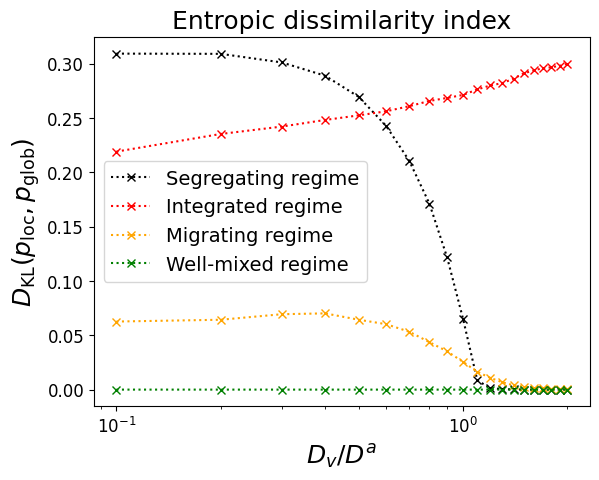

In [39]:
plt.semilogx(Dv_space/D[0], Dkl_indices[:,0], "x:k", label = "Segregating regime")
plt.semilogx(Dv_space/D[0], Dkl_indices[:,1], "x:r", label = "Integrated regime")
plt.semilogx(Dv_space/D[0], Dkl_indices[:,2], "x:", color= 'orange', label = "Migrating regime")
plt.semilogx(Dv_space/D[0], Dkl_indices[:,3], "x:g", label = "Well-mixed regime")
# plt.semilogx(D[0]/Dv_space, Dkl_indices_mig[:], "x:", color='orange', label = "Migrating regime")
plt.xlabel(r"$D_v/D^a$", size=18)
plt.ylabel(r"$D_{\rm KL}(p_{\rm loc}, p_{\rm glob})$", size=18)
plt.title(r"Entropic dissimilarity index", size=18)
plt.xticks(size=12)
plt.yticks(size=12)
plt.legend(fontsize=14)
plt.show()

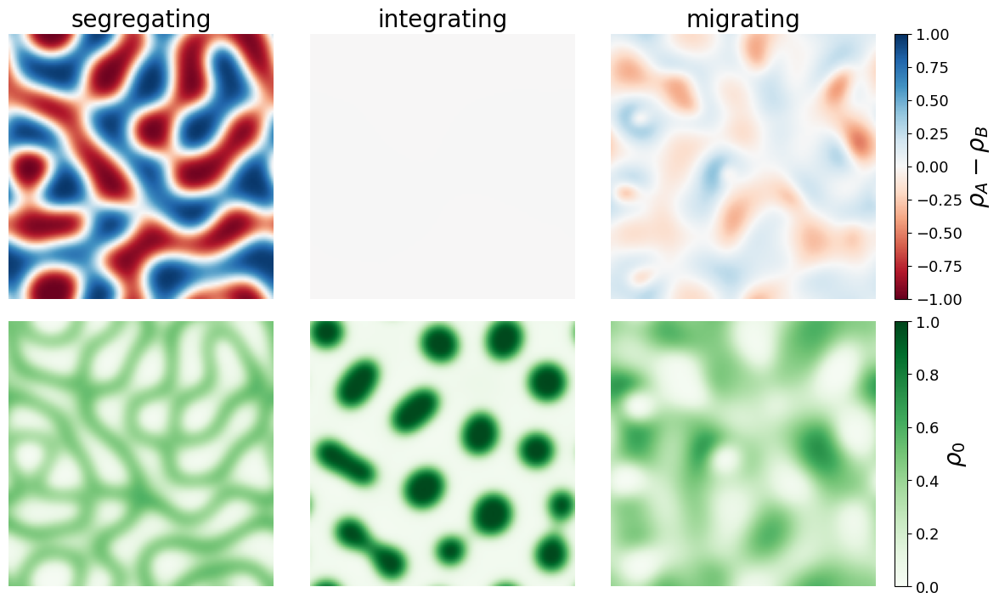

In [19]:
run = 1
Dv = 0.01

regimes = ["segregating", "integrating", "migrating"]

fig, ax = plt.subplots(
    2, 3,
    figsize=(12, 7),
    constrained_layout=True
)

ims_top = []
ims_bottom = []

for i, regime in enumerate(regimes):
    phi_run = np.load(f"data/{regime}/run_{run}_det_Dv{Dv:.2f}.npy")

    phi_diff = phi_run[0] - phi_run[1]
    phi_0 = 1 - phi_run.sum(axis=0)

    im1 = ax[0, i].imshow(
        phi_diff[-1],
        cmap="RdBu",
        aspect="equal",
        origin="lower",
        extent=[-Lx/2, Lx/2, -Ly/2, Ly/2],
        vmin=-1,
        vmax=1
    )

    im2 = ax[1, i].imshow(
        phi_0[-1],
        cmap="Greens",
        aspect="equal",
        origin="lower",
        extent=[-Lx/2, Lx/2, -Ly/2, Ly/2],
        vmin=0,
        vmax=1
    )

    ax[0, i].axis("off")
    ax[1, i].axis("off")

    ax[0, i].set_title(regime, fontsize=20)

    ims_top.append(im1)
    ims_bottom.append(im2)

# One colorbar per row, aligned with all axes in that row
cbar1 = fig.colorbar(
    ims_top[-1],
    ax=ax[0, :],
    location="right",
    fraction=0.035,
    pad=0.02
)
cbar1.set_label(r"$\rho_A - \rho_B$", size=20)

cbar2 = fig.colorbar(
    ims_bottom[-1],
    ax=ax[1, :],
    location="right",
    fraction=0.035,
    pad=0.02
)
cbar2.set_label(r"$\rho_0$", size=20)

plt.show()

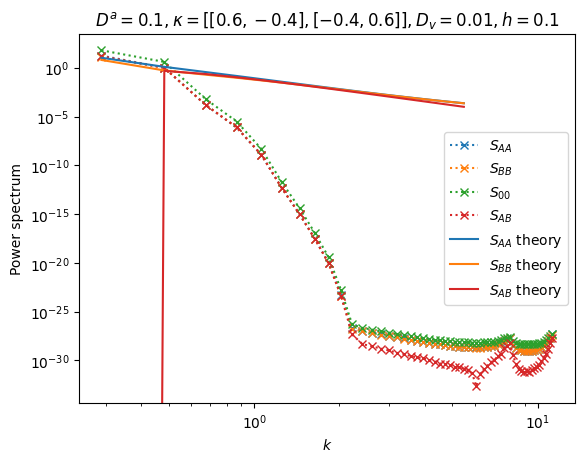

In [45]:
from structure_factor import *
from scipy.optimize import minimize

# averaging_bp = -200
# k_bins, power_spectra, G_AB = fhd.power_spectrum(phi_run, (Lx, Ly), num_bins=60, bp = averaging_bp, centered = True)
# param['h'] = 0.1
# # param['D_v'] = 0.1
regimes = ["segregating", "integrating", "migrating", "well-mixed"]
# regimes = ["migrating", "well-mixed"]
kappas = [np.array([[0.6, -0.4],[-0.4, 0.6]]), np.array([[0.6, 1], [1, 0.6]]),
np.array([[1, 1], [-1, 1]]), np.array([[0.6, 0.4], [0.6, 0.4]])]

regime_idx = 3
Dv_idx = 0
Dv = Dv_space[Dv_idx]

if regimes[regime_idx] == "segregating":
    param['kappa'] = kappas[0]
elif regimes[regime_idx] == "integrating":
    param['kappa'] = kappas[1]
elif regimes[regime_idx] == "migrating":
    param['kappa'] = kappas[2]
elif regimes[regime_idx] == "well-mixed":
    param['kappa'] = kappas[3]

power_spectra, G_AB = PS_matrix[Dv_idx, regime_idx], GAB_matrix[Dv_idx, regime_idx]


# param["D"] = D*np.ones(2)
param["D_v"] = Dv

S_AA_theory = np.zeros(len(k_bins))
S_AB_theory = np.zeros(len(k_bins))
S_BB_theory = np.zeros(len(k_bins))

for i, k in enumerate(k_bins):
    structure_factors = structure_factor(k,phi_run[0,averaging_bp:,:].mean(), phi_run[1,averaging_bp:,:].mean(), param)
    S_AA_theory[i] = structure_factors[0,0]
    S_AB_theory[i] = structure_factors[0,1]
    S_BB_theory[i] = structure_factors[1,1]

amp = 4000
theory_bp = 2
theory_ep = -30
k_bins_thy = k_bins[theory_bp: theory_ep]

def std_amp(amp, theory, data):
    AA = np.abs(amp*theory[0] - data[0])
    BB = np.abs(amp*theory[1] - data[1])
    AB = np.abs(amp*theory[2] - data[2])
    return np.std(np.array([AA,BB,AB]))

theory = np.array([S_AA_theory[theory_bp:theory_ep], S_BB_theory[theory_bp:theory_ep], np.abs(S_AB_theory[theory_bp:theory_ep])])
data = np.array([power_spectra[0,theory_bp:theory_ep],power_spectra[1,theory_bp:theory_ep], np.abs(G_AB[theory_bp:theory_ep])])
optamp = minimize(std_amp, amp, args = (theory, data))

# dk = k_bins[1]-k_bins[0]

amp=optamp.x
# amp = 1
plt.plot(k_bins[1:], power_spectra[0,1:], "x:", label = r"$S_{AA}$", color = 'tab:blue')
# plt.plot(k_max_AA, interpolate_func(k_max_AA), marker = "*", color = 'k')
plt.plot(k_bins[1:], power_spectra[1,1:], "x:", label = r"$S_{BB}$", color = 'tab:orange')
plt.plot(k_bins[1:], power_spectra[2,1:], "x:", label = r"$S_{00}$", color = 'tab:green')
plt.plot(k_bins[1:], np.abs(G_AB)[1:], "x:", label = r"$S_{AB}$", color = 'tab:red')
plt.plot(k_bins[1:theory_ep], amp*S_AA_theory[1:theory_ep].real, '-', label = r"$S_{AA}$ theory",  color = 'tab:blue')
plt.plot(k_bins[1:theory_ep], amp*S_BB_theory[1:theory_ep].real, '-', label = r"$S_{BB}$ theory", color = 'tab:orange')
plt.plot(k_bins[1:theory_ep], -amp*S_AB_theory[1:theory_ep], '-', label = r"$S_{AB}$ theory", color = 'tab:red')
plt.title(fr"$D^a = {param['D'][0]},  \kappa = [[{kappa_aa:.1f},{kappa_ab:.1f}],[{kappa_ba:.1f},{kappa_bb:.1f}]], D_v = {param['D_v']}, h = {param['h']}$")
plt.xscale('log')
plt.yscale('log')
plt.xlabel(r"$k$")
plt.ylabel(r"Power spectrum")
plt.legend()
plt.tight_layout
plt.show()

# Gifs

In [ ]:
import matplotlib.animation as animation
from IPython.display import HTML

import matplotlib as mpl
mpl.rcParams['animation.embed_limit'] = 1000.0  # Set limit to 100MB, for example



# Sample data for demonstration
t = phi_run.shape[1]  # Number of time steps


# Create figure and axis
fig, ax = plt.subplots(figsize=(4,4), dpi=180)
line_phi = []
# colors = ['C0', 'C1', 'C2']
# labels = [r'$\phi_a$', r'$\phi_b$', r'$\phi_0$']

# Initialize the plot lines
# for a in range(2):
ln = ax.imshow(phi_run[0,0]-phi_run[1,0], cmap = 'RdBu', aspect='equal', origin='upper', extent=[-Lx/2,Lx/2,-Ly/2,Ly/2], vmin=-1.0, vmax=1.0)
line_phi.append(ln)

# phi0 =  1-phi_run[:,0].sum(axis=0)
# ln, = ax.plot(x, phi0, lw =2, color = colors[2], label = labels[2], marker = '.')
# line_phi.append(ln)

# ax.set_ylim([0,1])
ax.set_xlabel('x')
ax.set_ylabel('y')
# ax.legend(loc = "upper right")

# Title with parameters
# title = fr"$D = {D},\, \kappa aa = {kappa_aa:.1f},\, \kappa ab = {kappa_ab:.1f},\, \kappa ba = {kappa_ba:.1f},\, \Gamma = {Gamma}, \, b={b}, \, d={d} $"
# plt.title(title)
# plt.title(fr"$D = {D[0]},\, \kappa aa = {kappa_aa:.1f},\, \kappa ab = {kappa_ab:.1f},\, \kappa ba = {kappa_ba:.1f},\, \Gamma = { Gamma[0,0]}, \, D_v = {D_v} $")
cbar = fig.colorbar(ln, fraction=0.046)
cbar.set_label(r"$\phi_a - \phi_b$",size=18)
# fig.tight_layout

# Update function for animation
def update(frame):
    # for a in range(2):
        # line_phi[a].set_data(x, phi_run[a, frame])
    line_phi[0].set_data(phi_run[0,frame]-phi_run[1,frame])
    return line_phi

# Create animation
ani = animation.FuncAnimation(fig, update, frames=t, blit=True, interval = 42)

# Save animation as GIF
# ani.save(f'gifs/Fluctuating_{regimes[reg_idx]}.gif', writer='pillow')
HTML(ani.to_jshtml())
